### Metrics

In [1]:
# import tensorflow.keras.backend as K
import numpy as np
def rho_risk2(y_true, y_pred, rho):
    #
    # This function calculates the quantile risk between the true and the predicted outputs
    #
    num1 = (y_true-y_pred)*rho*(y_true>=y_pred)
    num2 = (y_pred-y_true)*(1-rho)*(y_true<y_pred)
    den  = np.sum(np.abs(y_true), axis=None)
    
    return 2*(np.sum(num1, axis=None)+np.sum(num2, axis=None))/den

def nrmse(y_true, y_pred):
    #
    # The formula is:
    #           K.sqrt(K.mean(K.square(y_pred - y_true)))    
    #    NRMSE = -----------------------------------------------
    #           K.mean(K.sum(y_true))       
    #
    num = K.sqrt(K.mean(K.square(y_true - y_pred), axis=None))
    den = K.mean(K.abs(y_true), axis=None)
    
    return num / den

def rho_risk(y_true, y_pred, rho):
    #
    # This function calculates the quantile risk between the true and the predicted outputs
    #
    num = -np.sum(2*(y_pred-y_true)*(rho*(y_pred<=y_true)-(1-rho)*(y_pred>y_true)), axis=None)
    den  = np.sum(np.abs(y_true), axis=None)
    
    return num/den

def smape(y_true, y_pred):
    denominator = (np.abs(y_true) + np.abs(y_pred))
    diff = np.abs(y_true - y_pred) / denominator
    diff[denominator == 0] = 0.0
    return 200 * np.mean(diff)

def ND(y_pred, y_true):
    demoninator = np.sum(np.abs(y_true))
    diff = np.sum(np.abs(y_true - y_pred))
    return 1.0*diff/demoninator

def rmsle(y_pred, y_true) :
    assert len(y_true) == len(y_pred)
    return np.sqrt(np.mean((np.log(1+y_pred) - np.log(1+y_true))**2))

def NRMSE(y_pred, y_true):
    assert len(y_pred) == len(y_true)
    denominator = np.mean(np.abs(y_true))
    diff = np.sqrt(np.mean(((y_pred-y_true)**2)))
    return diff/denominator

def rho_risk22(y_pred,y_true,rho):
    assert len(y_pred) == len(y_true)
    diff1 = (y_true-y_pred)*rho*(y_true>=y_pred)
    diff2 = (y_pred-y_true)*(1-rho)*(y_true<y_pred)
    denominator = np.sum(y_true)
    return 2*(np.sum(diff1)+np.sum(diff2))/denominator

In [2]:
import scipy.stats as st

def quantize(mean, var, q):
    z_score = st.norm.ppf(q)
    return mean + z_score*var

In [3]:
import os 
import pandas as pd
import numpy as np

series = {'load':[0,59],
          'price':[59,90],
          'wind':[90, 147],
          'solar':[147, 183]}

datasets = ['power_system']
df_test_metric = pd.DataFrame(columns=['ND', 'NRMSE', 'QL10', 'QL50', 'QL90'])
horizons = [36]
folder = 'experiments'

for dataset in datasets:
    for horizon in horizons:
        if dataset == 'electricity':
            dname = 'base_model'
            k = 321
        else:
            dname = 'power_system_non_exogeneous'
            k = 183
        file_path = dname + '_%d' % horizon

        directory_path = os.path.join(folder, file_path)
        Y_true = np.load(os.path.join(directory_path, 'Y.npy'))[:,-horizon:]
        Y_hat_mean = np.load(os.path.join(directory_path, 'Y_hat_mean.npy'))
        Y_hat_std = np.load(os.path.join(directory_path, 'Y_hat_sig.npy'))
        #Y_indexes  = np.load(os.path.join(directory_path, 'Z.npy'))
                
        if dataset == 'electricity':
            Y_true = Y_true.reshape(k, int(Y_true.shape[0]/k)*horizon)[:,-5256:]#, 182, 0)
            Y_hat_mean = Y_hat_mean.reshape(k, int(Y_hat_mean.shape[0]/k)*horizon)[:,-5256:]#, 182, 0)
            Y_hat_std = Y_hat_std.reshape(k, int(Y_hat_std.shape[0]/k)*horizon)[:,-5256:]#, 182, 0)
        else:
            Y_true = Y_true.reshape(k, int(Y_true.shape[0]/k)*horizon)[:,-3816:]
            Y_hat_mean = Y_hat_mean.reshape(k, int(Y_hat_mean.shape[0]/k)*horizon)[:,-3816:]
            Y_hat_std = Y_hat_std.reshape(k, int(Y_hat_std.shape[0]/k)*horizon)[:,-3816:]
        
        _nd = ND(Y_hat_mean, Y_true)
        _nrmse = NRMSE(Y_hat_mean, Y_true)
        _pho_risk1 = rho_risk2(Y_true, quantize(Y_hat_mean, Y_hat_std, 0.1), 0.1)
        _pho_risk5 = rho_risk2(Y_true, quantize(Y_hat_mean, Y_hat_std, 0.5), 0.5)
        _pho_risk9 = rho_risk2(Y_true, quantize(Y_hat_mean, Y_hat_std, 0.9), 0.9)
        print('Loss metric %s %d ND: %f, NRMSE: %f, Ql10: %f, Ql50: %f, Ql90: %f' % (dataset,
                                                                                     horizon,
                                                                                     _nd,
                                                                                     _nrmse,
                                                                                     _pho_risk1,
                                                                                     _pho_risk5,
                                                                                     _pho_risk9))
        df_test_metric.loc[file_path] = [_nd, 
                                           _nrmse,
                                           _pho_risk1,
                                           _pho_risk5,
                                           _pho_risk9]
        if dataset == 'power_system':
            for key in series:
                y_true = Y_true[series[key][0]:series[key][1],:]
                y_pred = Y_hat_mean[series[key][0]:series[key][1],:]
                y_std = Y_hat_std[series[key][0]:series[key][1],:]
                
                _nd = ND(y_pred, y_true)
                _nrmse = NRMSE(y_pred, y_true)
                _pho_risk1 = rho_risk2(y_true, quantize(y_pred, y_std, 0.1), 0.1)
                _pho_risk5 = rho_risk2(y_true, quantize(y_pred, y_std, 0.5), 0.5)
                _pho_risk9 = rho_risk2(y_true, quantize(y_pred, y_std, 0.9), 0.9)
                print('Loss metric %s_%s  %d ND: %f, NRMSE: %f, Ql10: %f, Ql50: %f, Ql90: %f' % (dataset,
                                                                                                 key,
                                                                                                 horizon,
                                                                                                 _nd,
                                                                                                 _nrmse,
                                                                                                 _pho_risk1,
                                                                                                 _pho_risk5,
                                                                                                 _pho_risk9))
                df_test_metric.loc[file_path + '_' + key] = [_nd, 
                                                             _nrmse,
                                                             _pho_risk1,
                                                             _pho_risk5,
                                                             _pho_risk9]

#
# df_test_metric.reset_index().rename(columns={'index':'Scenario'}).to_csv('./save/test_metrics_nonex_2.csv', index=False)
# df_test_metric.head()

Loss metric power_system 36 ND: 0.105266, NRMSE: 0.299330, Ql10: 0.047559, Ql50: 0.105266, Ql90: 0.054472
Loss metric power_system_load  36 ND: 0.046885, NRMSE: 0.110120, Ql10: 0.026516, Ql50: 0.046885, Ql90: 0.019676
Loss metric power_system_price  36 ND: 0.247556, NRMSE: 0.369254, Ql10: 0.126333, Ql50: 0.247556, Ql90: 0.140724
Loss metric power_system_wind  36 ND: 0.441833, NRMSE: 1.067219, Ql10: 0.161118, Ql50: 0.441833, Ql90: 0.258329
Loss metric power_system_solar  36 ND: 0.296349, NRMSE: 0.948847, Ql10: 0.144652, Ql50: 0.296349, Ql90: 0.155747


In [5]:
Y_true

array([[3021.39, 2997.32, 2922.12, ..., 4985.01, 4762.28, 4666.39],
       [2225.6 , 2179.08, 2181.36, ..., 3733.93, 3625.88, 3440.51],
       [2271.88, 2208.6 , 2103.23, ..., 5617.44, 5263.09, 4979.89],
       ...,
       [   0.  ,    0.  ,    0.  , ...,    0.  ,    0.  ,    0.  ],
       [   0.  ,    0.  ,    0.  , ...,    0.  ,    0.  ,    0.  ],
       [   0.  ,    0.  ,    0.  , ...,    0.  ,    0.  ,    0.  ]],
      dtype=float32)

### Non-exogeneous 

In [4]:
import os 
import pandas as pd
import numpy as np

series = {'load':[0,59],
          'price':[59,90],
          'wind':[90, 147],
          'solar':[147, 183]}

datasets = ['power_system']
df_test_metric = pd.DataFrame(columns=['ND', 'NRMSE', 'QL10', 'QL50', 'QL90'])
horizons = [36]
folder = 'experiments'

for dataset in datasets:
    for horizon in horizons:
        if dataset == 'electricity':
            dname = 'base_model'
            k = 321
        else:
            dname = 'power_system_non_exogeneous'
            k = 183
        file_path = dname + '_%d' % horizon

        directory_path = os.path.join(folder, file_path)
        Y_true = np.load(os.path.join(directory_path, 'Y.npy'))[:,-horizon:]
        Y_hat_mean = np.load(os.path.join(directory_path, 'Y_hat_mean.npy'))
        Y_hat_std = np.load(os.path.join(directory_path, 'Y_hat_sig.npy'))
        #Y_indexes  = np.load(os.path.join(directory_path, 'Z.npy'))
                
        if dataset == 'electricity':
            Y_true = Y_true.reshape(k, int(Y_true.shape[0]/k)*horizon)[:,-5256:]#, 182, 0)
            Y_hat_mean = Y_hat_mean.reshape(k, int(Y_hat_mean.shape[0]/k)*horizon)[:,-5256:]#, 182, 0)
            Y_hat_std = Y_hat_std.reshape(k, int(Y_hat_std.shape[0]/k)*horizon)[:,-5256:]#, 182, 0)
        else:
            Y_true = Y_true.reshape(k, int(Y_true.shape[0]/k)*horizon)[:,-3816:]
            Y_hat_mean = Y_hat_mean.reshape(k, int(Y_hat_mean.shape[0]/k)*horizon)[:,-3816:]
            Y_hat_std = Y_hat_std.reshape(k, int(Y_hat_std.shape[0]/k)*horizon)[:,-3816:]
        
        _nd = ND(Y_hat_mean, Y_true)
        _nrmse = NRMSE(Y_hat_mean, Y_true)
        _pho_risk1 = rho_risk2(Y_true, quantize(Y_hat_mean, Y_hat_std, 0.1), 0.1)
        _pho_risk5 = rho_risk2(Y_true, quantize(Y_hat_mean, Y_hat_std, 0.5), 0.5)
        _pho_risk9 = rho_risk2(Y_true, quantize(Y_hat_mean, Y_hat_std, 0.9), 0.9)
        print('Loss metric %s %d ND: %f, NRMSE: %f, Ql10: %f, Ql50: %f, Ql90: %f' % (dataset,
                                                                                     horizon,
                                                                                     _nd,
                                                                                     _nrmse,
                                                                                     _pho_risk1,
                                                                                     _pho_risk5,
                                                                                     _pho_risk9))
        df_test_metric.loc[file_path] = [_nd, 
                                           _nrmse,
                                           _pho_risk1,
                                           _pho_risk5,
                                           _pho_risk9]
        if dataset == 'power_system':
            for key in series:
                y_true = Y_true[series[key][0]:series[key][1],:]
                y_pred = Y_hat_mean[series[key][0]:series[key][1],:]
                y_std = Y_hat_std[series[key][0]:series[key][1],:]
                
                _nd = ND(y_pred, y_true)
                _nrmse = NRMSE(y_pred, y_true)
                _pho_risk1 = rho_risk2(y_true, quantize(y_pred, y_std, 0.1), 0.1)
                _pho_risk5 = rho_risk2(y_true, quantize(y_pred, y_std, 0.5), 0.5)
                _pho_risk9 = rho_risk2(y_true, quantize(y_pred, y_std, 0.9), 0.9)
                print('Loss metric %s_%s  %d ND: %f, NRMSE: %f, Ql10: %f, Ql50: %f, Ql90: %f' % (dataset,
                                                                                                 key,
                                                                                                 horizon,
                                                                                                 _nd,
                                                                                                 _nrmse,
                                                                                                 _pho_risk1,
                                                                                                 _pho_risk5,
                                                                                                 _pho_risk9))
                df_test_metric.loc[file_path + '_' + key] = [_nd, 
                                                             _nrmse,
                                                             _pho_risk1,
                                                             _pho_risk5,
                                                             _pho_risk9]

#
df_test_metric.reset_index().rename(columns={'index':'Scenario'}).to_csv('./save/test_metrics_nonex_2.csv', index=False)
df_test_metric.head()

Loss metric power_system 36 ND: 0.105156, NRMSE: 0.299072, Ql10: 0.047413, Ql50: 0.105156, Ql90: 0.054351
Loss metric power_system_load  36 ND: 0.046802, NRMSE: 0.109644, Ql10: 0.026392, Ql50: 0.046802, Ql90: 0.019613
Loss metric power_system_price  36 ND: 0.247178, NRMSE: 0.368854, Ql10: 0.126257, Ql50: 0.247178, Ql90: 0.140863
Loss metric power_system_wind  36 ND: 0.441416, NRMSE: 1.067856, Ql10: 0.160843, Ql50: 0.441416, Ql90: 0.257710
Loss metric power_system_solar  36 ND: 0.296721, NRMSE: 0.949321, Ql10: 0.144439, Ql50: 0.296721, Ql90: 0.156049


,ND,NRMSE,QL10,QL50,QL90
power_system_non_exogeneous_36,0.105156,0.299072,0.047413,0.105156,0.054351
power_system_non_exogeneous_36_load,0.046802,0.109644,0.026392,0.046802,0.019613
power_system_non_exogeneous_36_price,0.247178,0.368854,0.126257,0.247178,0.140863
power_system_non_exogeneous_36_wind,0.441416,1.067856,0.160843,0.441416,0.257710
power_system_non_exogeneous_36_solar,0.296721,0.949321,0.144439,0.296721,0.156049


In [5]:
df_test_metric.head()

,ND,NRMSE,QL10,QL50,QL90
power_system_non_exogeneous_36,0.105266,0.299330,0.047559,0.105266,0.054472
power_system_non_exogeneous_36_load,0.046885,0.110120,0.026516,0.046885,0.019676
power_system_non_exogeneous_36_price,0.247556,0.369254,0.126333,0.247556,0.140724
power_system_non_exogeneous_36_wind,0.441833,1.067219,0.161118,0.441833,0.258329
power_system_non_exogeneous_36_solar,0.296349,0.948847,0.144652,0.296349,0.155747


### Fields 

In [8]:
import os 
import pandas as pd
import numpy as np

series = {'load':[0,59],
          'price':[59,90],
          'wind':[90, 147],
          'solar':[147, 183]}

datasets = ['power_system']
df_test_metric = pd.DataFrame(columns=['ND', 'NRMSE', 'QL10', 'QL50', 'QL90'])
horizons = [36]
folder = 'experiments'

for dataset in datasets:
    for horizon in horizons:
        data_list = []
        for key in series:
            if dataset == 'electricity':
                dname = 'base_model'
                k = 321
            else:
                dname = 'power_system'
                k = 183
            file_path = dname + '_%s_%d' % (key,horizon)
            print(file_path)
            directory_path = os.path.join(folder, file_path)
            Y_true = np.load(os.path.join(directory_path, 'Y.npy'))[:,-horizon:]
            Y_hat_mean = np.load(os.path.join(directory_path, 'Y_hat_mean.npy'))
            Y_hat_std = np.load(os.path.join(directory_path, 'Y_hat_sig.npy'))

            k = series[key][1] - series[key][0]
            Y_true = Y_true.reshape(k, int(Y_true.shape[0]/k)*horizon)[:,-3816:]
            Y_hat_mean = Y_hat_mean.reshape(k, int(Y_hat_mean.shape[0]/k)*horizon)[:,-3816:]
            Y_hat_std = Y_hat_std.reshape(k, int(Y_hat_std.shape[0]/k)*horizon)[:,-3816:]

            data_list.append([Y_true,Y_hat_mean,Y_hat_std])


        Y_true = np.concatenate((data_list[0][0],data_list[1][0],data_list[2][0],data_list[3][0]),axis=0)
        Y_hat_mean = np.concatenate((data_list[0][1],data_list[1][1],data_list[2][1],data_list[3][1]),axis=0)
        Y_hat_std = np.concatenate((data_list[0][2],data_list[1][2],data_list[2][2],data_list[3][2]),axis=0)
        
        _nd = ND(Y_hat_mean, Y_true)
        _nrmse = NRMSE(Y_hat_mean, Y_true)
        _pho_risk1 = rho_risk2(Y_true, quantize(Y_hat_mean, Y_hat_std, 0.1), 0.1)
        _pho_risk5 = rho_risk2(Y_true, quantize(Y_hat_mean, Y_hat_std, 0.5), 0.5)
        _pho_risk9 = rho_risk2(Y_true, quantize(Y_hat_mean, Y_hat_std, 0.9), 0.9)
        print('Loss metric %s %d ND: %f, NRMSE: %f, Ql10: %f, Ql50: %f, Ql90: %f' % (dataset,
                                                                                     horizon,
                                                                                     _nd,
                                                                                     _nrmse,
                                                                                     _pho_risk1,
                                                                                     _pho_risk5,
                                                                                     _pho_risk9))
        file_path = 'power_system_split'
        df_test_metric.loc[file_path] = [_nd, 
                                           _nrmse,
                                           _pho_risk1,
                                           _pho_risk5,
                                           _pho_risk9]
        if dataset == 'power_system':
            for key in series:
                y_true = Y_true[series[key][0]:series[key][1],:]
                y_pred = Y_hat_mean[series[key][0]:series[key][1],:]
                y_std = Y_hat_std[series[key][0]:series[key][1],:]
                
                _nd = ND(y_pred, y_true)
                _nrmse = NRMSE(y_pred, y_true)
                _pho_risk1 = rho_risk2(y_true, quantize(y_pred, y_std, 0.1), 0.1)
                _pho_risk5 = rho_risk2(y_true, quantize(y_pred, y_std, 0.5), 0.5)
                _pho_risk9 = rho_risk2(y_true, quantize(y_pred, y_std, 0.9), 0.9)
                print('Loss metric %s_%s  %d ND: %f, NRMSE: %f, Ql10: %f, Ql50: %f, Ql90: %f' % (dataset,
                                                                                                 key,
                                                                                                 horizon,
                                                                                                 _nd,
                                                                                                 _nrmse,
                                                                                                 _pho_risk1,
                                                                                                 _pho_risk5,
                                                                                                 _pho_risk9))
                df_test_metric.loc[file_path + '_' + key] = [_nd, 
                                                             _nrmse,
                                                             _pho_risk1,
                                                             _pho_risk5,
                                                             _pho_risk9]

#
df_test_metric.reset_index().rename(columns={'index':'Scenario'}).to_csv('./save/test_metrics_split.csv', index=False)
df_test_metric.head()

power_system_load_36
power_system_price_36
power_system_wind_36
power_system_solar_36
Loss metric power_system 36 ND: 0.095941, NRMSE: 0.293700, Ql10: 0.040267, Ql50: 0.095941, Ql90: 0.055976
Loss metric power_system_load  36 ND: 0.038592, NRMSE: 0.088647, Ql10: 0.019197, Ql50: 0.038592, Ql90: 0.018455
Loss metric power_system_price  36 ND: 0.134539, NRMSE: 0.224852, Ql10: 0.065222, Ql50: 0.134539, Ql90: 0.077156
Loss metric power_system_wind  36 ND: 0.433497, NRMSE: 1.123555, Ql10: 0.157331, Ql50: 0.433497, Ql90: 0.286067
Loss metric power_system_solar  36 ND: 0.262774, NRMSE: 0.917647, Ql10: 0.127655, Ql50: 0.262774, Ql90: 0.129827


,ND,NRMSE,QL10,QL50,QL90
power_system_split,0.095941,0.293700,0.040267,0.095941,0.055976
power_system_split_load,0.038592,0.088647,0.019197,0.038592,0.018455
power_system_split_price,0.134539,0.224852,0.065222,0.134539,0.077156
power_system_split_wind,0.433497,1.123555,0.157331,0.433497,0.286067
power_system_split_solar,0.262774,0.917647,0.127655,0.262774,0.129827


In [3]:
import os 
import pandas as pd
import numpy as np

series = {'load':[0,59],
          'price':[59,90],
          'wind':[90, 147],
          'solar':[147, 183]}

datasets = ['power_system', 'electricity']
df_test_metric = pd.DataFrame(columns=['ND', 'NRMSE', 'QL10', 'QL50', 'QL90'])
horizons = [3, 6, 12, 24, 36]
folder = 'experiments'

for dataset in datasets:
    for horizon in horizons:
        if dataset == 'electricity':
            dname = 'base_model'
            k = 321
        else:
            dname = 'power_system'
            k = 183
        file_path = dname + '_%d' % horizon
        if dataset=='power_system' and horizon==24:
            file_path = dname + '_%d_2' % horizon
        directory_path = os.path.join(folder, file_path)
        Y_true = np.load(os.path.join(directory_path, 'Y.npy'))[:,-horizon:]
        Y_hat_mean = np.load(os.path.join(directory_path, 'Y_hat_mean.npy'))
        Y_hat_std = np.load(os.path.join(directory_path, 'Y_hat_sig.npy'))
        #Y_indexes  = np.load(os.path.join(directory_path, 'Z.npy'))
                
        if dataset == 'electricity':
            Y_true = Y_true.reshape(k, int(Y_true.shape[0]/k)*horizon)[:,-5256:]#, 182, 0)
            Y_hat_mean = Y_hat_mean.reshape(k, int(Y_hat_mean.shape[0]/k)*horizon)[:,-5256:]#, 182, 0)
            Y_hat_std = Y_hat_std.reshape(k, int(Y_hat_std.shape[0]/k)*horizon)[:,-5256:]#, 182, 0)
        else:
            Y_true = Y_true.reshape(k, int(Y_true.shape[0]/k)*horizon)[:,-3816:]
            Y_hat_mean = Y_hat_mean.reshape(k, int(Y_hat_mean.shape[0]/k)*horizon)[:,-3816:]
            Y_hat_std = Y_hat_std.reshape(k, int(Y_hat_std.shape[0]/k)*horizon)[:,-3816:]
        
        _nd = ND(Y_hat_mean, Y_true)
        _nrmse = NRMSE(Y_hat_mean, Y_true)
        _pho_risk1 = rho_risk2(Y_true, quantize(Y_hat_mean, Y_hat_std, 0.1), 0.1)
        _pho_risk5 = rho_risk2(Y_true, quantize(Y_hat_mean, Y_hat_std, 0.5), 0.5)
        _pho_risk9 = rho_risk2(Y_true, quantize(Y_hat_mean, Y_hat_std, 0.9), 0.9)
        print('Loss metric %s %d ND: %f, NRMSE: %f, Ql10: %f, Ql50: %f, Ql90: %f' % (dataset,
                                                                                     horizon,
                                                                                     _nd,
                                                                                     _nrmse,
                                                                                     _pho_risk1,
                                     
                                                _pho_risk5,
                                                                                     _pho_risk9))
        df_test_metric.loc[file_path] = [_nd, 
                                           _nrmse,
                                           _pho_risk1,
                                           _pho_risk5,
                                           _pho_risk9]
        if dataset == 'power_system':
            for key in series:
                y_true = Y_true[series[key][0]:series[key][1],:]
                y_pred = Y_hat_mean[series[key][0]:series[key][1],:]
                y_std = Y_hat_std[series[key][0]:series[key][1],:]
                
                _nd = ND(y_pred, y_true)
                _nrmse = NRMSE(y_pred, y_true)
                _pho_risk1 = rho_risk2(y_true, quantize(y_pred, y_std, 0.1), 0.1)
                _pho_risk5 = rho_risk2(y_true, quantize(y_pred, y_std, 0.5), 0.5)
                _pho_risk9 = rho_risk2(y_true, quantize(y_pred, y_std, 0.9), 0.9)
                print('Loss metric %s_%s  %d ND: %f, NRMSE: %f, Ql10: %f, Ql50: %f, Ql90: %f' % (dataset,
                                                                                                 key,
                                                                                                 horizon,
                                                                                                 _nd,
                                                                                                 _nrmse,
                                                                                                 _pho_risk1,
                                                                                                 _pho_risk5,
                                                                                                 _pho_risk9))
                df_test_metric.loc[file_path + '_' + key] = [_nd, 
                                                             _nrmse,
                                                             _pho_risk1,
                                                             _pho_risk5,
                                                             _pho_risk9]

#
df_test_metric.reset_index().rename(columns={'index':'Scenario'}).to_csv('./save/test_metrics.csv', index=False)

Loss metric power_system 3 ND: 0.026342, NRMSE: 0.071950, Ql10: 0.012175, Ql50: 0.026342, Ql90: 0.012668
Loss metric power_system_load  3 ND: 0.012883, NRMSE: 0.029497, Ql10: 0.006488, Ql50: 0.012883, Ql90: 0.005817
Loss metric power_system_price  3 ND: 0.097068, NRMSE: 0.170343, Ql10: 0.048710, Ql50: 0.097068, Ql90: 0.057554
Loss metric power_system_wind  3 ND: 0.096901, NRMSE: 0.235826, Ql10: 0.041457, Ql50: 0.096901, Ql90: 0.048305
Loss metric power_system_solar  3 ND: 0.108609, NRMSE: 0.342249, Ql10: 0.048512, Ql50: 0.108609, Ql90: 0.055115
Loss metric power_system 6 ND: 0.038227, NRMSE: 0.112049, Ql10: 0.017483, Ql50: 0.038227, Ql90: 0.019652
Loss metric power_system_load  6 ND: 0.016172, NRMSE: 0.039177, Ql10: 0.008457, Ql50: 0.016172, Ql90: 0.007756
Loss metric power_system_price  6 ND: 0.118480, NRMSE: 0.203206, Ql10: 0.058267, Ql50: 0.118480, Ql90: 0.068434
Loss metric power_system_wind  6 ND: 0.153285, NRMSE: 0.386988, Ql10: 0.063844, Ql50: 0.153285, Ql90: 0.082775
Loss metri

In [4]:
import os 
import pandas as pd
import numpy as np

series = {'load':[0,59],
          'price':[59,90],
          'wind':[90, 147],
          'solar':[147, 183]}

datasets = ['power_system', 'electricity']
df_test_metric = pd.DataFrame(columns=['ND', 'NRMSE', 'QL10', 'QL50', 'QL90'])
horizons = [36]
folder = 'experiments'

for dataset in datasets:
    for horizon in horizons:
        if dataset == 'electricity':
            dname = 'base_model_hop'
            k = 321
            prefix = '_3'
        else:
            dname = 'power_system_hop'
            k = 183
            prefix = '_3'
        file_path = dname + '_%d%s' % (horizon, prefix)
        directory_path = os.path.join(folder, file_path)
        Y_true = np.load(os.path.join(directory_path, 'Y.npy'))[:,-horizon:]
        Y_hat_mean = np.load(os.path.join(directory_path, 'Y_hat_mean.npy'))
        Y_hat_std = np.load(os.path.join(directory_path, 'Y_hat_sig.npy'))
        #Y_indexes  = np.load(os.path.join(directory_path, 'Z.npy'))
                
        if dataset == 'electricity':
            Y_true = Y_true.reshape(k, int(Y_true.shape[0]/k)*horizon)[:,-5256:]#, 182, 0)
            Y_hat_mean = Y_hat_mean.reshape(k, int(Y_hat_mean.shape[0]/k)*horizon)[:,-5256:]#, 182, 0)
            Y_hat_std = Y_hat_std.reshape(k, int(Y_hat_std.shape[0]/k)*horizon)[:,-5256:]#, 182, 0)
        else:
            Y_true = Y_true.reshape(k, int(Y_true.shape[0]/k)*horizon)[:,-3816:]
            Y_hat_mean = Y_hat_mean.reshape(k, int(Y_hat_mean.shape[0]/k)*horizon)[:,-3816:]
            Y_hat_std = Y_hat_std.reshape(k, int(Y_hat_std.shape[0]/k)*horizon)[:,-3816:]
        
        _nd = ND(Y_hat_mean, Y_true)
        _nrmse = NRMSE(Y_hat_mean, Y_true)
        _pho_risk1 = rho_risk2(Y_true, quantize(Y_hat_mean, Y_hat_std, 0.1), 0.1)
        _pho_risk5 = rho_risk2(Y_true, quantize(Y_hat_mean, Y_hat_std, 0.5), 0.5)
        _pho_risk9 = rho_risk2(Y_true, quantize(Y_hat_mean, Y_hat_std, 0.9), 0.9)
        print('Loss metric %s %d ND: %f, NRMSE: %f, Ql10: %f, Ql50: %f, Ql90: %f' % (dataset,
                                                                                     horizon,
                                                                                     _nd,
                                                                                     _nrmse,
                                                                                     _pho_risk1,
                                     
                                                _pho_risk5,
                                                                                     _pho_risk9))
        df_test_metric.loc[file_path] = [_nd, 
                                           _nrmse,
                                           _pho_risk1,
                                           _pho_risk5,
                                           _pho_risk9]
        if dataset == 'power_system':
            for key in series:
                y_true = Y_true[series[key][0]:series[key][1],:]
                y_pred = Y_hat_mean[series[key][0]:series[key][1],:]
                y_std = Y_hat_std[series[key][0]:series[key][1],:]
                
                _nd = ND(y_pred, y_true)
                _nrmse = NRMSE(y_pred, y_true)
                _pho_risk1 = rho_risk2(y_true, quantize(y_pred, y_std, 0.1), 0.1)
                _pho_risk5 = rho_risk2(y_true, quantize(y_pred, y_std, 0.5), 0.5)
                _pho_risk9 = rho_risk2(y_true, quantize(y_pred, y_std, 0.9), 0.9)
                print('Loss metric %s_%s  %d ND: %f, NRMSE: %f, Ql10: %f, Ql50: %f, Ql90: %f' % (dataset,
                                                                                                 key,
                                                                                                 horizon,
                                                                                                 _nd,
                                                                                                 _nrmse,
                                                                                                 _pho_risk1,
                                                                                                 _pho_risk5,
                                                                                                 _pho_risk9))
                df_test_metric.loc[file_path + '_' + key] = [_nd, 
                                                             _nrmse,
                                                             _pho_risk1,
                                                             _pho_risk5,
                                                             _pho_risk9]

#
df_test_metric.reset_index().rename(columns={'index':'Scenario'}).to_csv('./save/test_metrics_hop_3.csv', index=False)

Loss metric power_system 36 ND: 0.155534, NRMSE: 0.394904, Ql10: 0.070887, Ql50: 0.155534, Ql90: 0.092154
Loss metric power_system_load  36 ND: 0.094554, NRMSE: 0.209499, Ql10: 0.048536, Ql50: 0.094554, Ql90: 0.056875
Loss metric power_system_price  36 ND: 0.486891, NRMSE: 0.652785, Ql10: 0.215615, Ql50: 0.486891, Ql90: 0.209632
Loss metric power_system_wind  36 ND: 0.544004, NRMSE: 1.176772, Ql10: 0.202788, Ql50: 0.544004, Ql90: 0.323492
Loss metric power_system_solar  36 ND: 0.402376, NRMSE: 0.986687, Ql10: 0.184723, Ql50: 0.402376, Ql90: 0.222493
Loss metric electricity 36 ND: 0.102282, NRMSE: 0.907091, Ql10: 0.049971, Ql50: 0.102282, Ql90: 0.065540


In [6]:
df_test_metric

,ND,NRMSE,QL10,QL50,QL90
power_system_hop_36_3,0.181725,0.444577,0.092052,0.181725,0.097053
power_system_hop_36_3_load,0.100235,0.204516,0.056028,0.100235,0.046666
power_system_hop_36_3_price,0.334235,0.488975,0.195643,0.334235,0.183469
power_system_hop_36_3_wind,0.650255,1.493071,0.270487,0.650255,0.420547
power_system_hop_36_3_solar,0.639285,1.632517,0.359255,0.639285,0.302211
base_model_hop_36,0.113069,0.988578,0.053453,0.113069,0.069993


In [4]:
df_test_metric

,ND,NRMSE,QL10,QL50,QL90
power_system_hop_36,0.165459,0.395867,0.076561,0.165459,0.096014
power_system_hop_36_load,0.100228,0.210229,0.041777,0.100228,0.051878
power_system_hop_36_price,0.286468,0.408454,0.146298,0.286468,0.147547
power_system_hop_36_wind,0.526550,1.122801,0.274672,0.526550,0.388462
power_system_hop_36_solar,0.564022,1.183094,0.276046,0.564022,0.255628
base_model_hop_36,0.113069,0.988578,0.053453,0.113069,0.069993


In [1]:
import numpy as np 
a = np.load('./experiments/base_model_36/Y.npy')[:,-36:]
a2 = np.load('./experiments/base_model_36/Y_hat_mean.npy')#[:,-36:]
a.shape

(46866, 36)

In [19]:
os.mkdir('./experiments/power_system_hop_36')

In [9]:
k = 321
horizon = 36
#Y_true.reshape(k, (Y_true.shape[0]/k)*horizon)[0,:]
np.delete(a.reshape(k, int(a.shape[0]/k)*horizon)[:,-5256:], 182, 0).shape
#a.reshape(k, int(a.shape[0]/k)*horizon)[:,-5256:].shape

(320, 5256)

In [5]:
z = np.load('./experiments/base_model_36/Z.npy')#[:,-36:]
z

array([  0,   0,   0, ..., 320, 320, 320])

In [5]:
v = np.load('./experiments/base_model_36/V.npy')[:,0]
v

array([  20.826347,   15.401197,   10.700599, ..., 3026.7246  ,
       3047.6047  , 3023.9102  ], dtype=float32)

In [6]:
a[np.argwhere(z==0).reshape(219),:][0,:]

ValueError: cannot reshape array of size 146 into shape (219,)

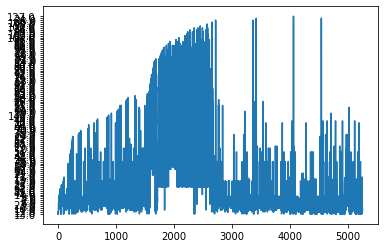

In [322]:
import pandas as pd 
plt.plot(pd.read_csv('./data/elect/electricity.csv', sep=",", 
                     index_col=0, parse_dates=True, decimal=',').iloc[-5256:,0].values)#.plot()

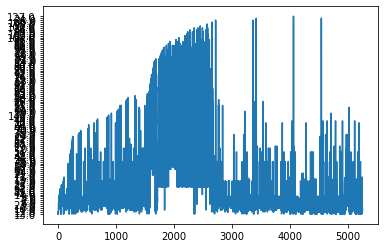

In [346]:
plt.plot(pd.read_csv('./data/elect/electricity.csv', sep=",", 
                     index_col=0, parse_dates=True, decimal=',').astype(float).values[-5256:,0])

In [337]:
true = pd.read_csv('./data/elect/electricity.csv', sep=",", 
                     index_col=0, parse_dates=True, decimal=',').astype(float).values[-5256:,0]

In [296]:
v[np.argwhere(z==0)][:,0]#[-1,:]

array([57.596386 , 49.168674 , 45.42771  , 45.54819  , 43.373493 ,
       35.551514 , 30.58788  , 30.596386 , 30.789156 , 26.325302 ,
       18.403614 , 14.162651 , 14.604791 , 17.15569  , 25.8503   ,
       34.1497   , 42.035927 , 49.826347 , 56.808384 , 64.556885 ,
       69.13174  , 68.61677  , 68.38922  , 68.05988  , 67.449104 ,
       66.97006  , 66.48503  , 66.38922  , 66.81437  , 67.28742  ,
       67.61078  , 68.20359  , 68.82036  , 69.73054  , 70.60479  ,
       70.646706 , 70.76048  , 70.97605  , 71.17365  , 71.08383  ,
       70.86826  , 70.17365  , 70.05988  , 69.98203  , 65.77245  ,
       57.64072  , 49.892216 , 41.730537 , 33.75449  , 25.17964  ,
       16.431137 , 12.311378 , 11.982036 , 11.532934 , 11.305389 ,
       11.155688 , 11.053892 , 11.335329 , 11.437126 , 11.598803 ,
       11.508982 , 11.826347 , 12.299401 , 12.395209 , 12.215569 ,
       11.856287 , 11.550899 , 11.497006 , 11.2634735, 11.053892 ,
       11.257485 , 11.580838 , 11.748503 , 11.497006 , 11.4251

In [2]:
v = np.load('./experiments/base_model_36/test_label_elect.npy')[:,-36:]
v.shape

(46866, 36)

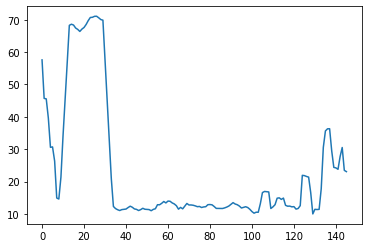

In [222]:
arg = np.argwhere(x==0).reshape(146)
plt.plot(v[arg])
7# for i in list(arg):
#     a[i,:]*=v[i]#.shape#.reshape(146*36)

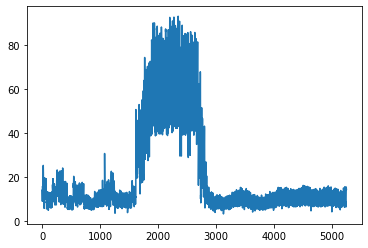

In [17]:
plt.plot(a2.reshape(321, 146*36)[0,:])

In [339]:
a[np.argwhere(x==0).reshape(146),:].reshape(146*24)

array([14., 11., 11., ..., 11., 11., 11.], dtype=float32)

In [139]:
a[np.argwhere(x==0).reshape(146),:].shape

(146, 36)

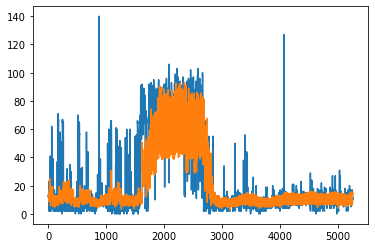

In [9]:
import matplotlib.pyplot as plt
v = np.load('./experiments/base_model_36/test_label_elect.npy')[:,-36:]
#plt.plot(v[np.argwhere(z==0).reshape(146),:].reshape(146*36))
plt.plot(a[np.argwhere(z==0).reshape(146),:].reshape(146*36)[:])
plt.plot(a2[np.argwhere(z==0).reshape(146),:].reshape(146*36))

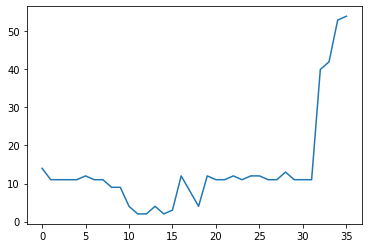

In [262]:
plt.plot(a[np.argwhere(x==0).reshape(146),:].reshape(146*36)[:36])


0


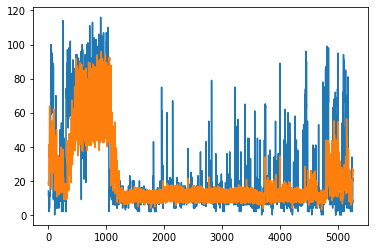

1


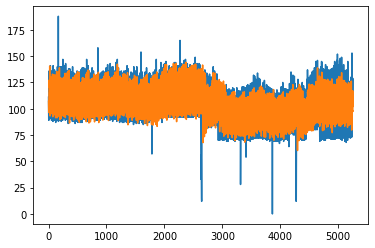

2


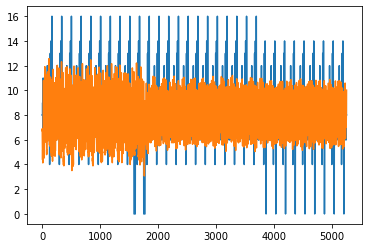

3


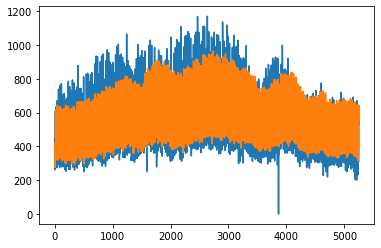

4


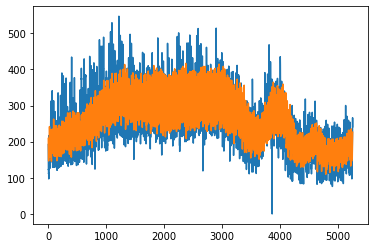

5


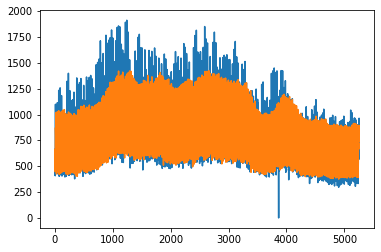

6


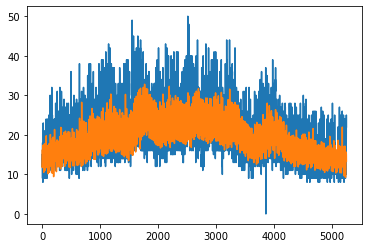

7


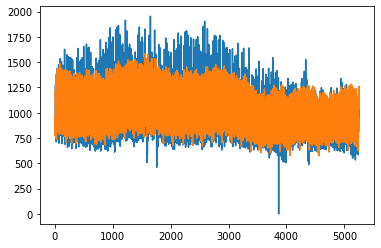

8


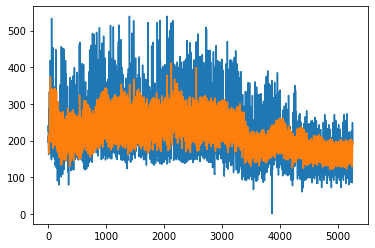

9


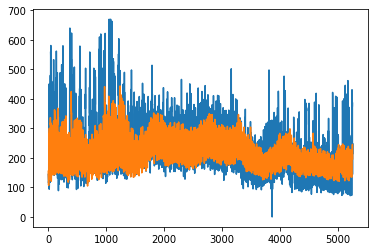

10


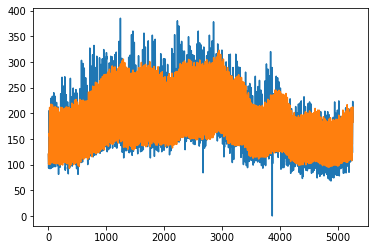

11


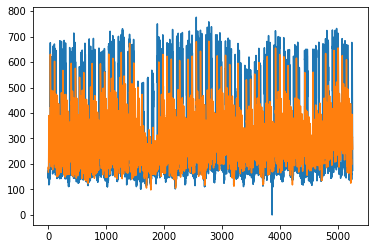

12


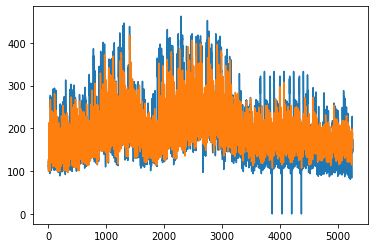

13


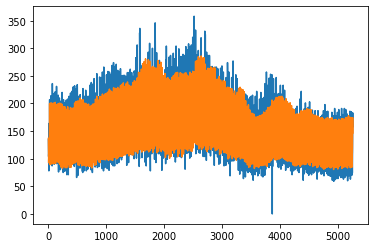

14


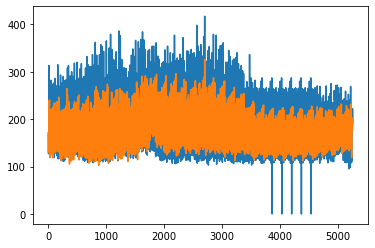

15


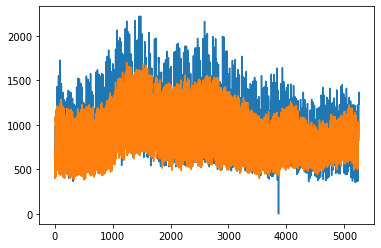

16


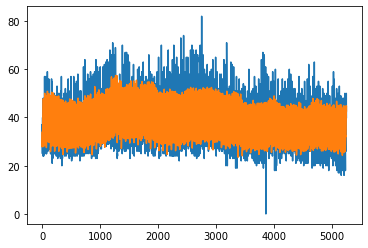

17


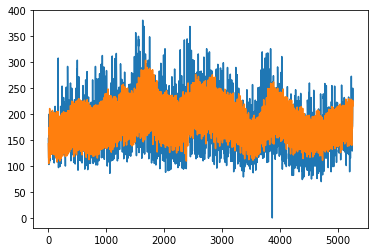

18


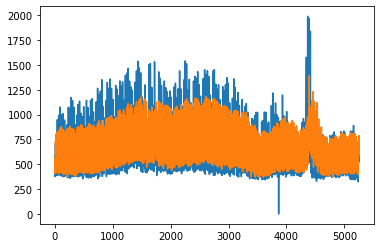

19


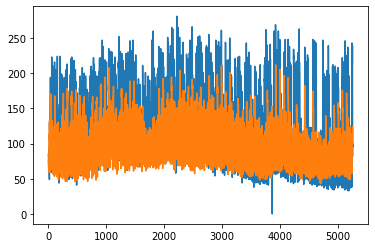

20


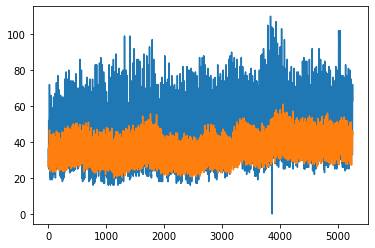

21


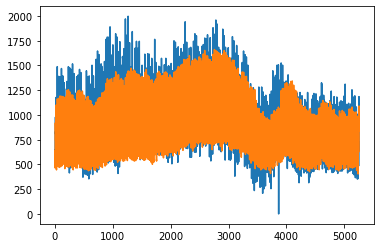

22


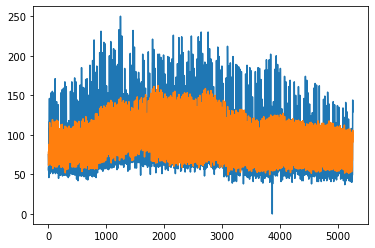

23


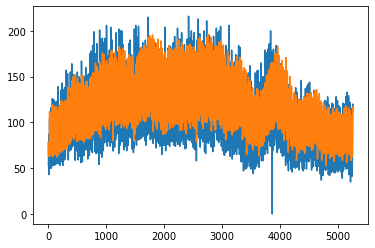

24


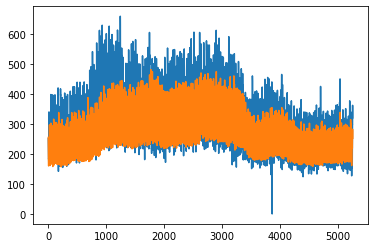

25


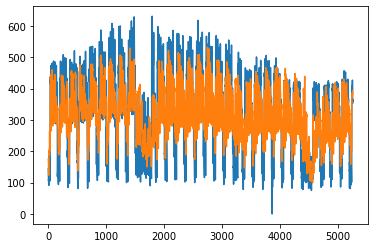

26


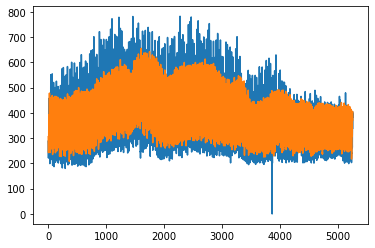

27


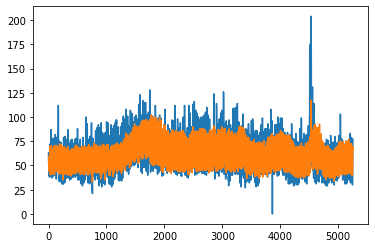

28


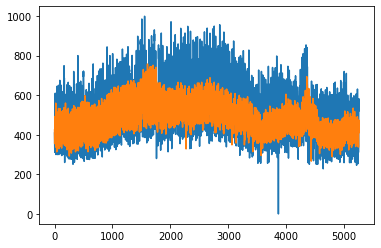

29


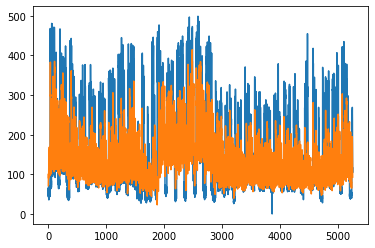

30


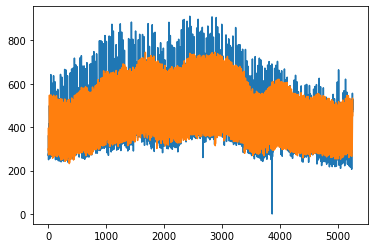

31


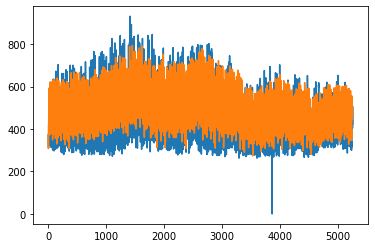

32


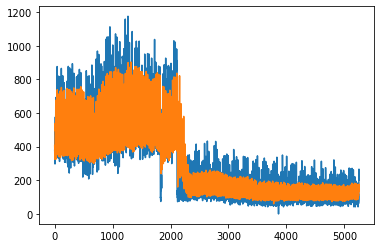

33


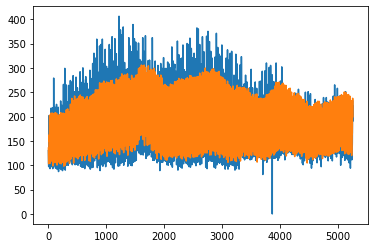

34


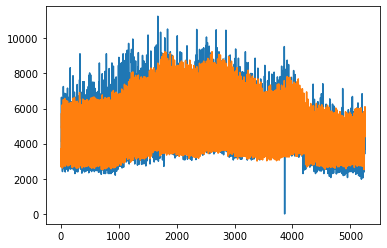

35


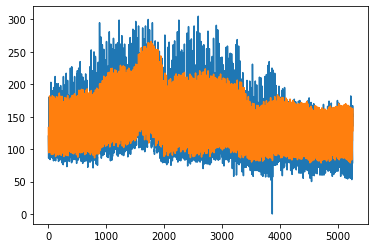

36


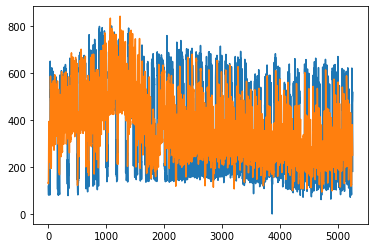

37


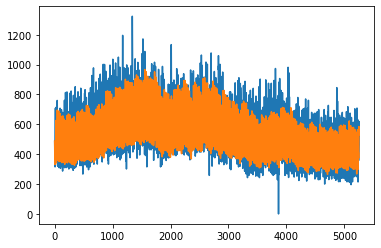

38


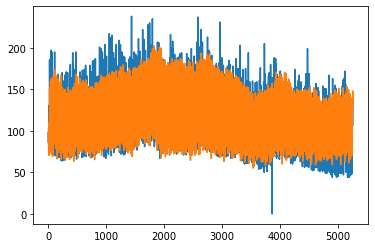

39


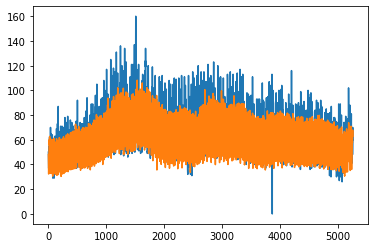

40


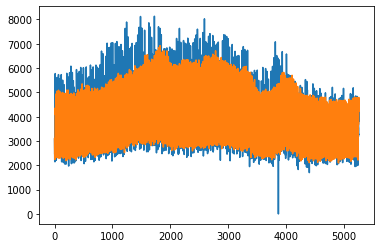

41


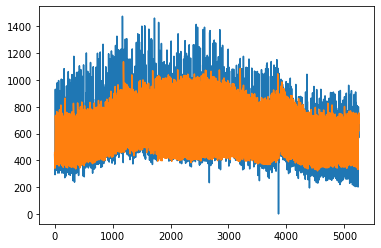

42


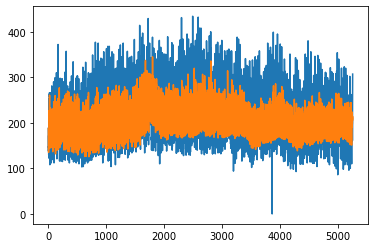

43


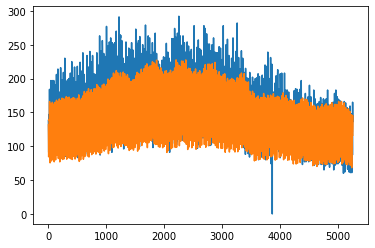

44


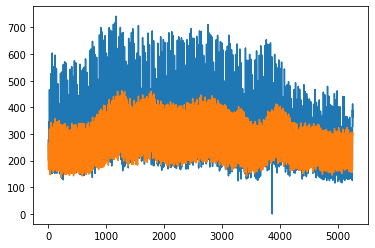

45


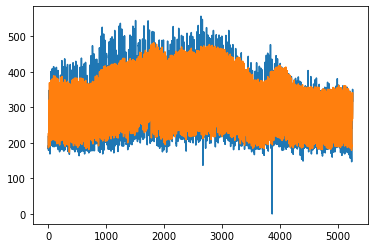

46


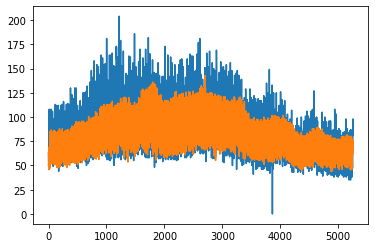

47


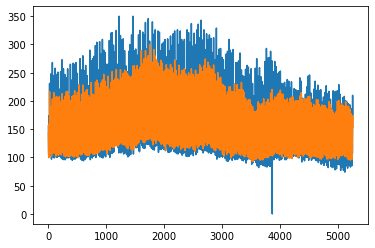

48


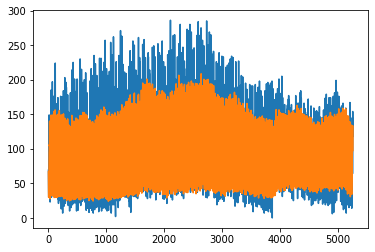

49


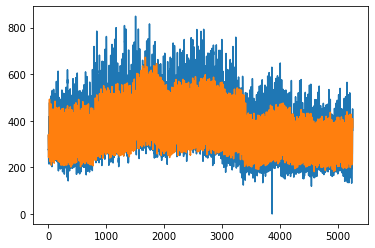

50


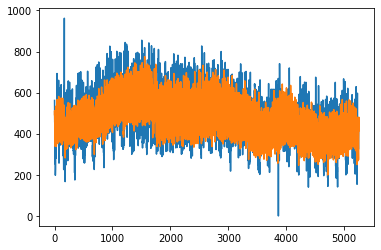

51


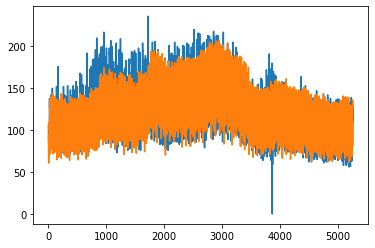

52


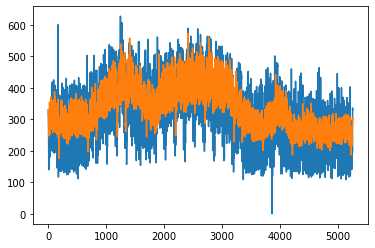

53


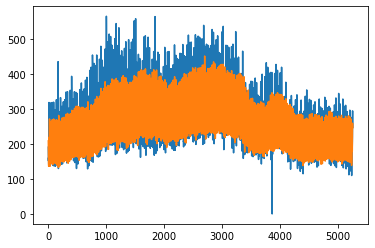

54


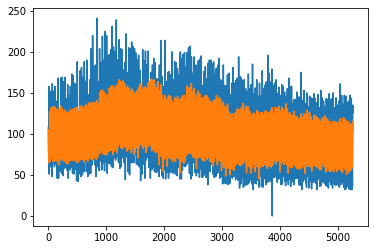

55


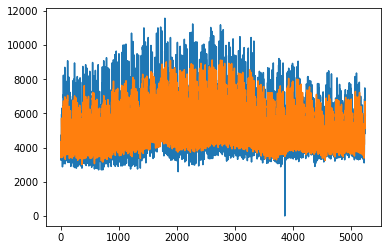

56


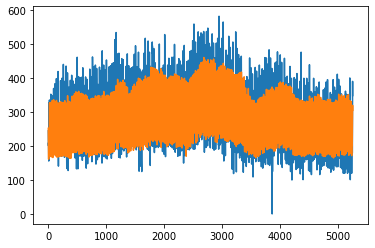

57


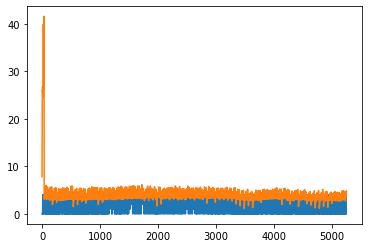

58


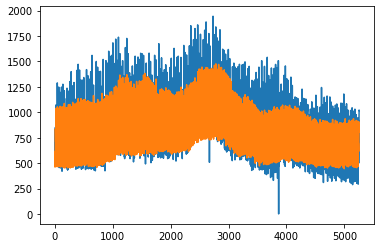

59


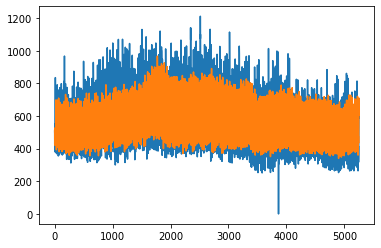

60


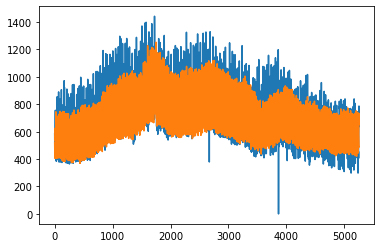

61


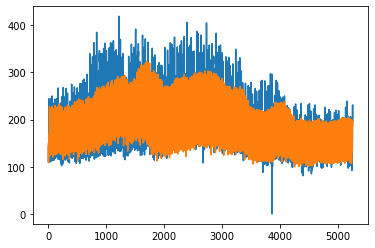

62


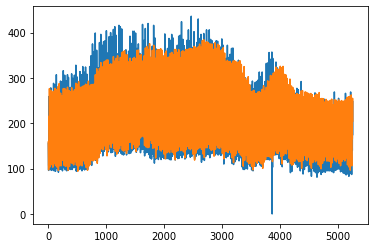

63


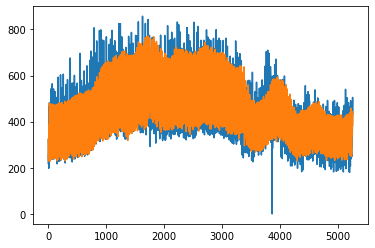

64


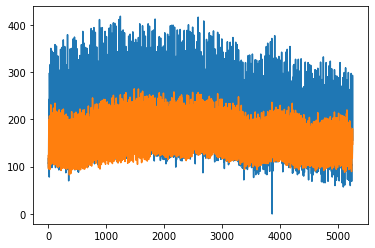

65


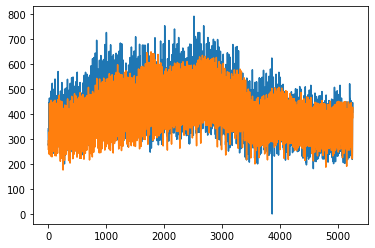

66


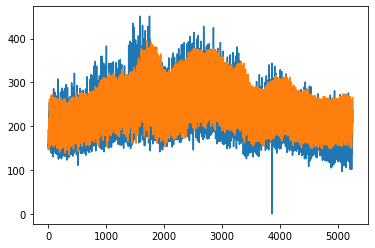

67


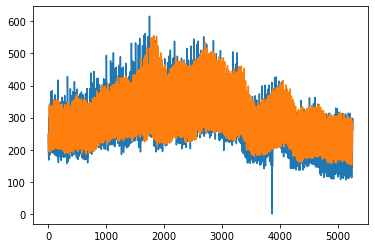

68


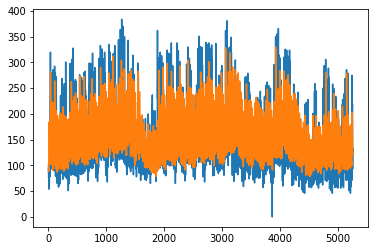

69


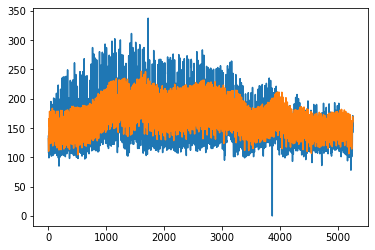

70


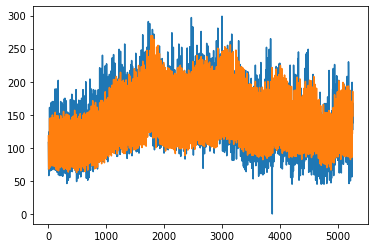

71


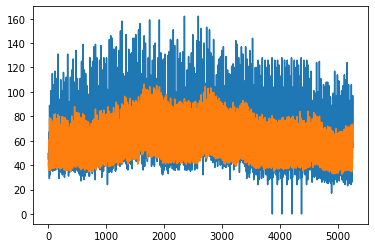

72


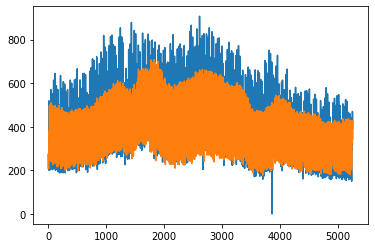

73


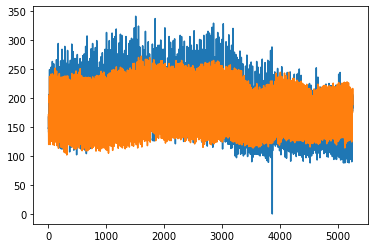

74


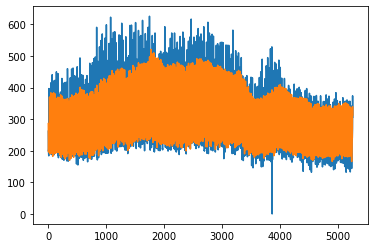

75


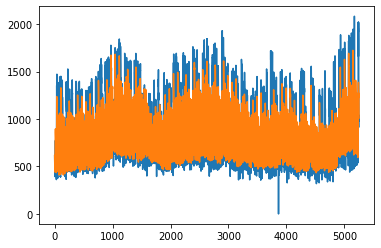

76


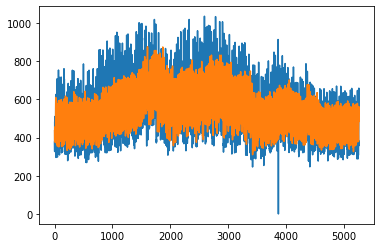

77


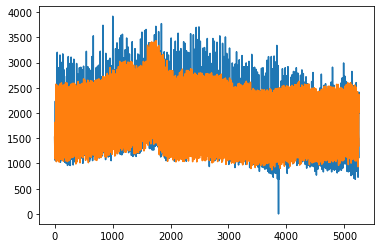

78


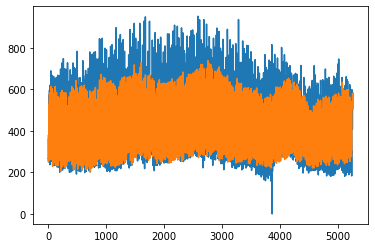

79


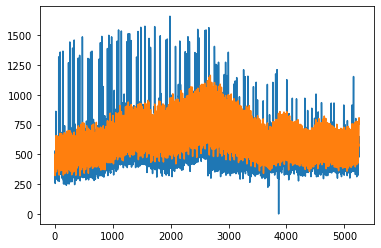

80


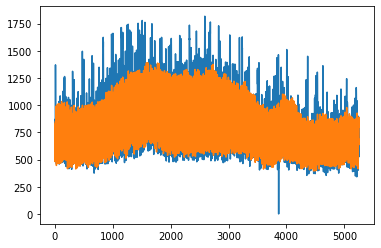

81


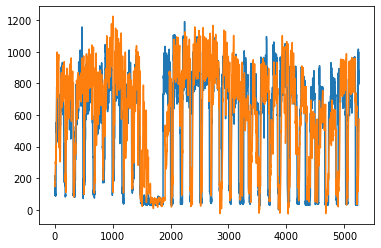

82


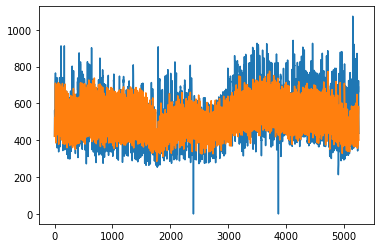

83


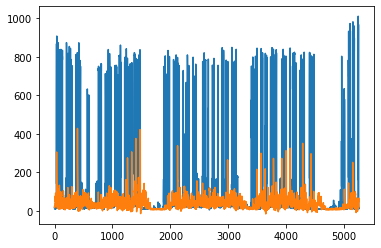

84


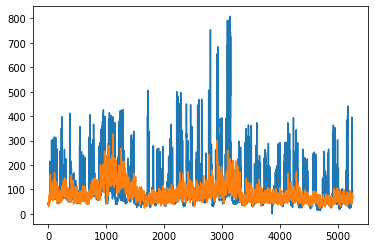

85


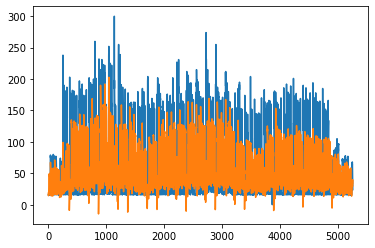

86


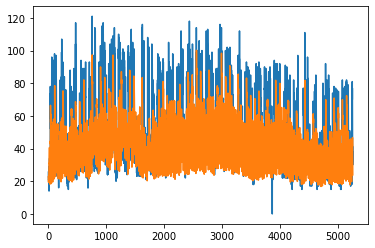

87


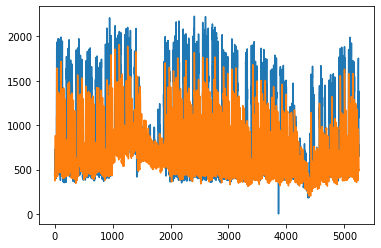

88


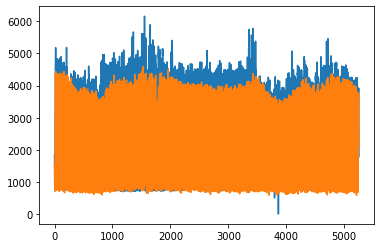

89


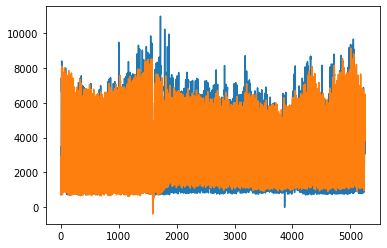

90


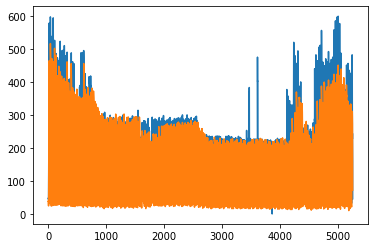

91


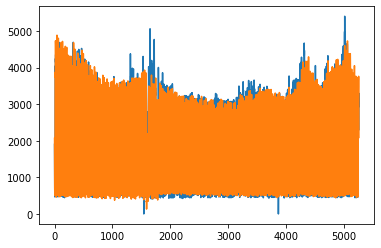

92


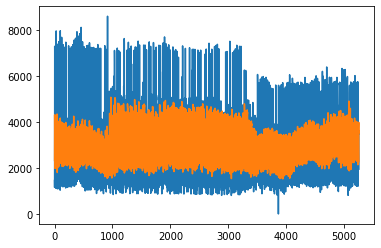

93


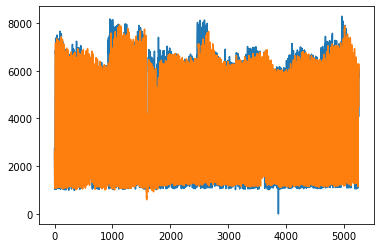

94


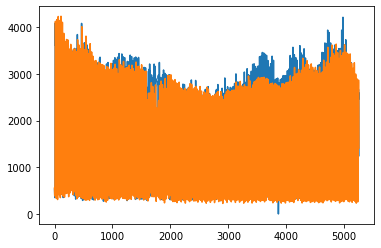

95


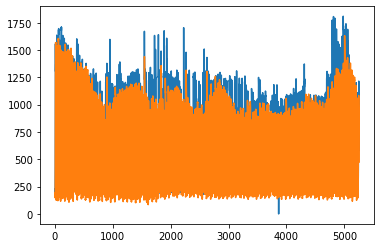

96


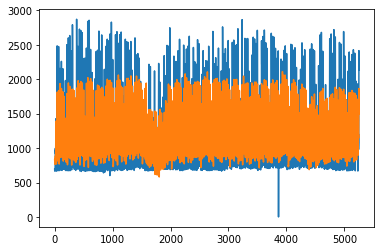

97


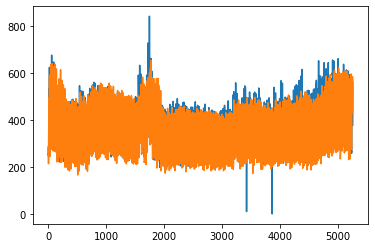

98


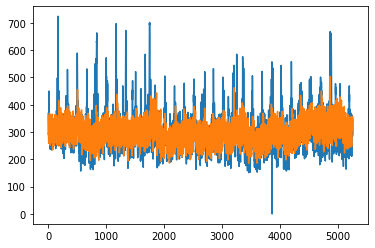

99


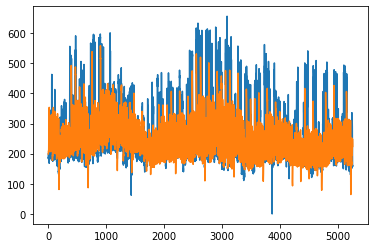

100


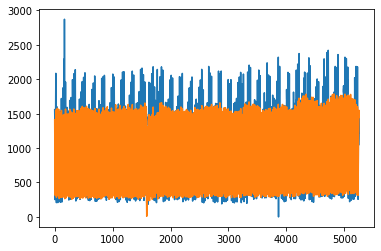

101


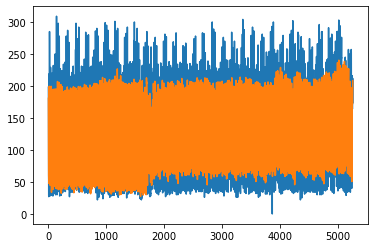

102


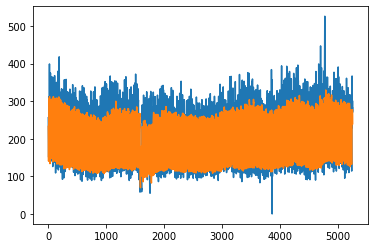

103


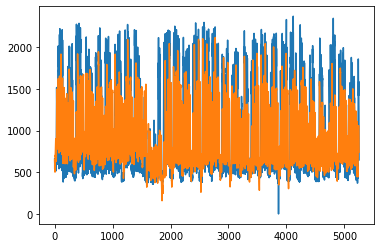

104


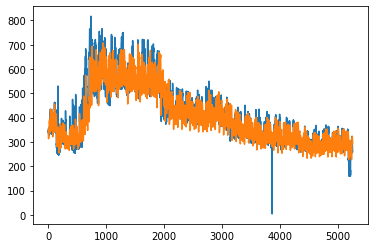

105


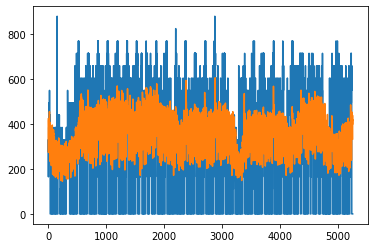

106


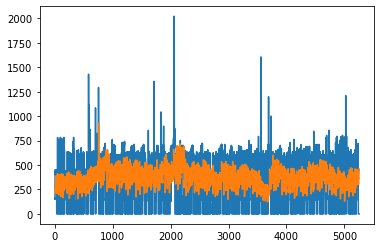

107


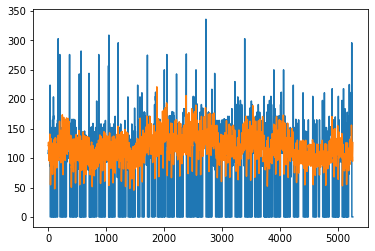

108


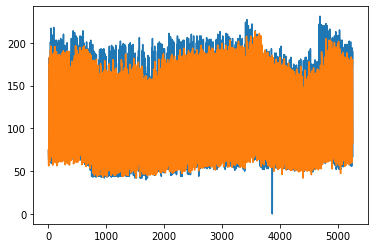

109


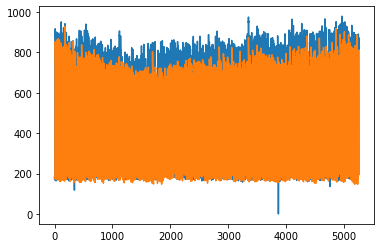

110


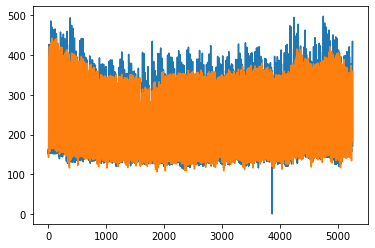

111


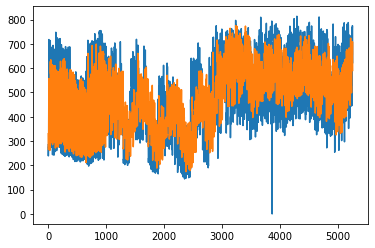

112


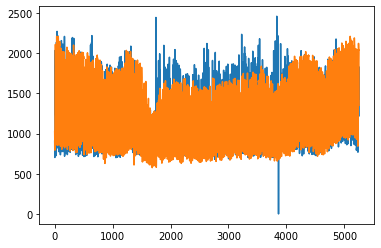

113


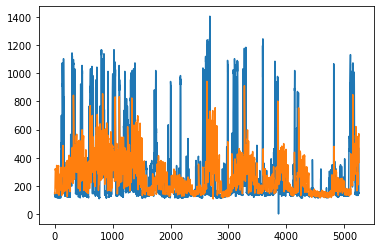

114


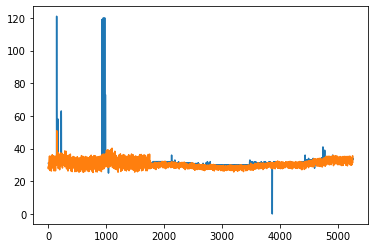

115


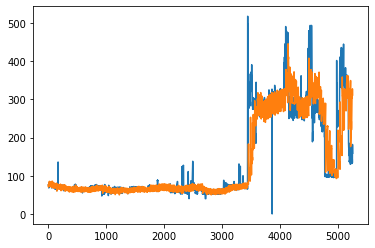

116


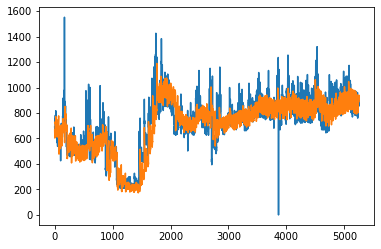

117


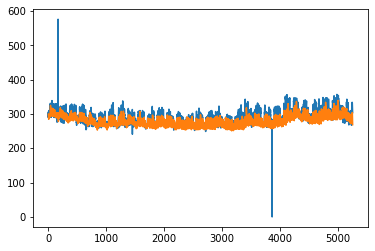

118


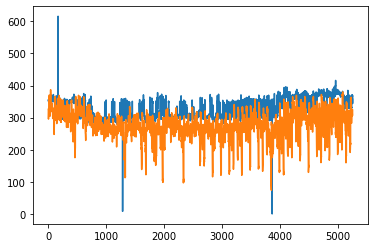

119


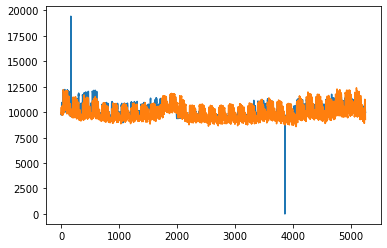

120


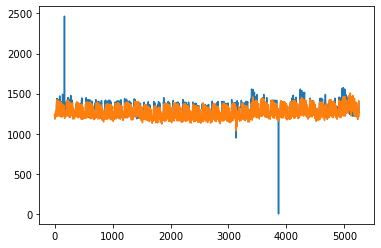

121


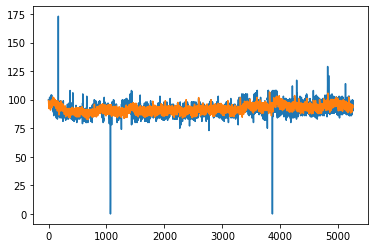

122


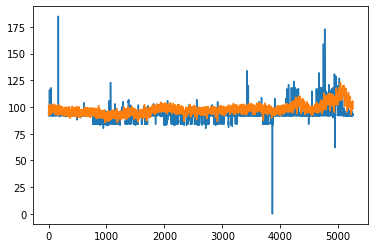

123


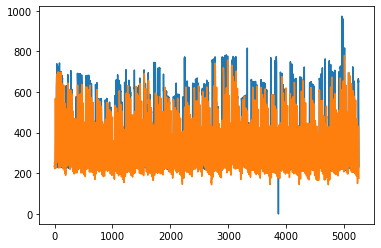

124


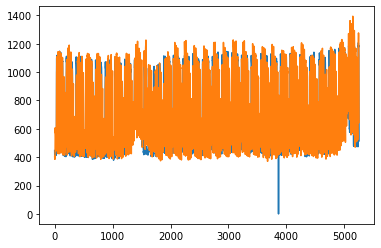

125


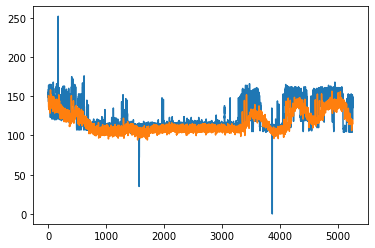

126


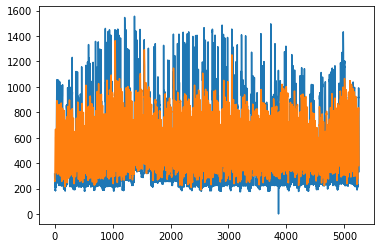

127


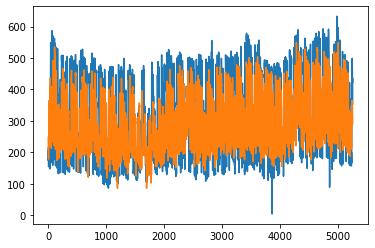

128


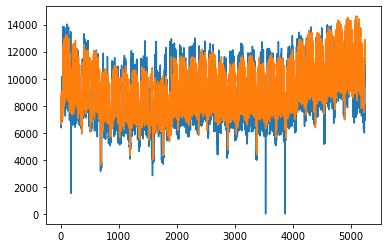

129


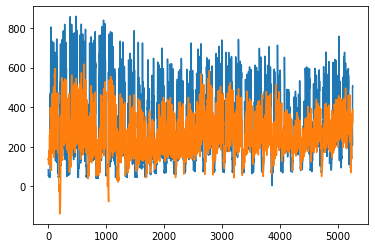

130


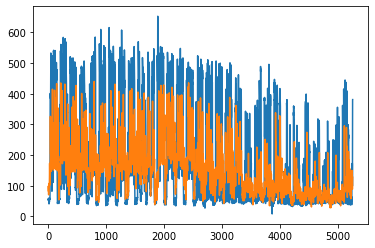

131


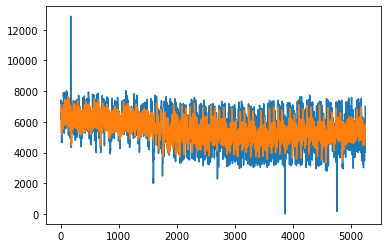

132


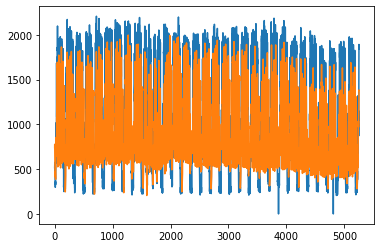

133


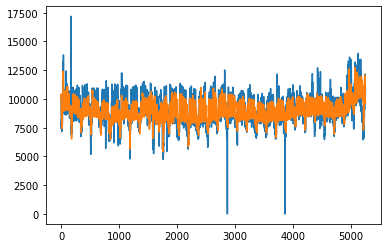

134


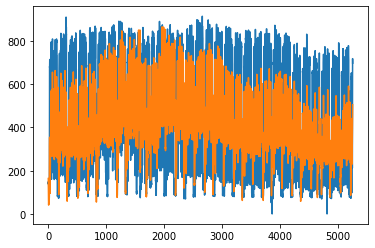

135


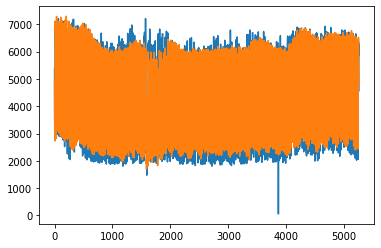

136


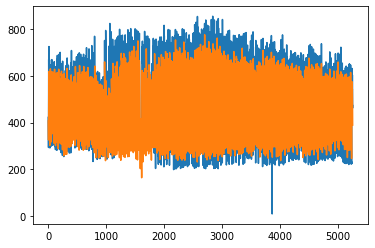

137


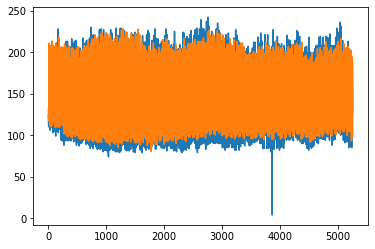

138


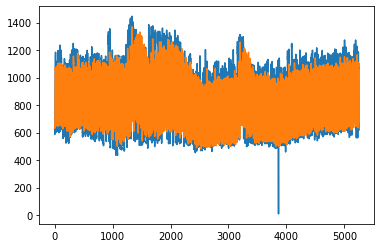

139


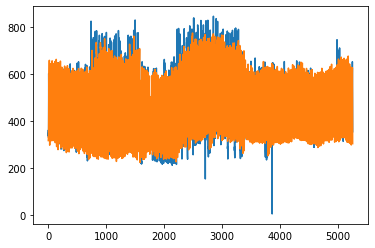

140


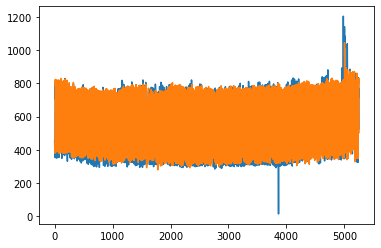

141


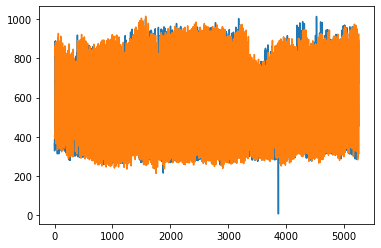

142


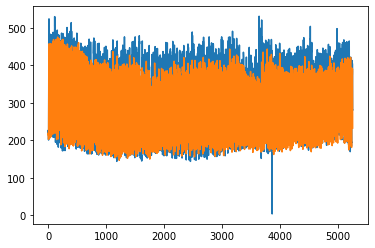

143


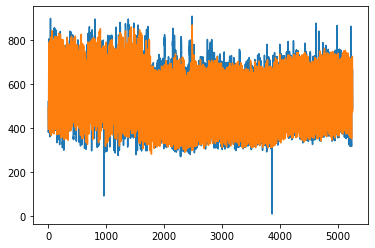

144


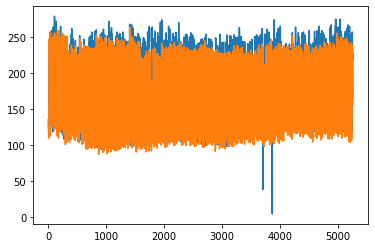

145


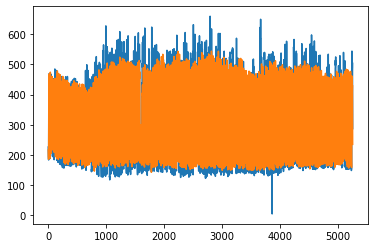

146


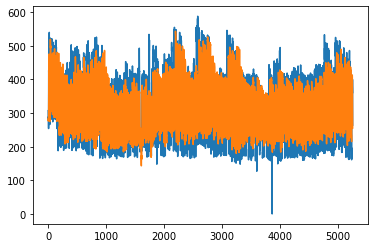

147


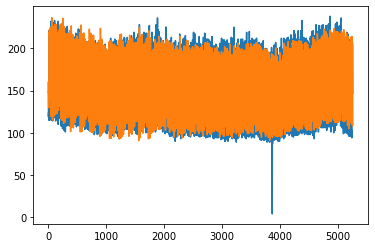

148


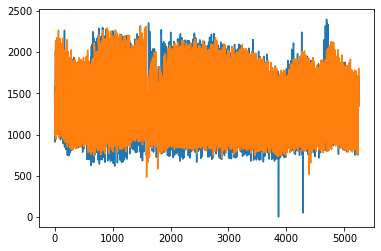

149


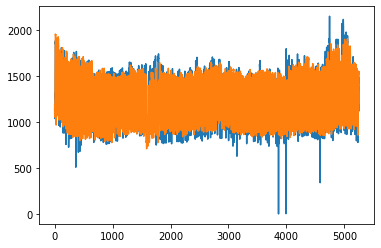

150


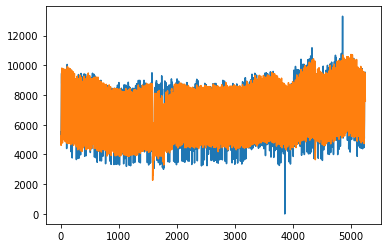

151


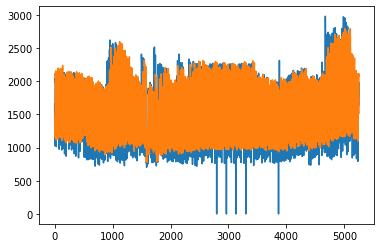

152


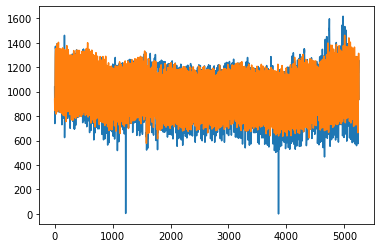

153


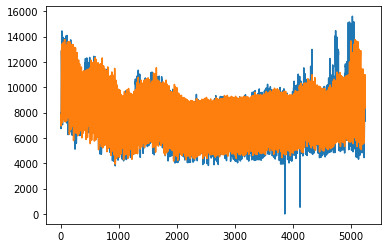

154


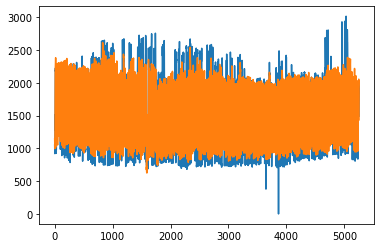

155


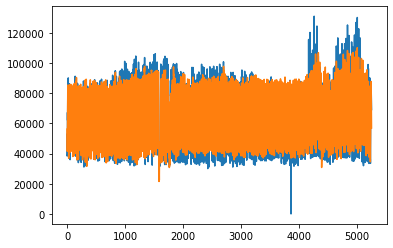

156


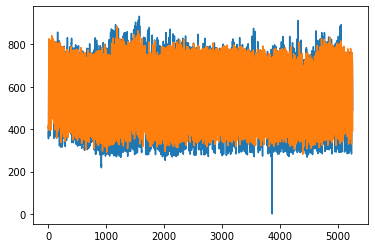

157


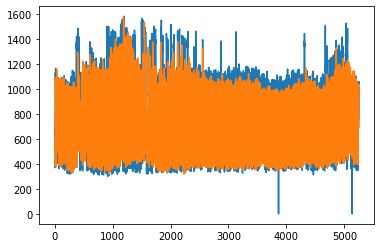

158


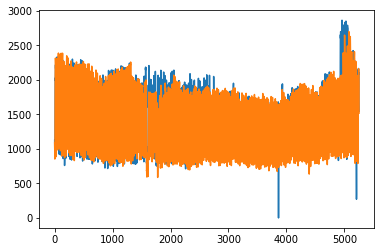

159


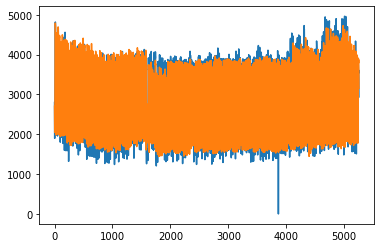

160


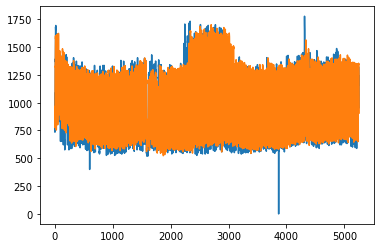

161


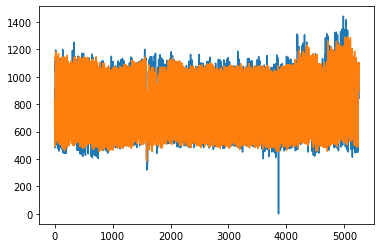

162


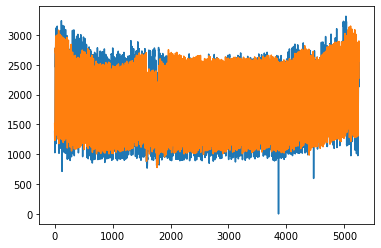

163


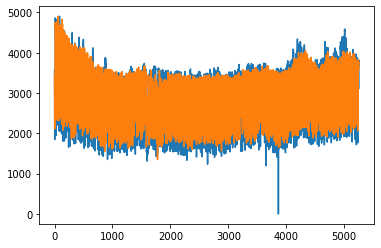

164


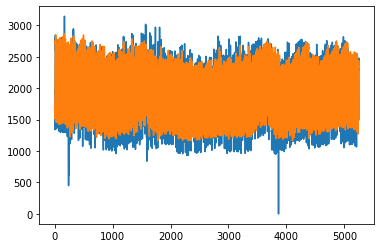

165


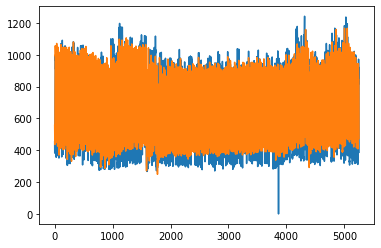

166


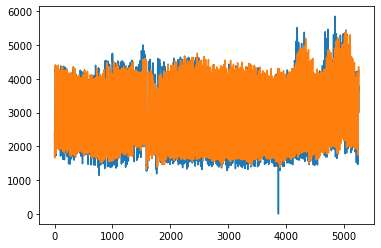

167


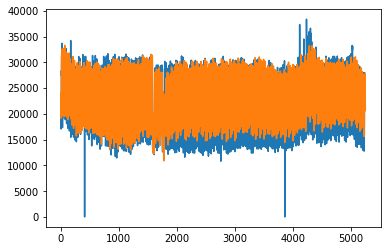

168


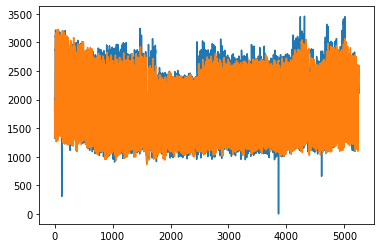

169


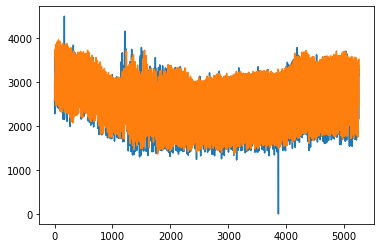

170


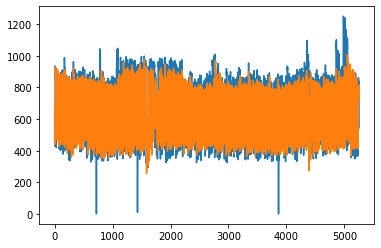

171


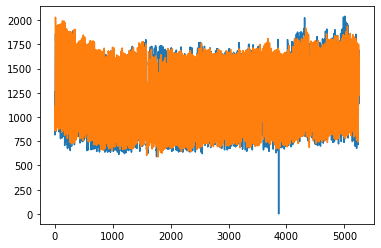

172


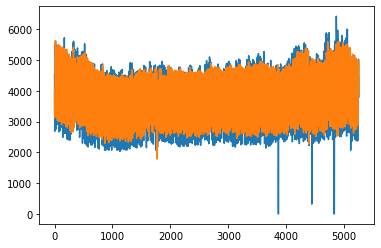

173


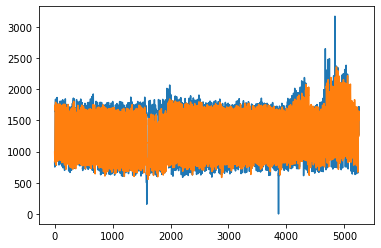

174


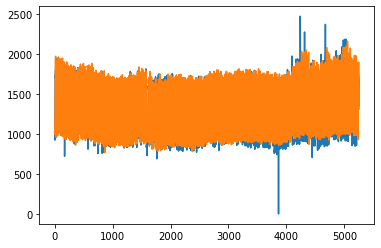

175


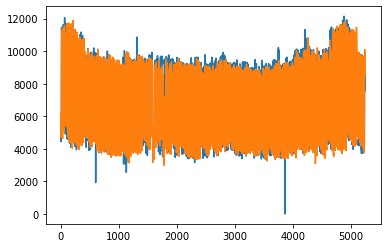

176


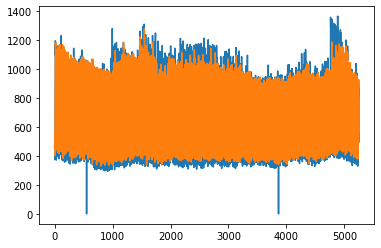

177


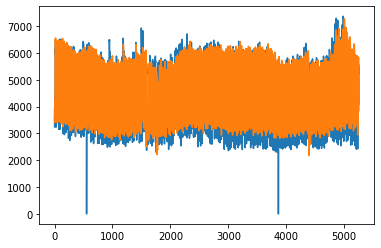

178


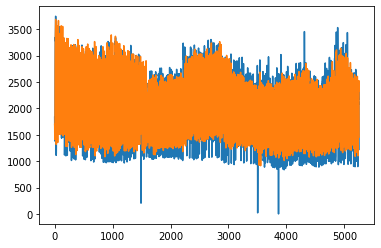

179


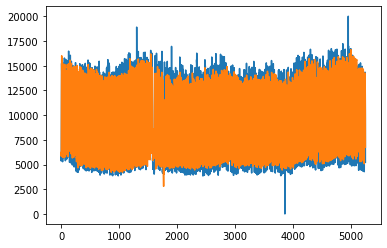

180


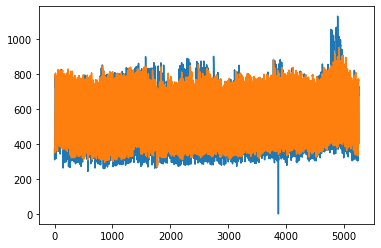

181


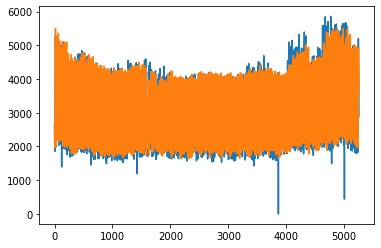

182


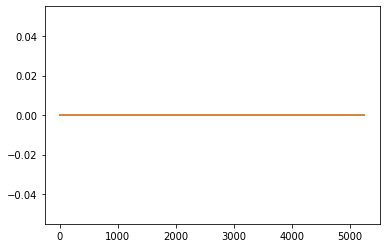

183


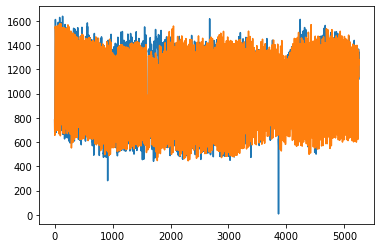

184


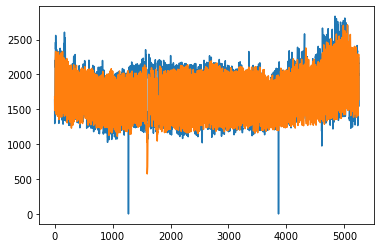

185


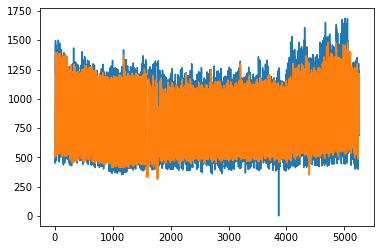

186


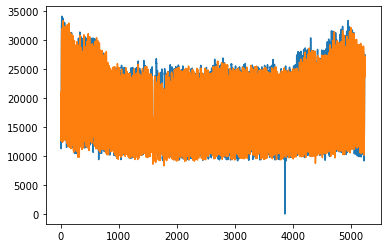

187


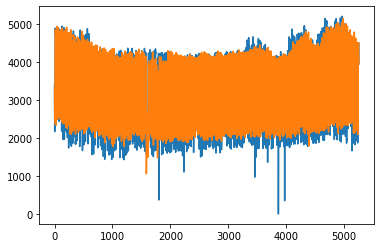

188


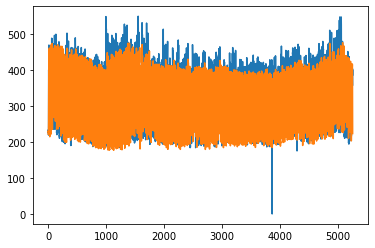

189


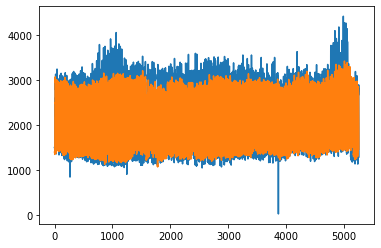

190


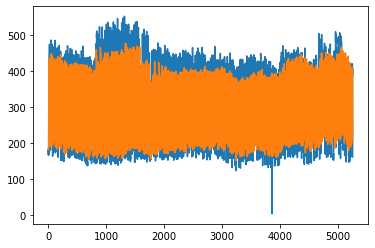

191


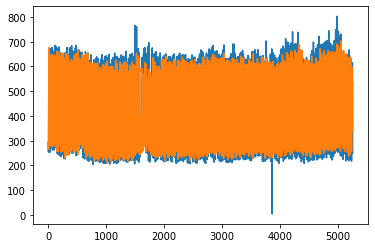

192


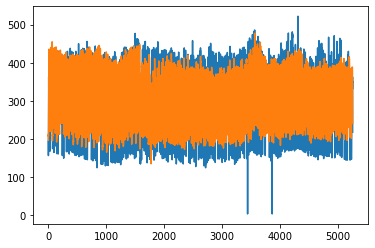

193


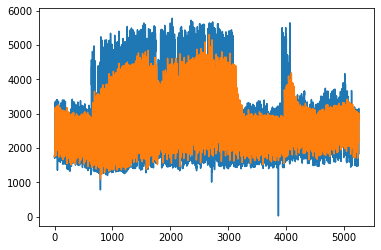

194


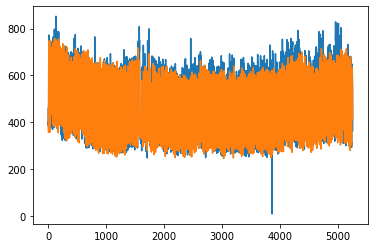

195


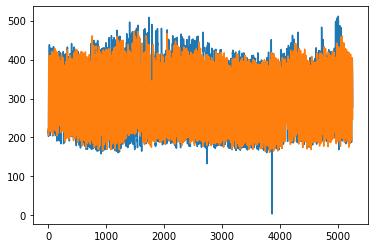

196


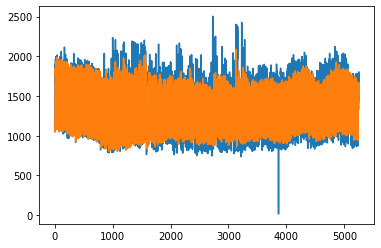

197


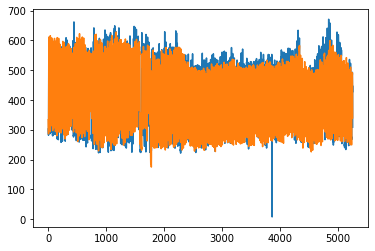

198


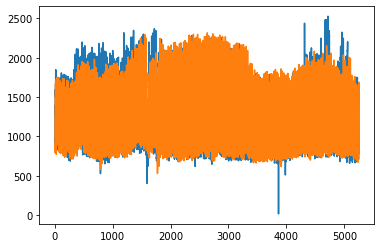

199


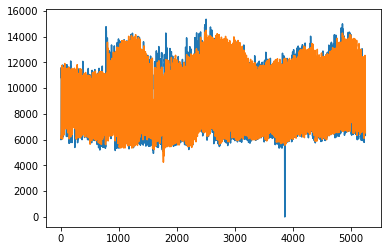

200


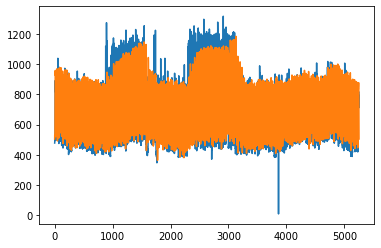

201


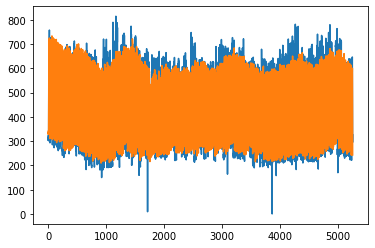

202


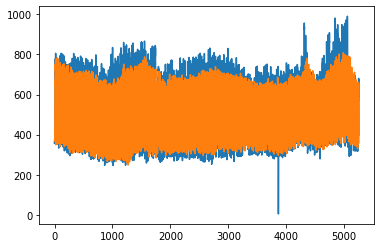

203


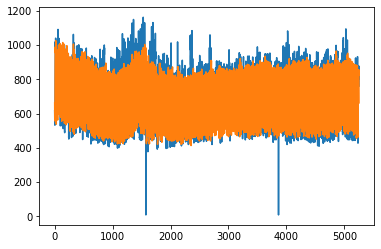

204


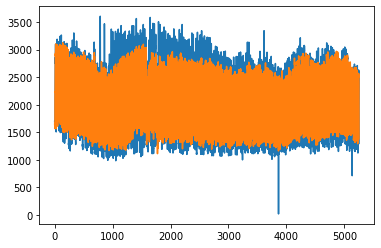

205


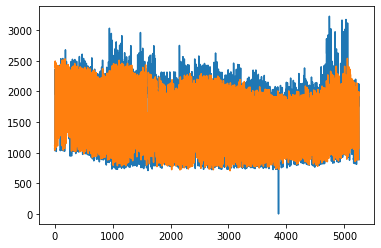

206


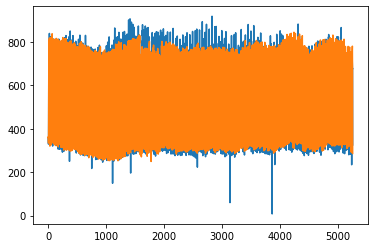

207


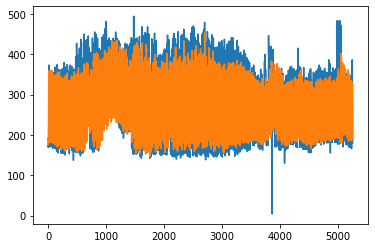

208


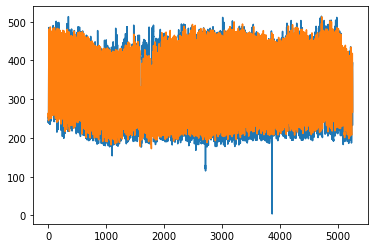

209


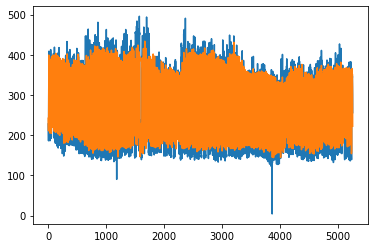

210


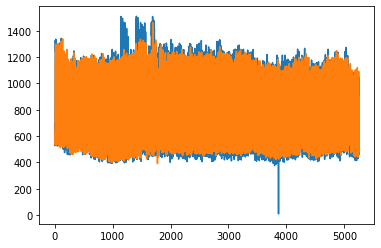

211


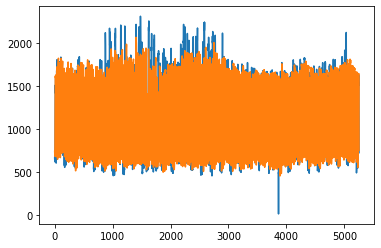

212


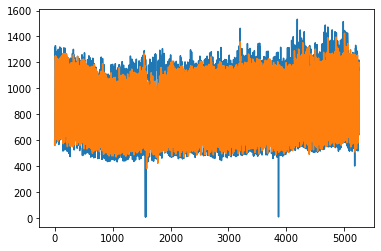

213


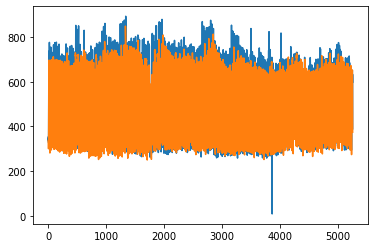

214


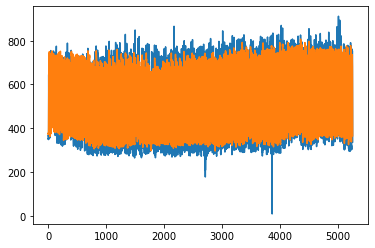

215


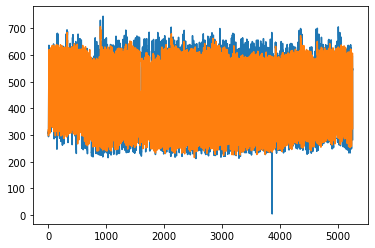

216


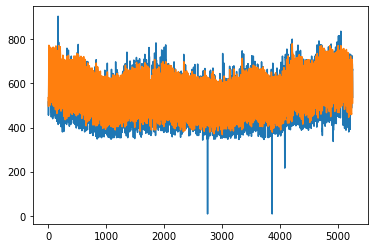

217


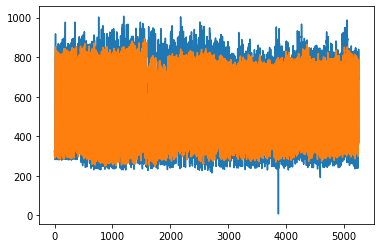

218


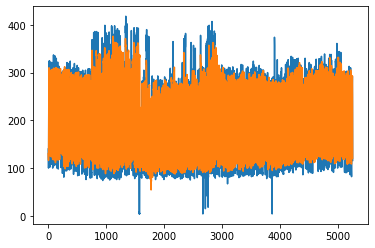

219


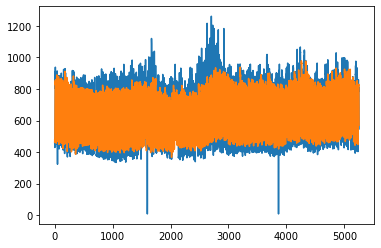

220


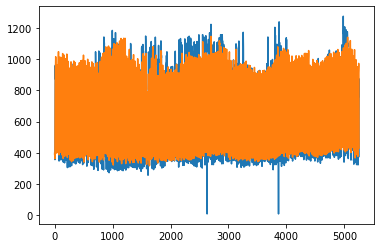

221


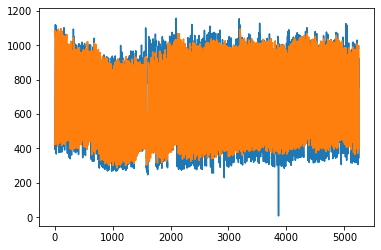

222


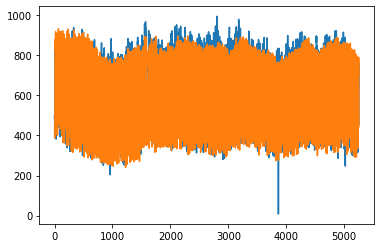

223


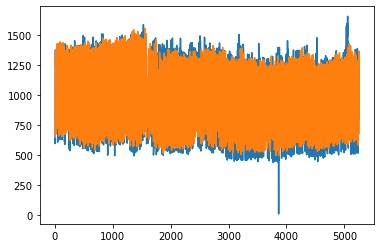

224


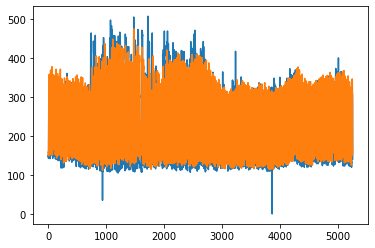

225


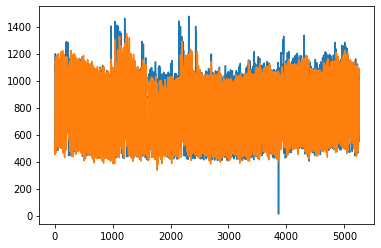

226


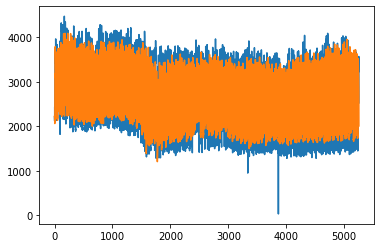

227


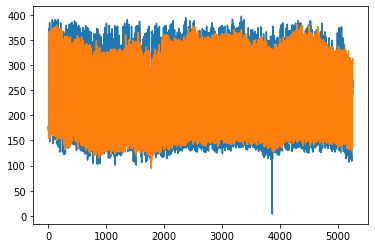

228


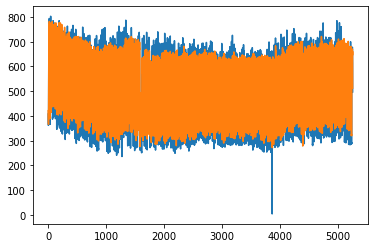

229


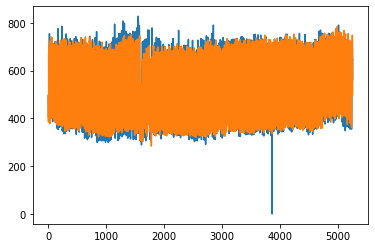

230


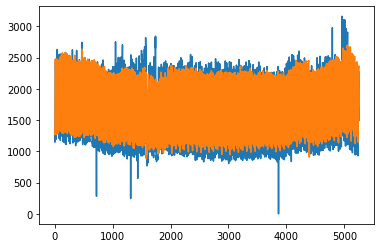

231


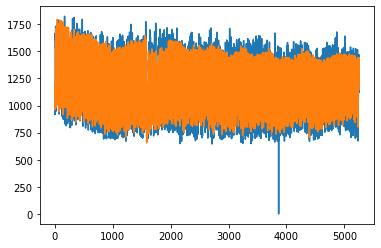

232


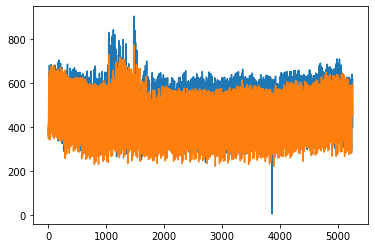

233


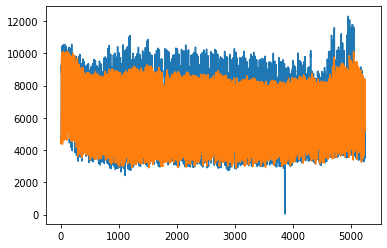

234


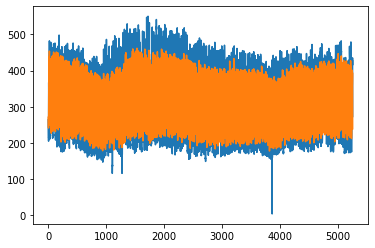

235


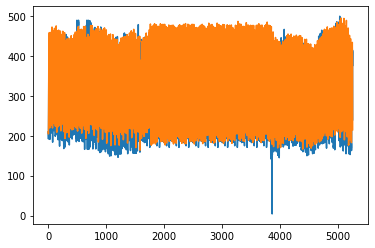

236


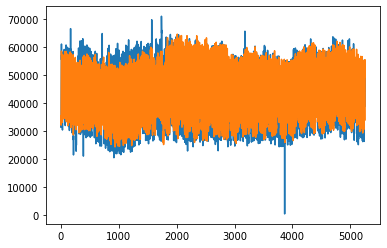

237


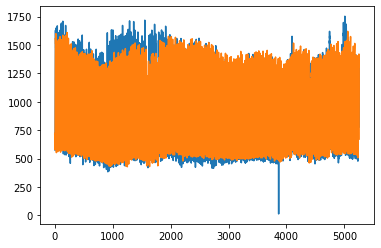

238


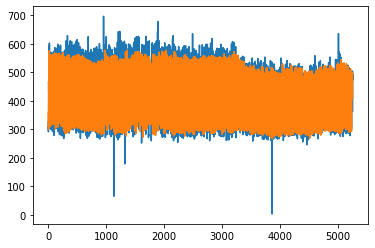

239


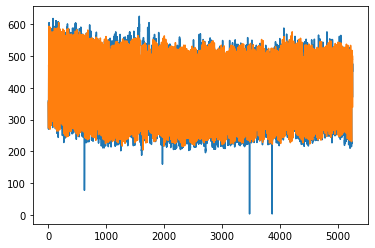

240


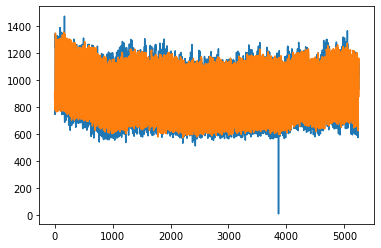

241


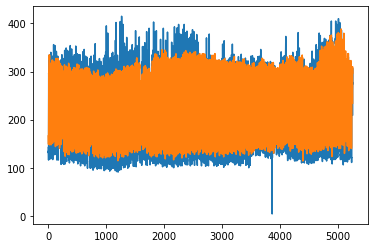

242


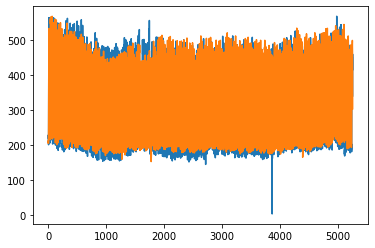

243


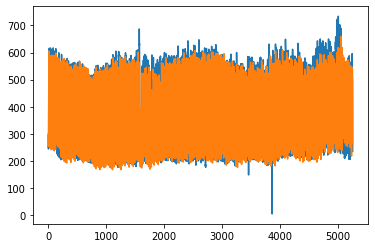

244


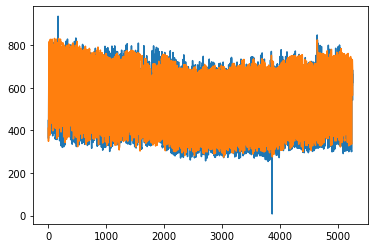

245


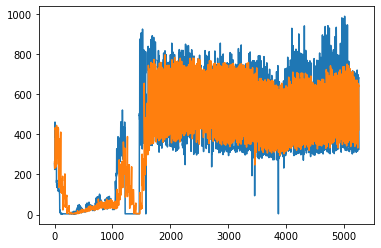

246


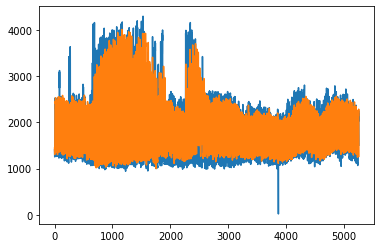

247


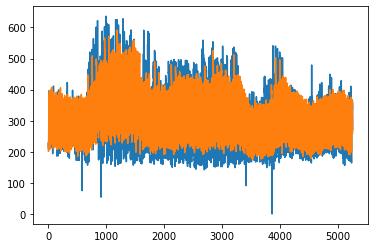

248


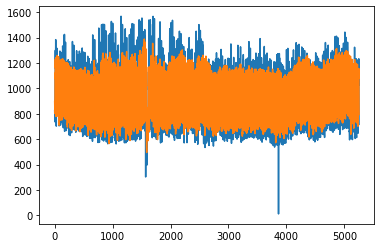

249


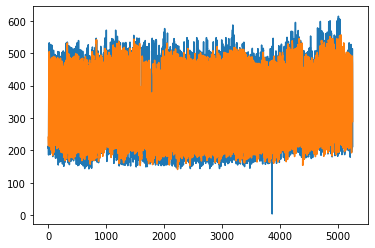

250


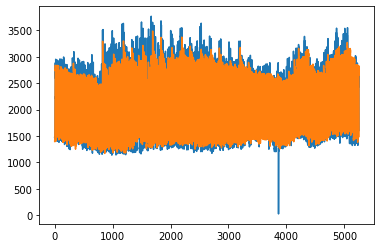

251


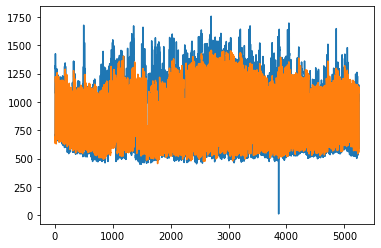

252


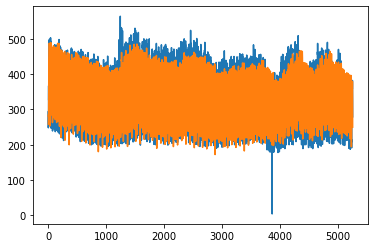

253


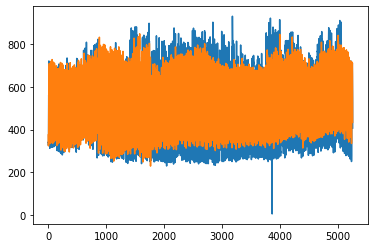

254


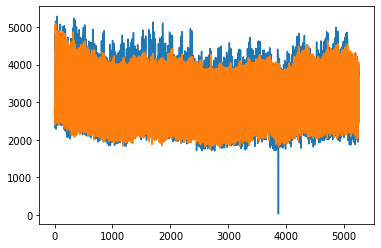

255


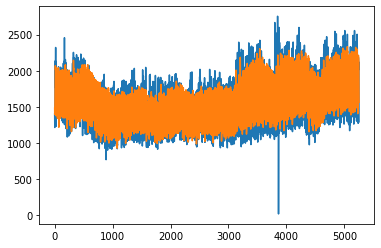

256


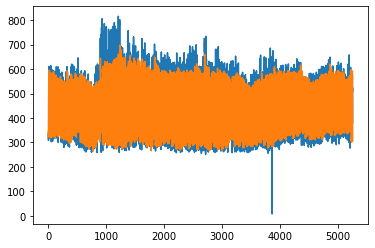

257


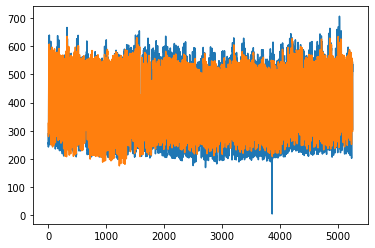

258


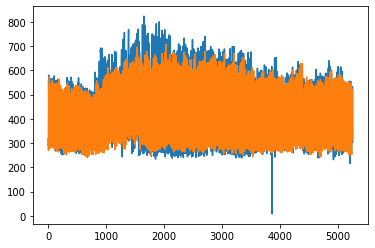

259


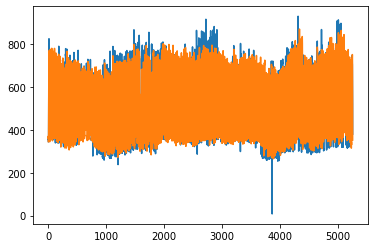

260


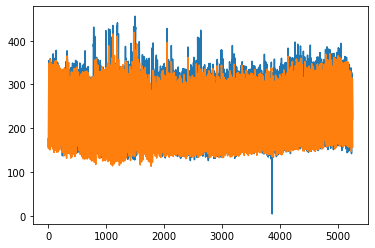

261


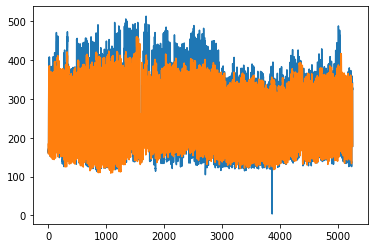

262


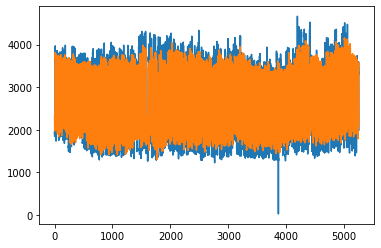

263


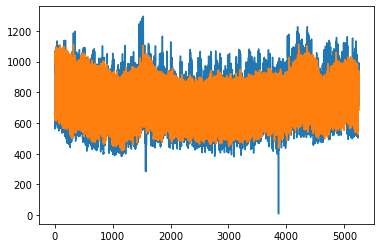

264


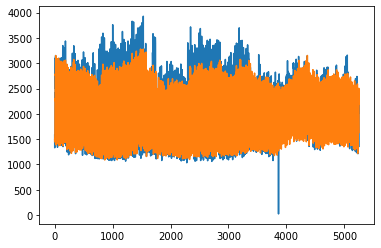

265


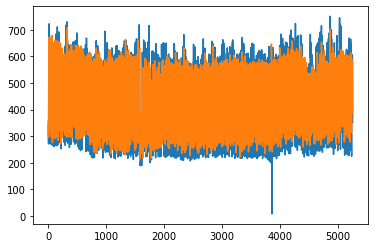

266


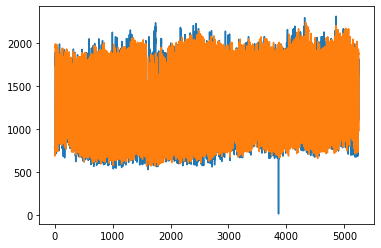

267


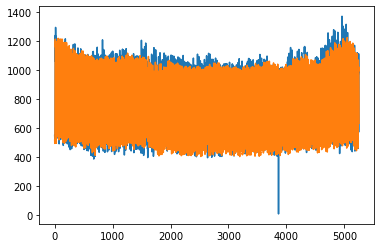

268


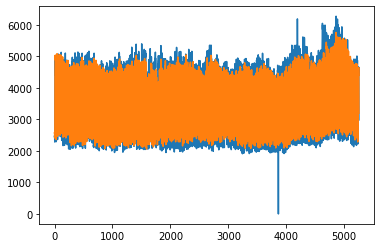

269


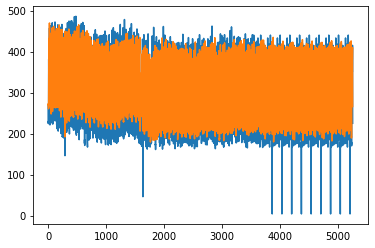

270


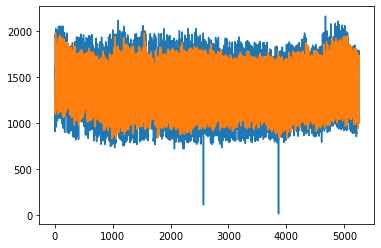

271


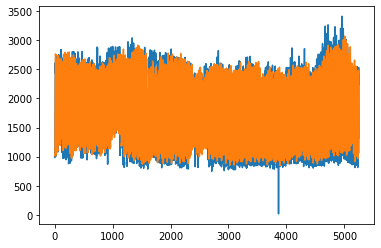

272


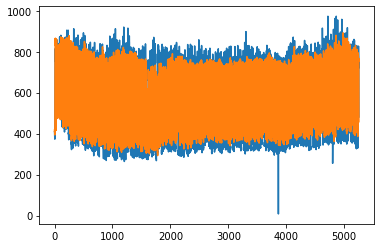

273


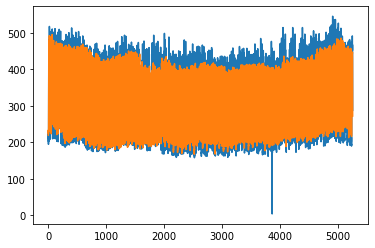

274


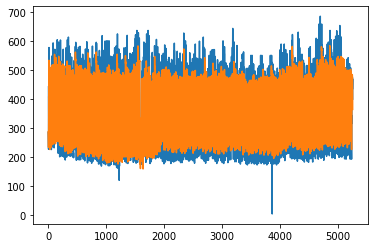

275


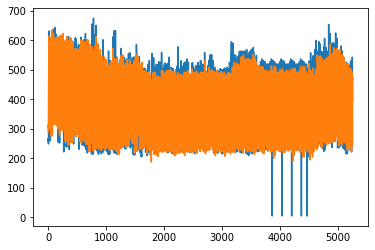

276


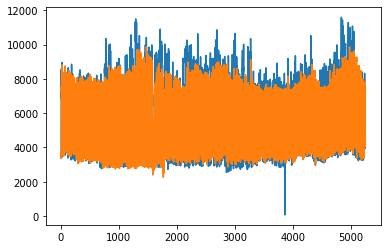

277


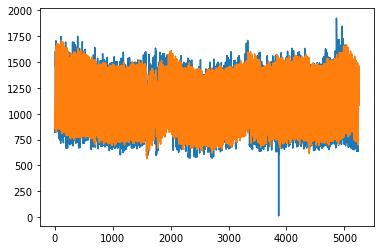

278


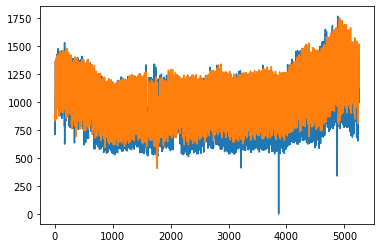

279


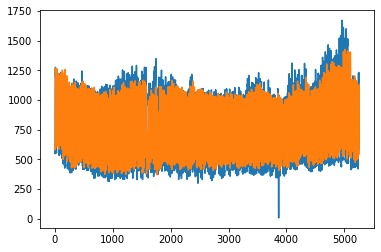

280


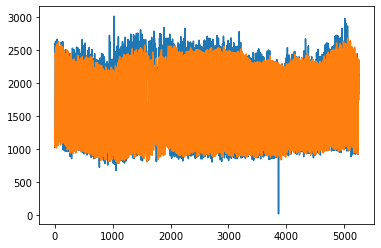

281


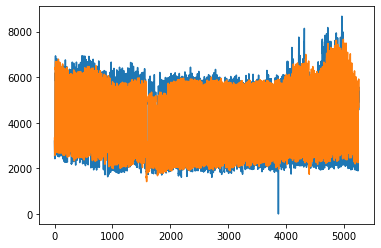

282


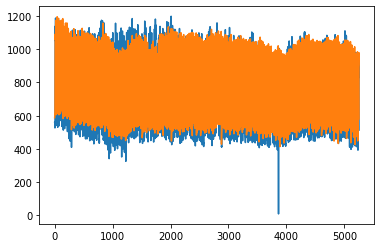

283


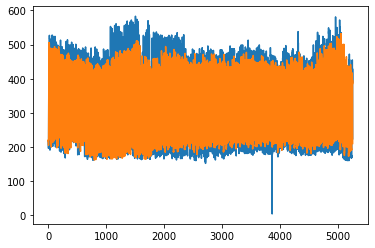

284


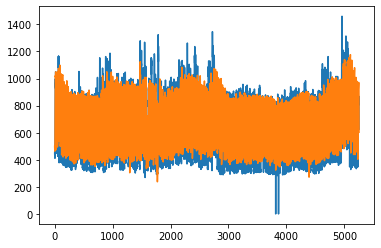

285


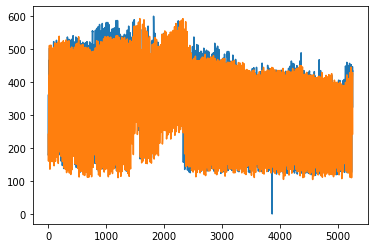

286


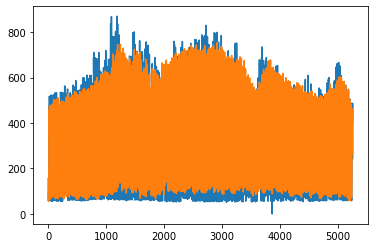

287


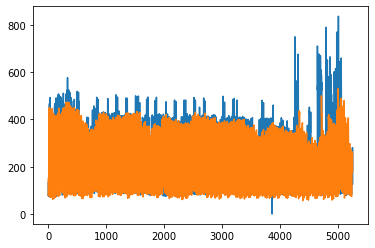

288


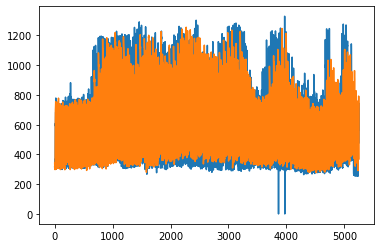

289


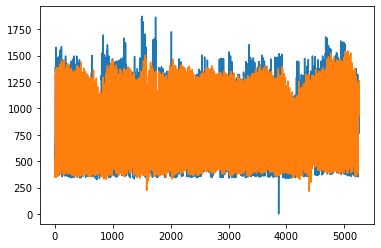

290


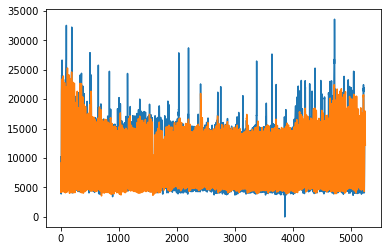

291


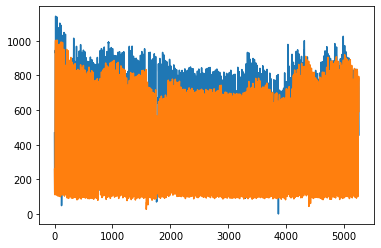

292


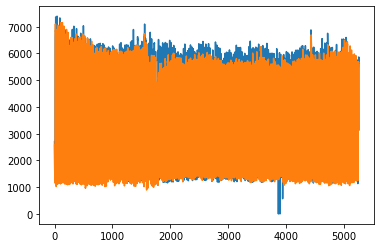

293


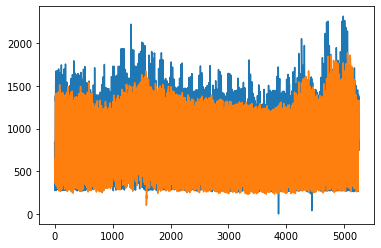

294


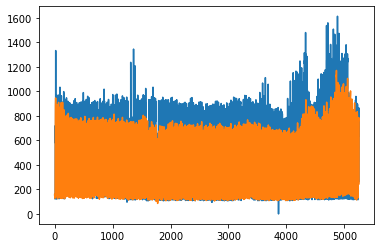

295


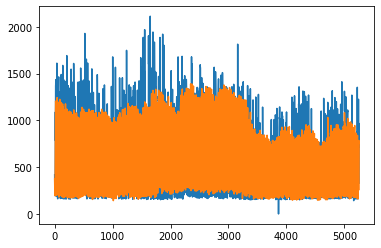

296


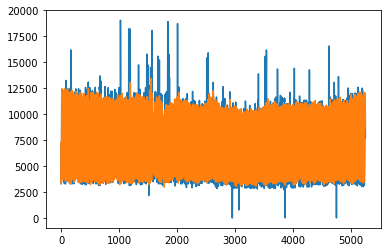

297


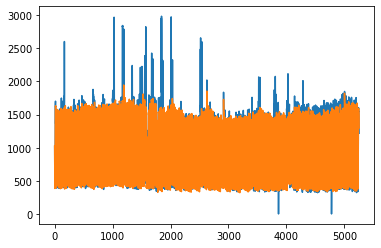

298


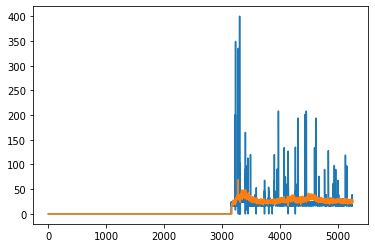

299


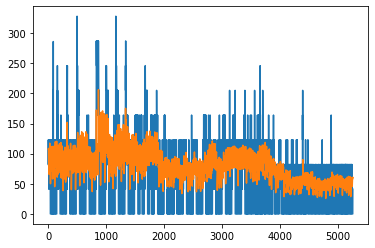

300


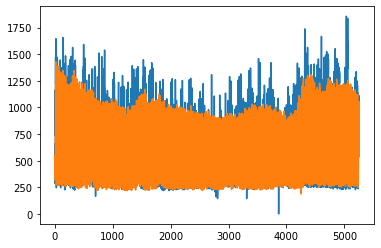

301


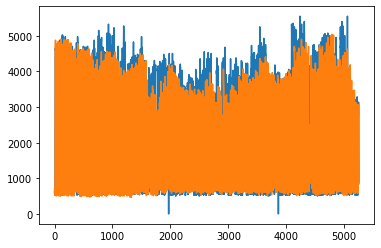

302


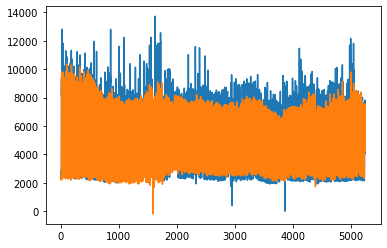

303


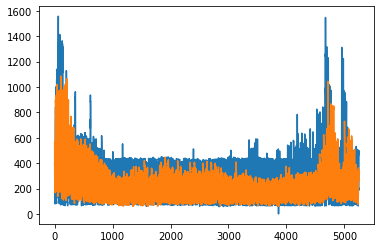

304


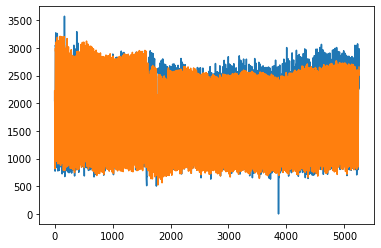

305


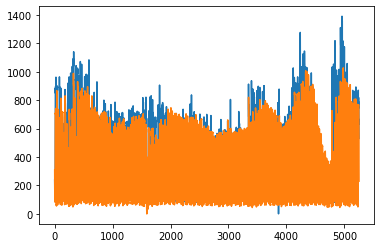

306


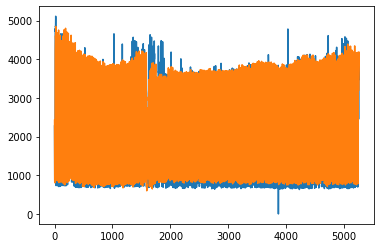

307


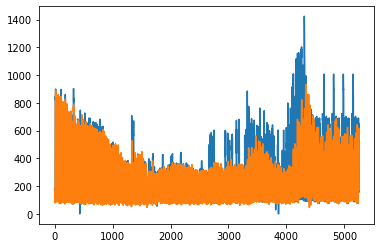

308


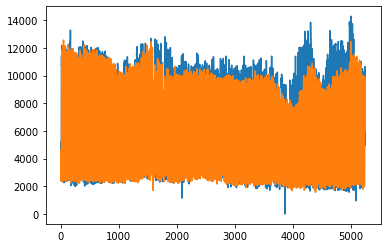

309


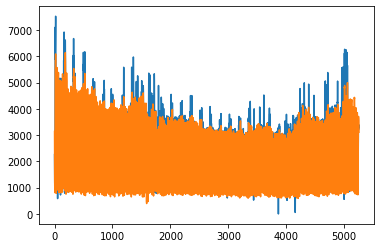

310


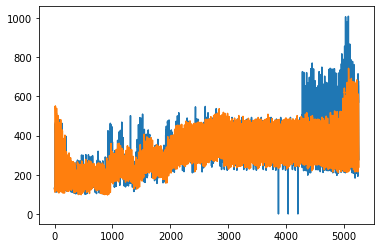

311


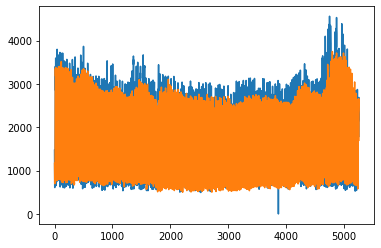

312


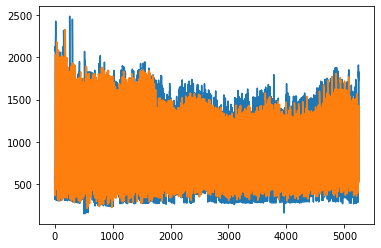

313


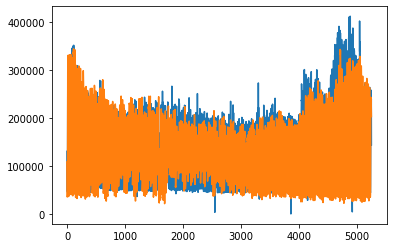

314


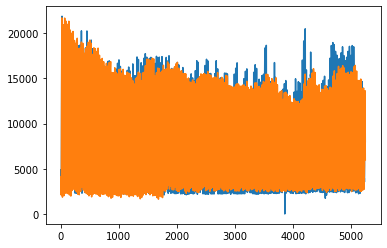

315


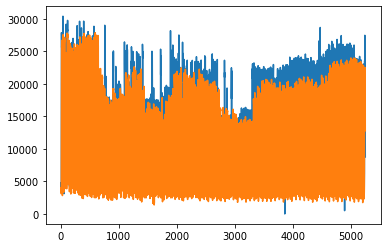

316


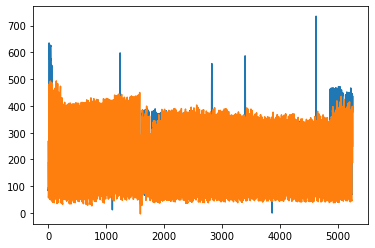

317


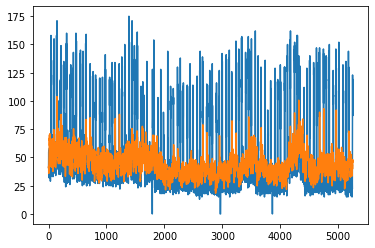

318


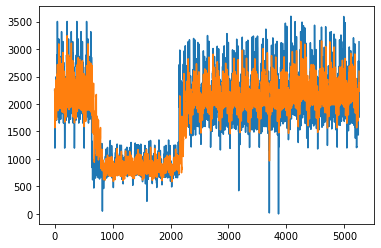

319


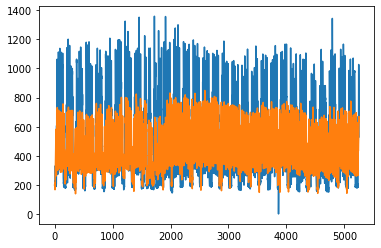

320


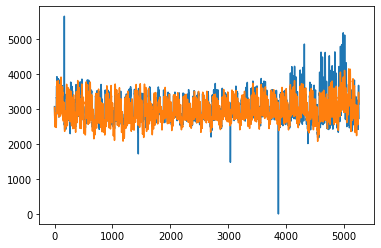

In [219]:
for i in range(321):
    print(i)
    plt.plot(a[np.argwhere(x==i).reshape(146),:].reshape(146*36))
    plt.plot(a2[np.argwhere(x==i).reshape(146),:].reshape(146*36))
    plt.show()

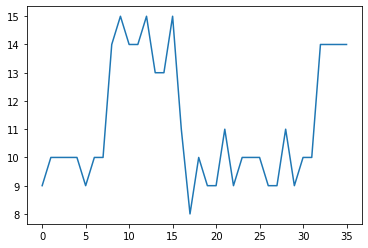

In [39]:
import matplotlib.pyplot as plt
plt.plot(a[np.argwhere(x==0)[0][0],:])


0


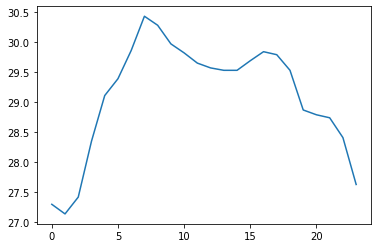

1


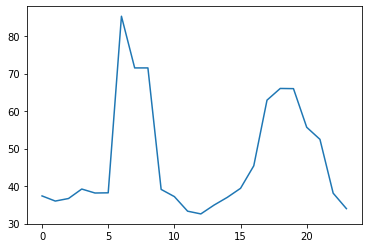

2


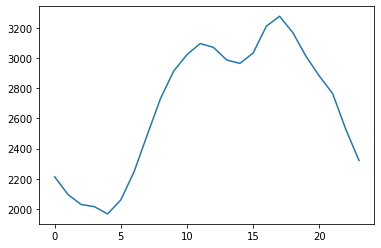

3


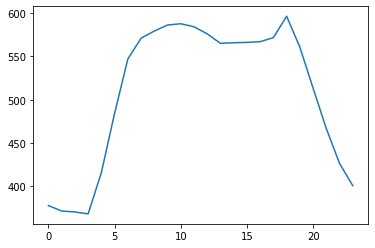

4


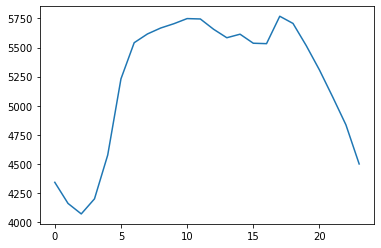

5


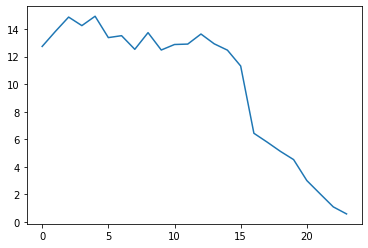

6


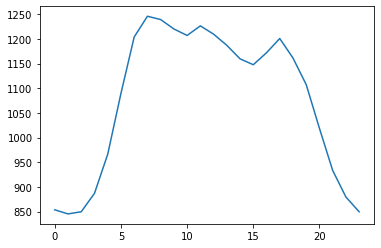

7


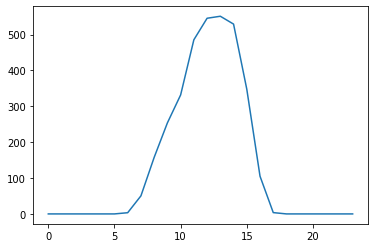

8


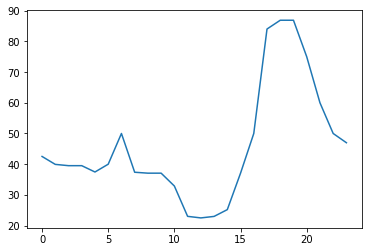

9


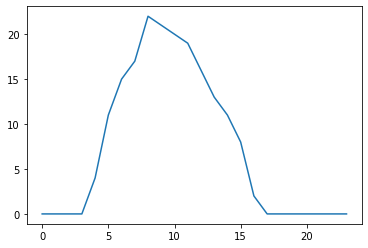

10


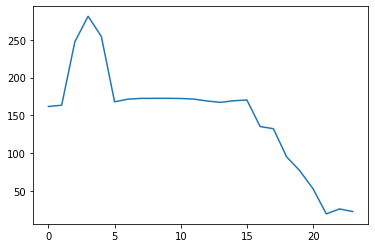

11


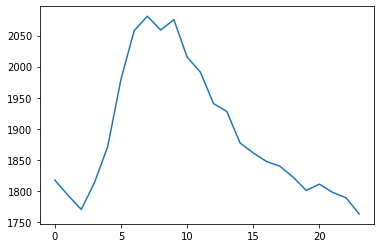

12


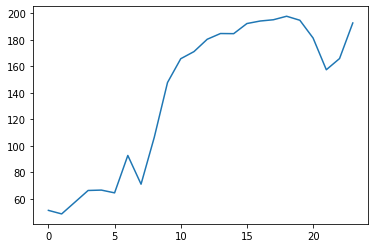

13


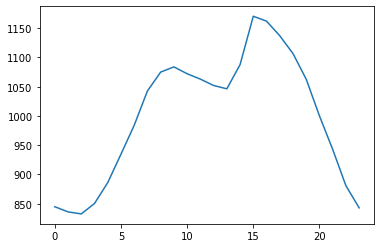

14


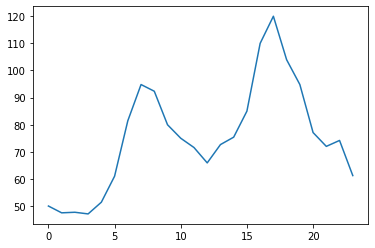

15


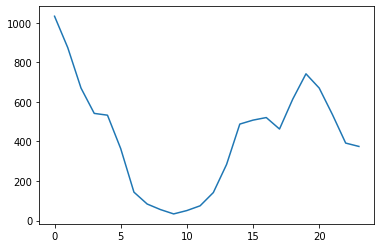

16


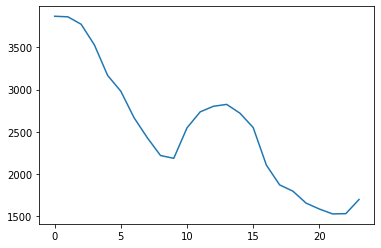

17


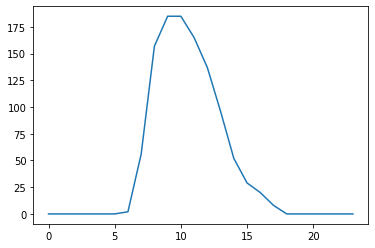

18


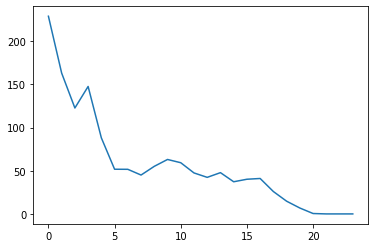

19


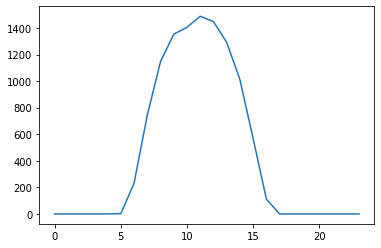

20


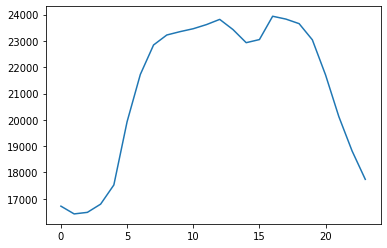

21


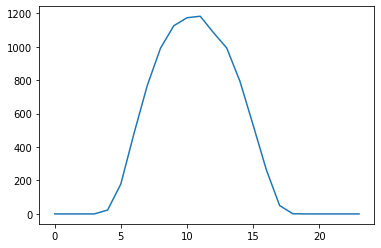

22


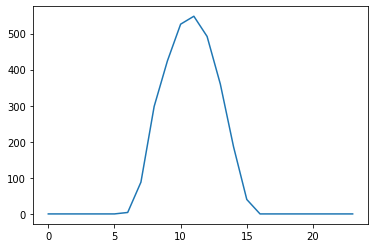

23


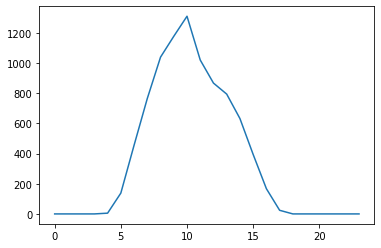

24


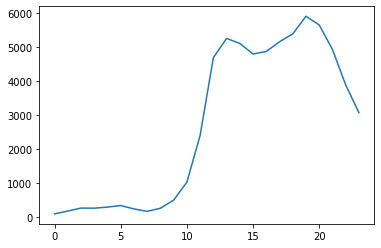

25


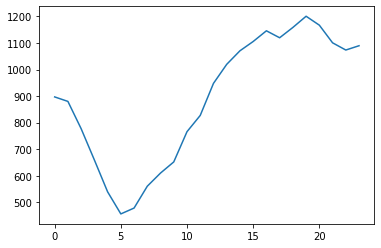

26


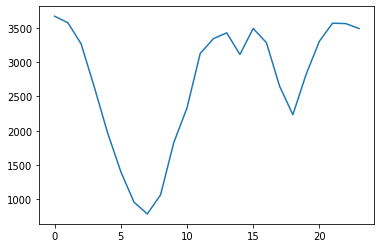

27


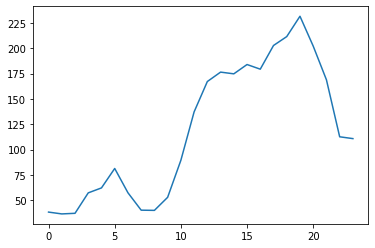

28


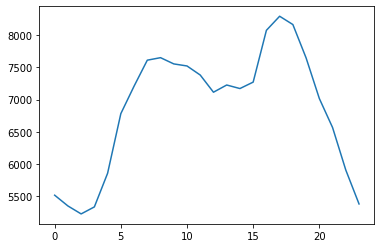

29


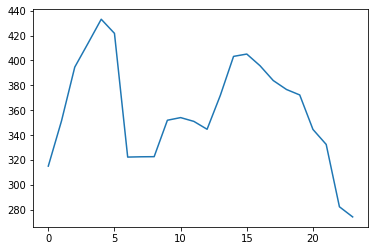

30


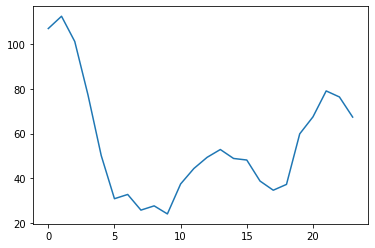

31


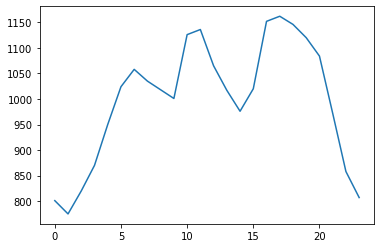

32


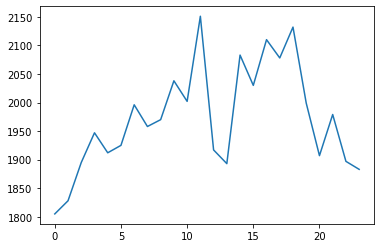

33


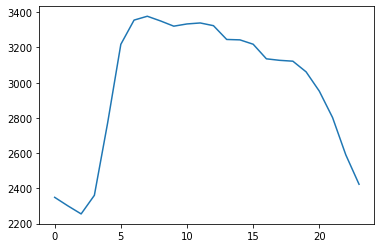

34


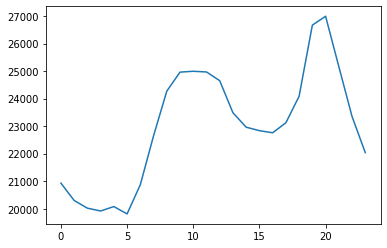

35


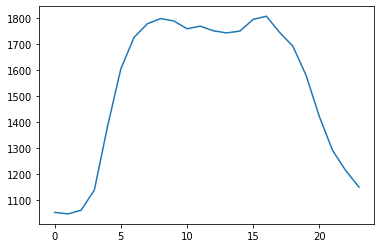

36


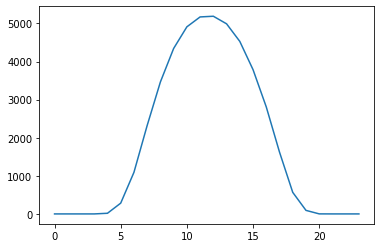

37


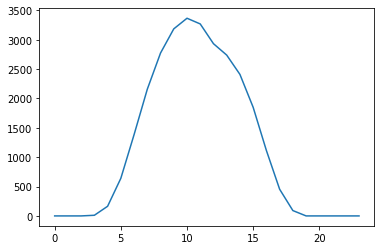

38


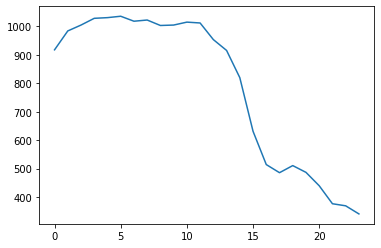

39


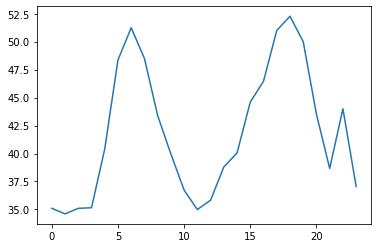

40


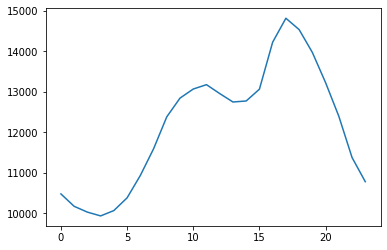

41


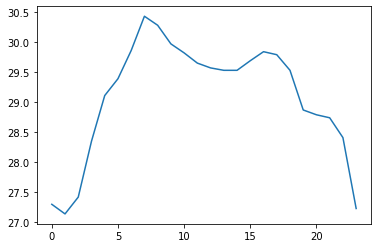

42


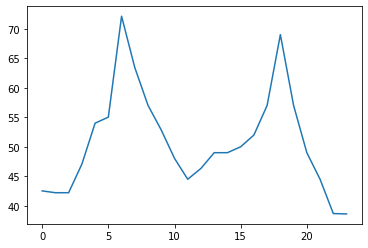

43


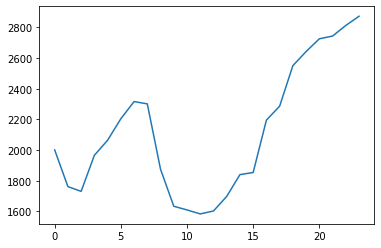

44


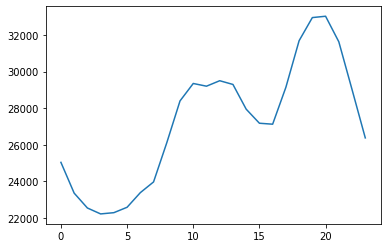

45


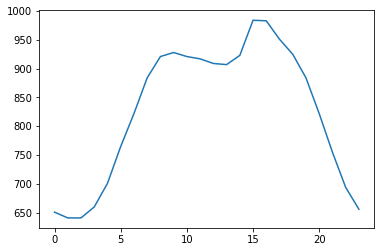

46


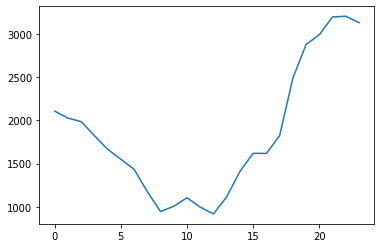

47


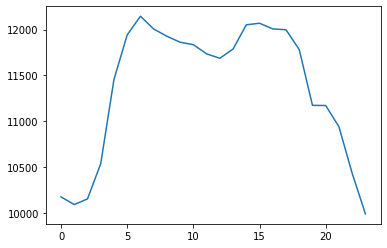

48


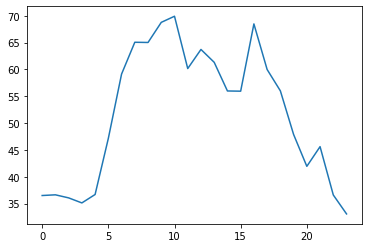

49


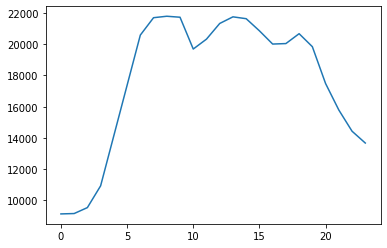

50


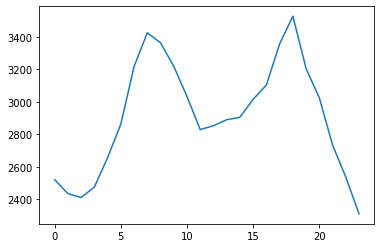

51


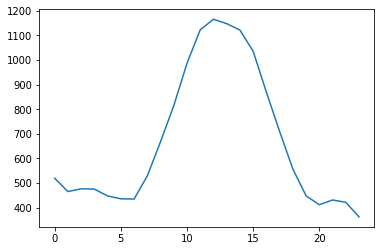

52


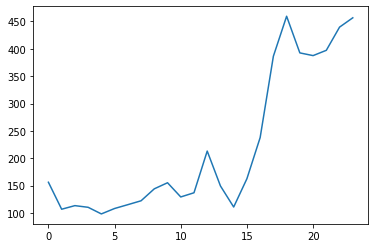

53


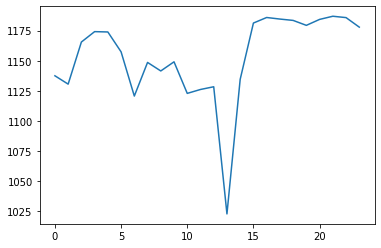

54


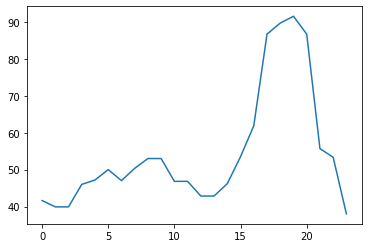

55


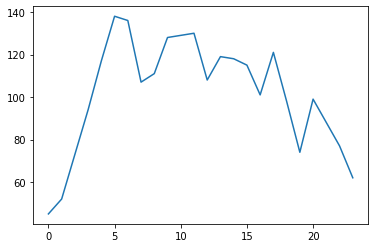

56


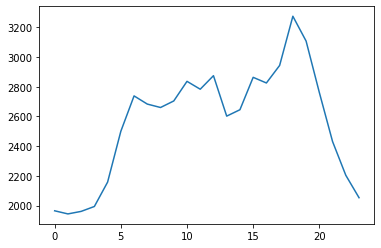

57


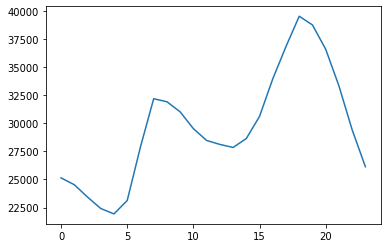

58


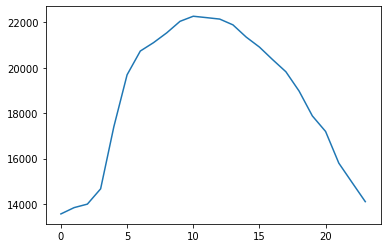

59


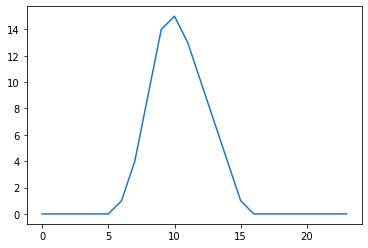

60


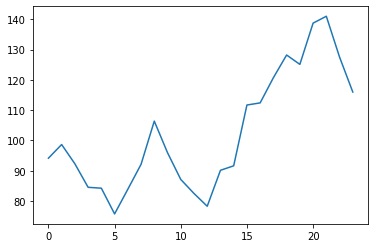

61


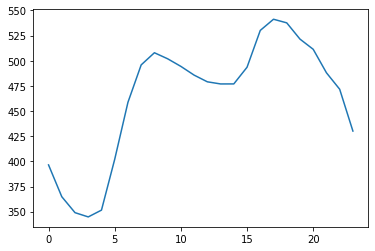

62


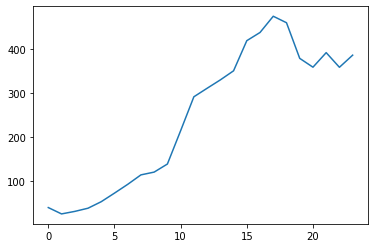

63


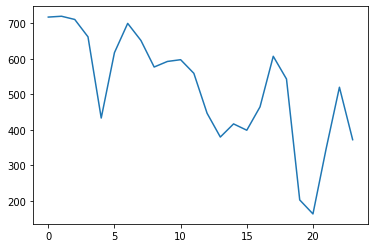

64


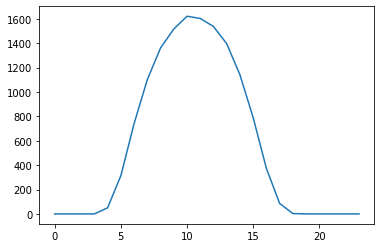

65


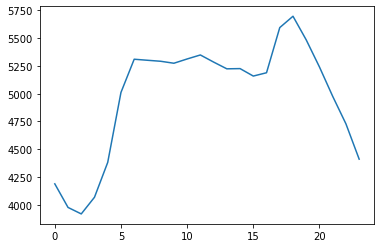

66


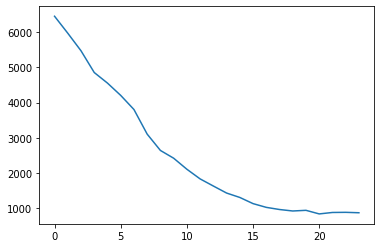

67


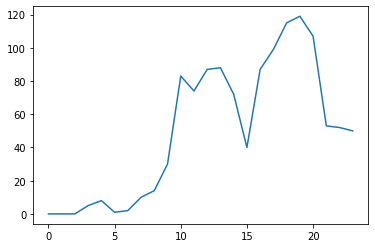

68


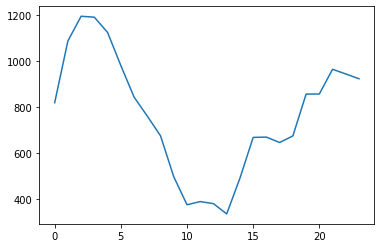

69


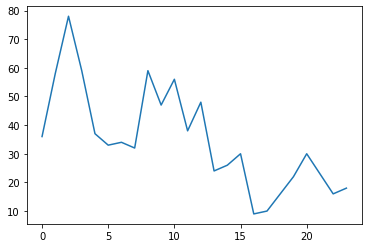

70


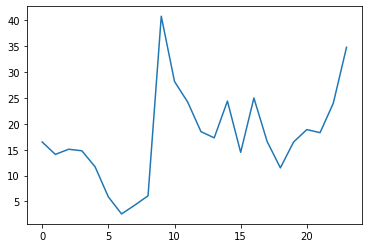

71


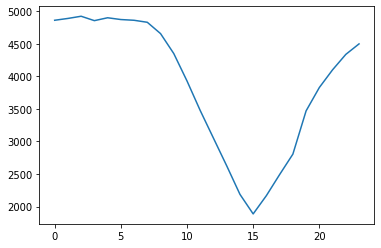

72


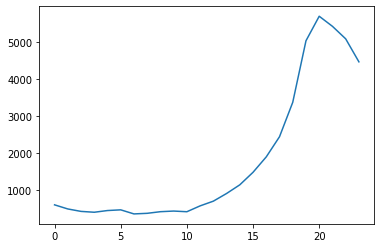

73


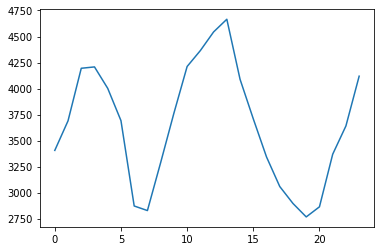

74


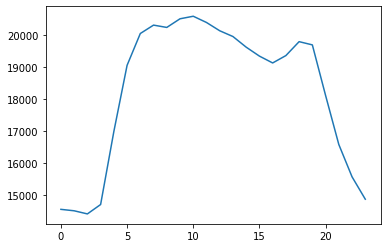

75


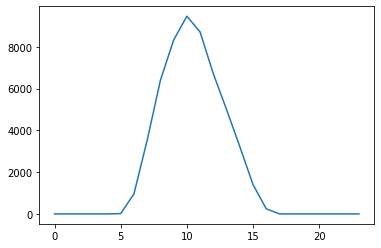

76


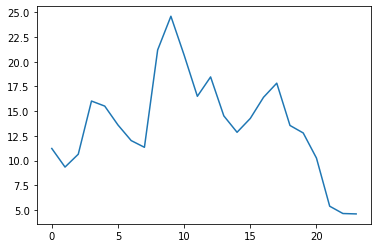

77


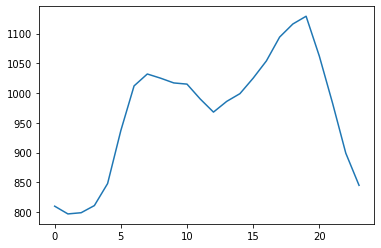

78


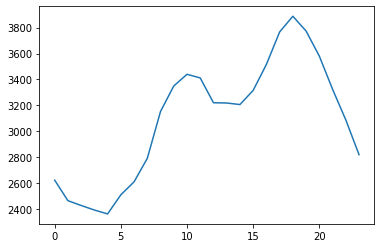

79


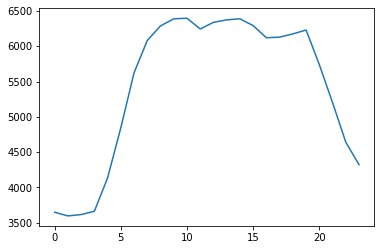

80


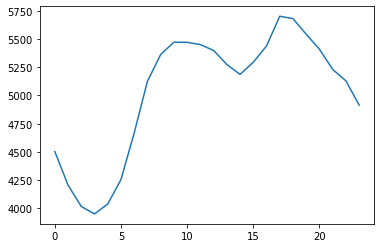

81


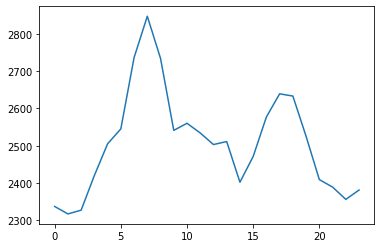

82


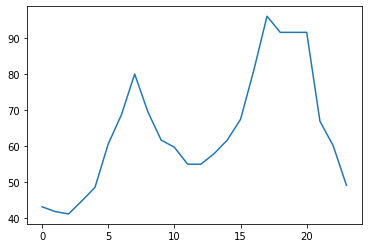

83


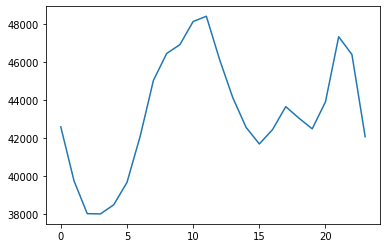

84


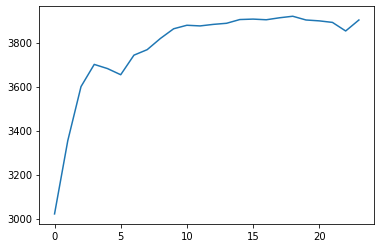

85


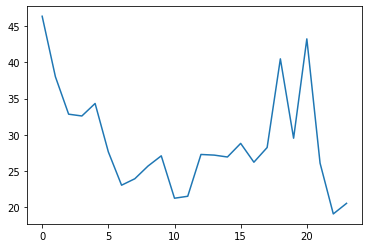

86


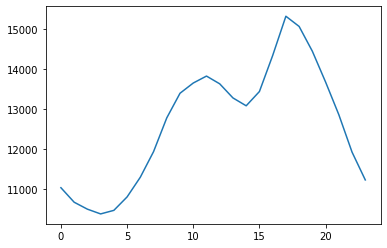

87


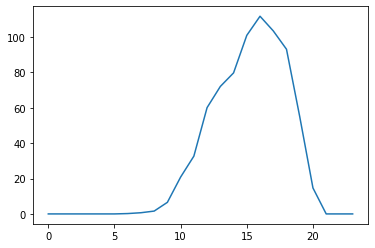

88


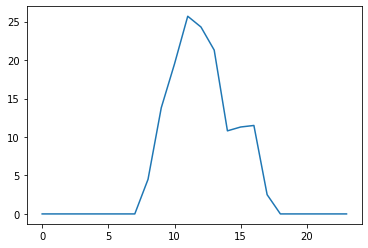

89


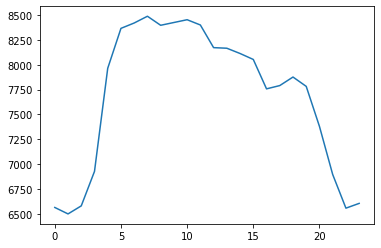

90


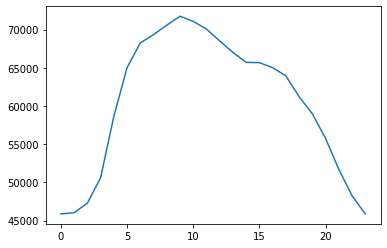

91


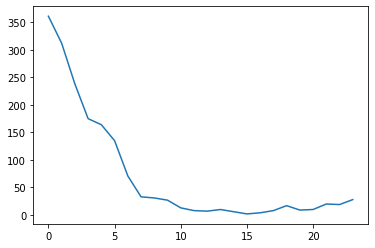

92


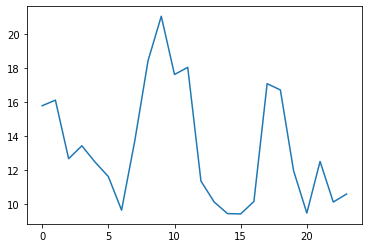

93


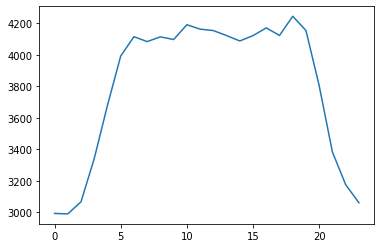

94


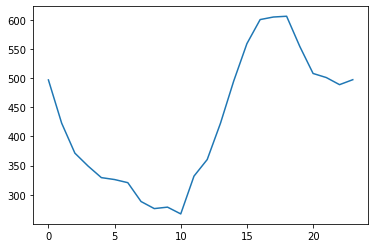

95


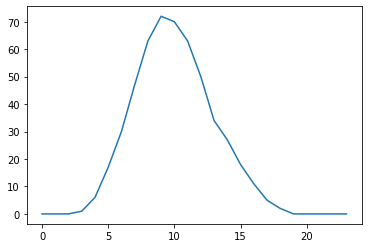

96


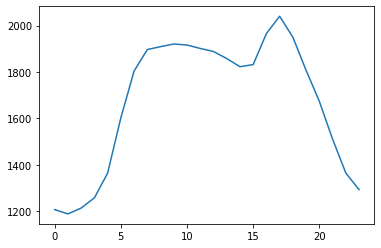

97


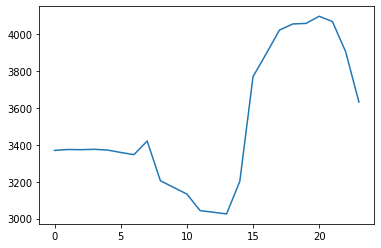

98


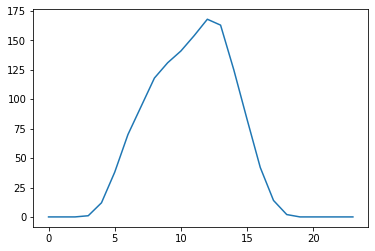

99


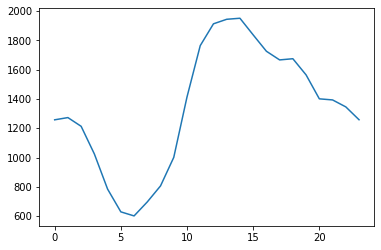

100


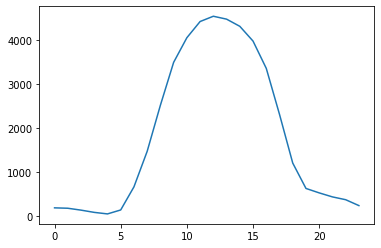

101


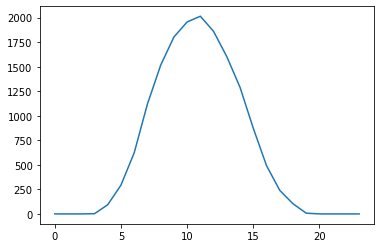

102


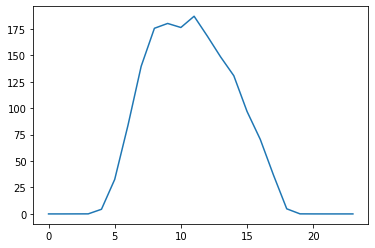

103


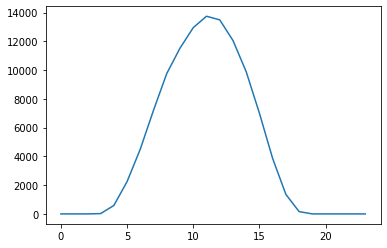

104


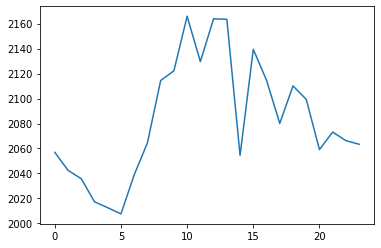

105


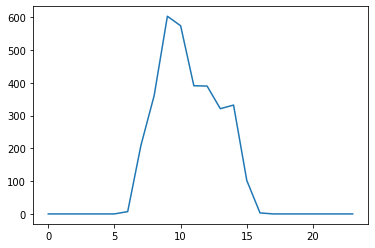

106


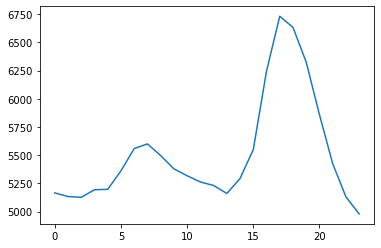

107


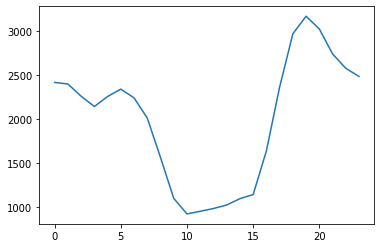

108


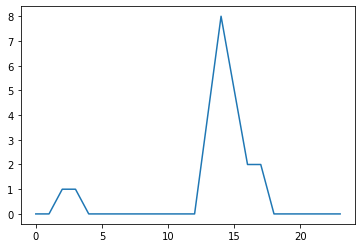

109


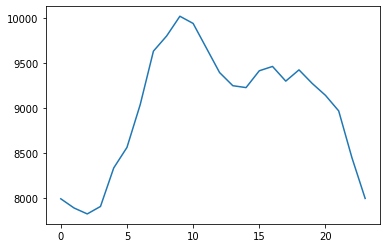

110


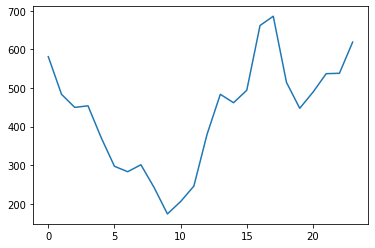

111


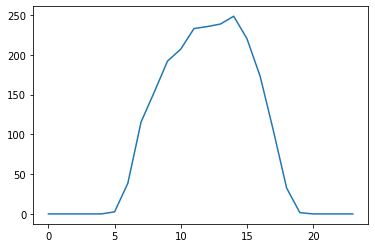

112


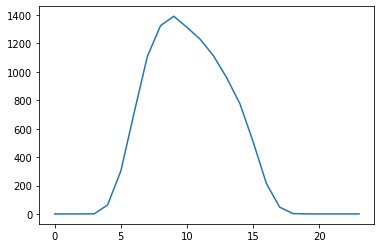

113


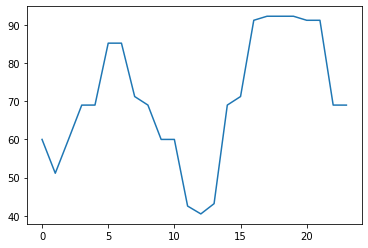

114


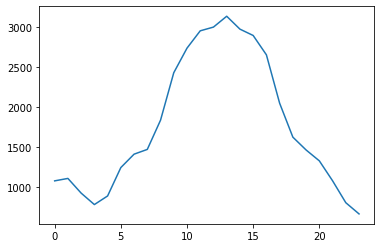

115


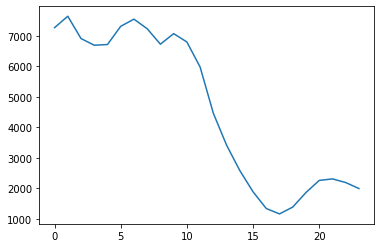

116


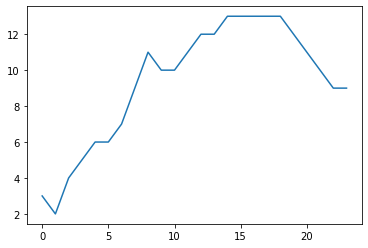

117


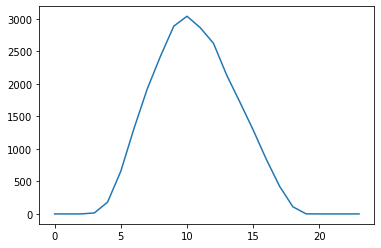

118


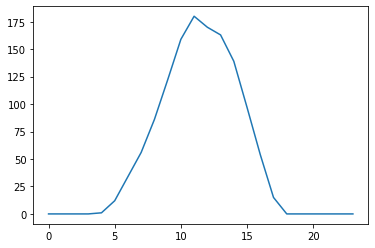

119


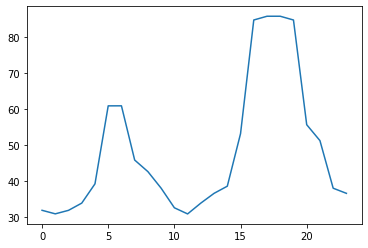

120


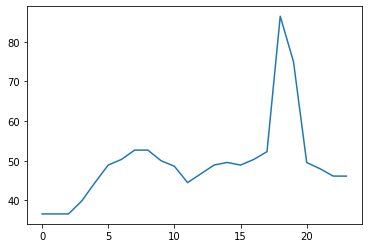

121


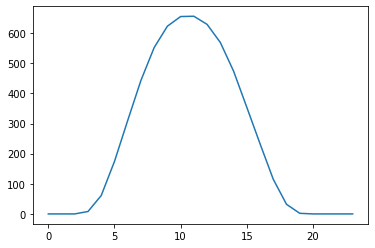

122


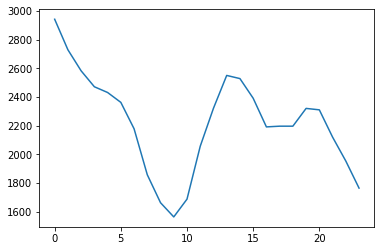

123


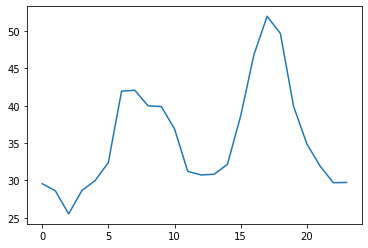

124


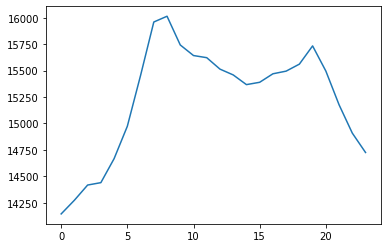

125


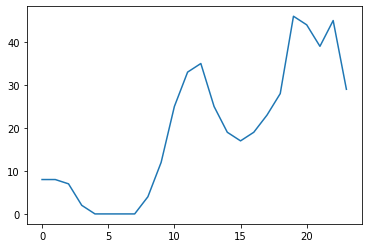

126


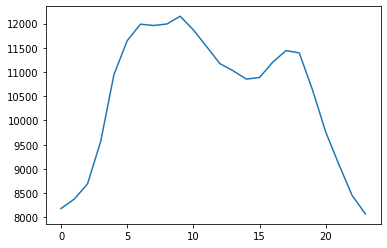

127


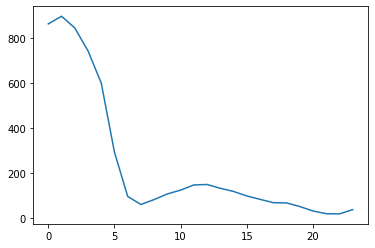

128


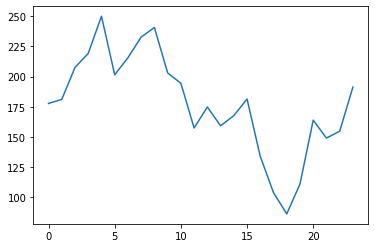

129


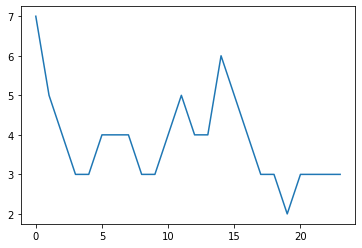

130


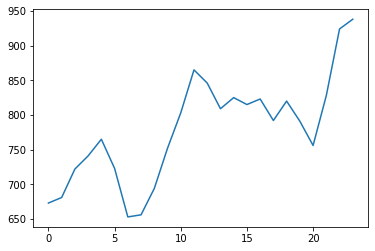

131


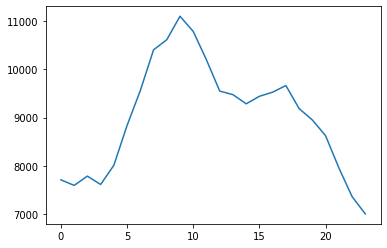

132


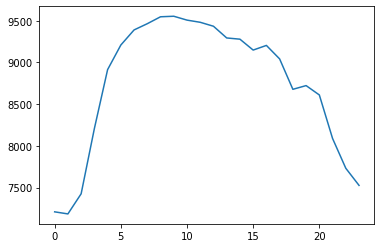

133


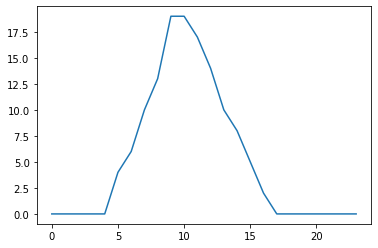

134


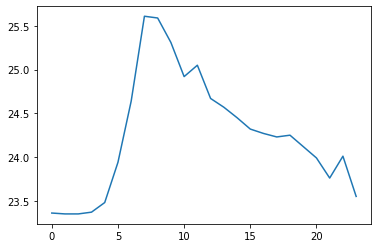

135


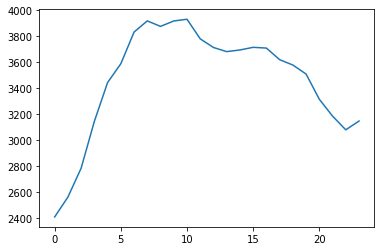

136


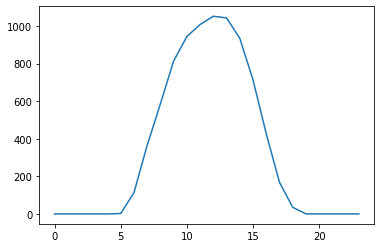

137


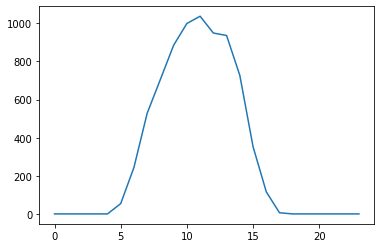

138


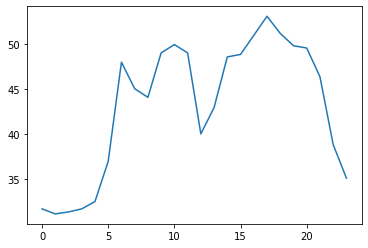

139


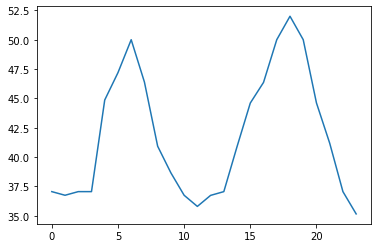

140


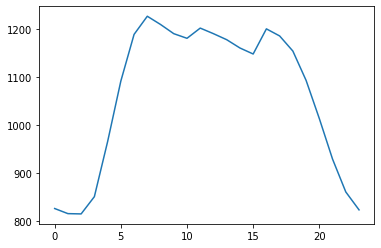

141


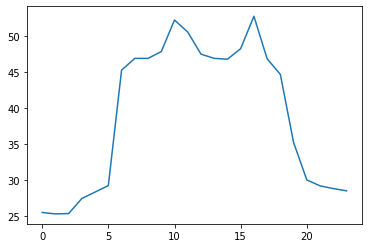

142


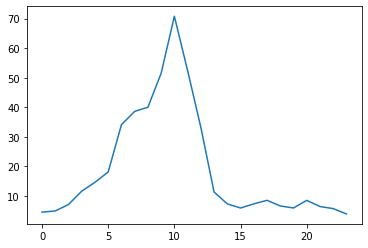

143


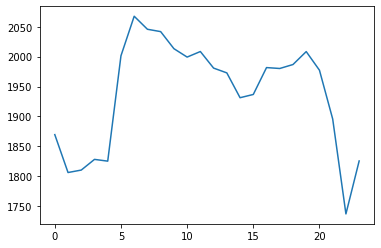

144


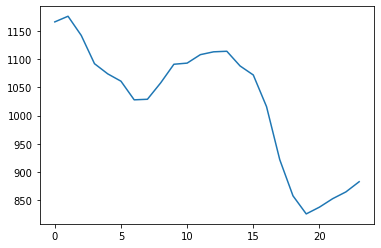

145


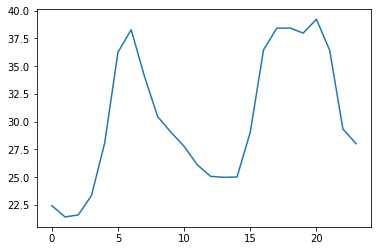

146


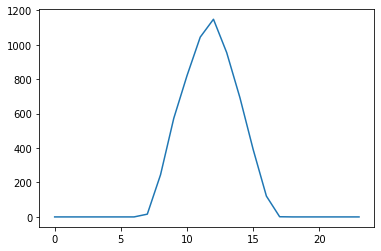

147


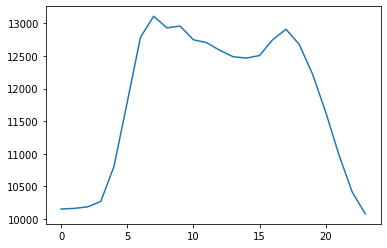

148


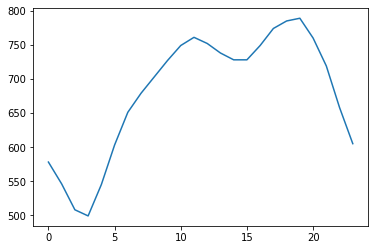

149


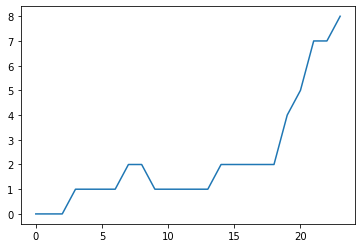

150


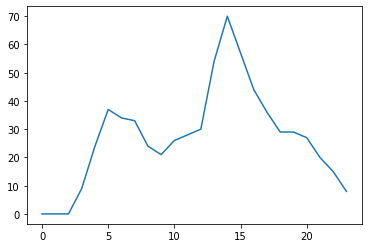

151


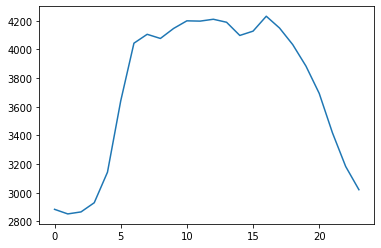

152


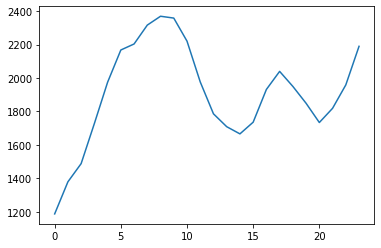

153


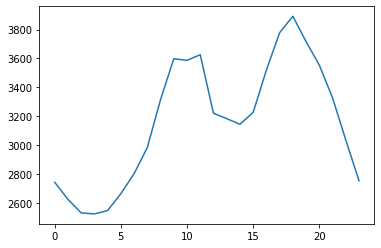

154


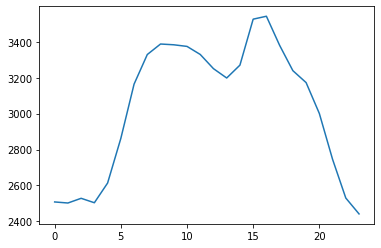

155


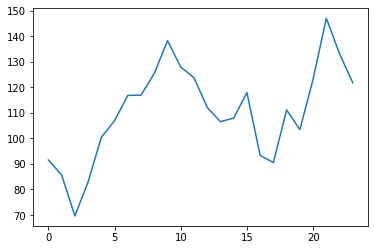

156


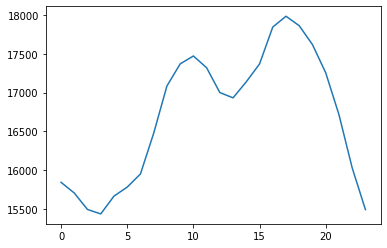

157


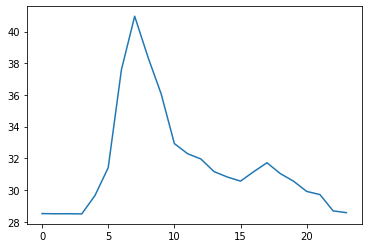

158


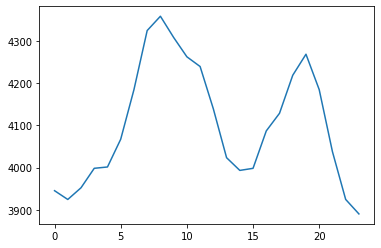

159


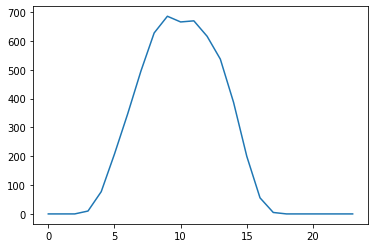

160


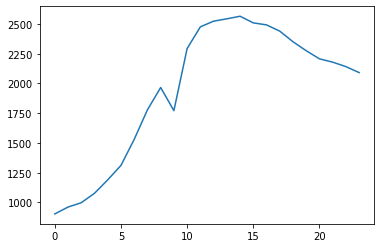

161


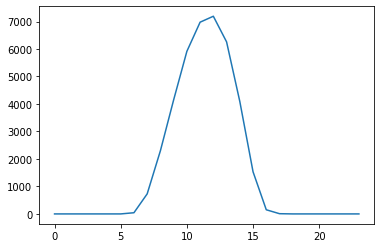

162


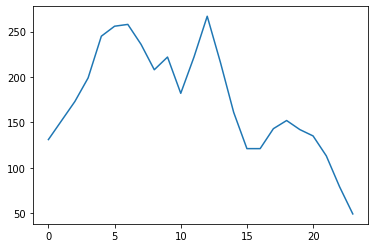

163


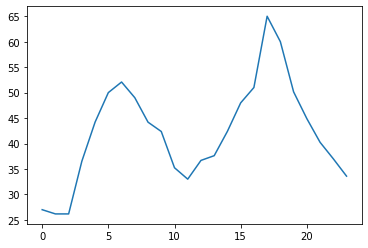

164


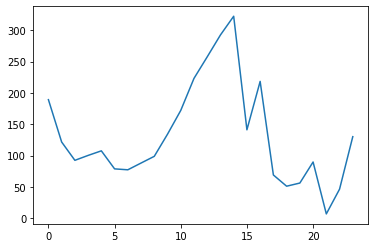

165


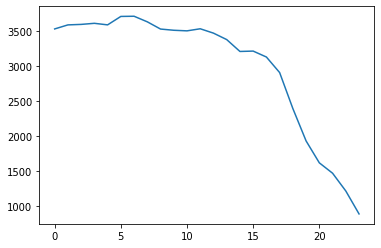

166


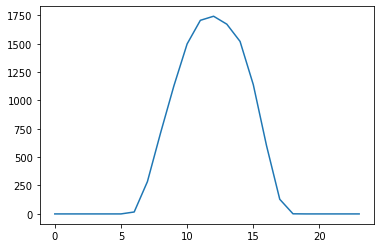

167


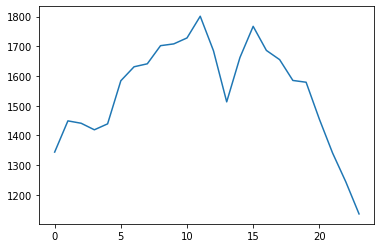

168


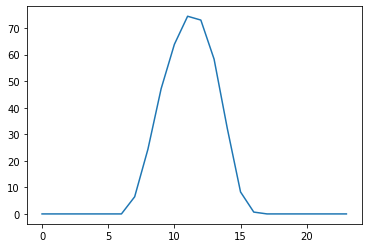

169


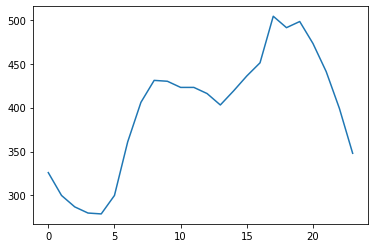

170


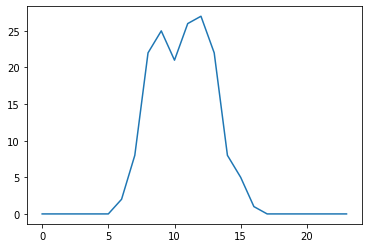

171


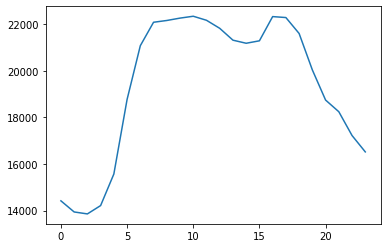

172


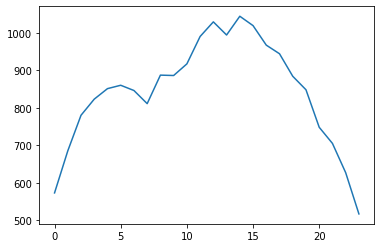

173


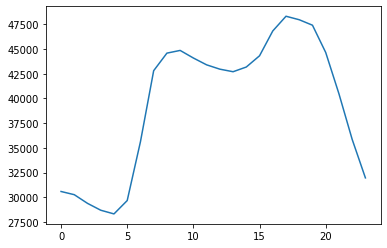

174


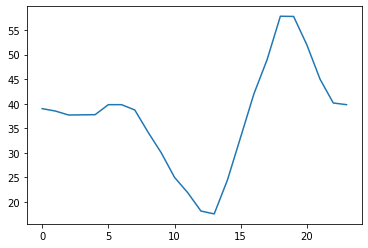

175


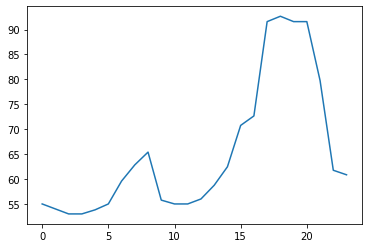

176


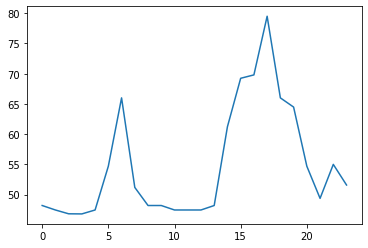

177


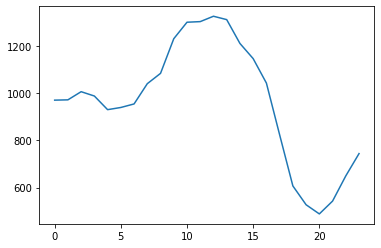

178


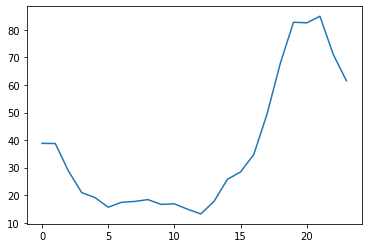

179


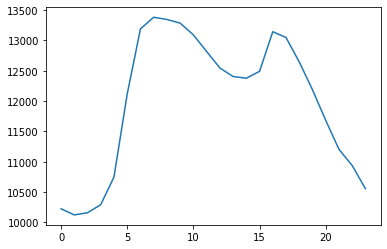

180


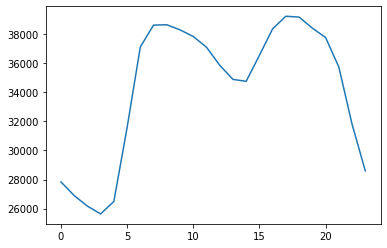

181


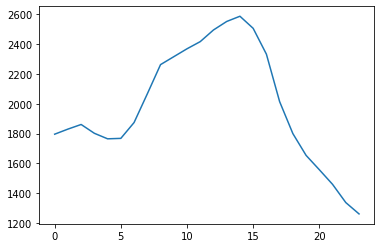

182


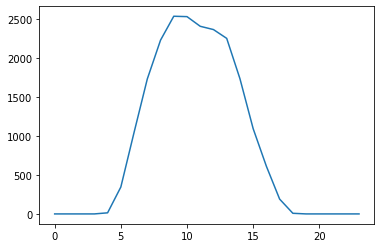

183


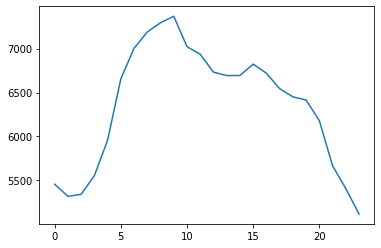

184


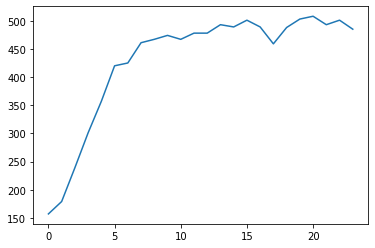

185


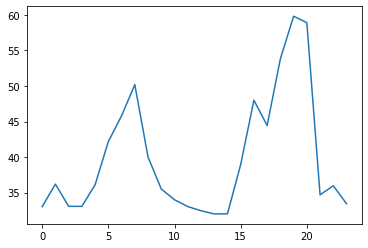

186


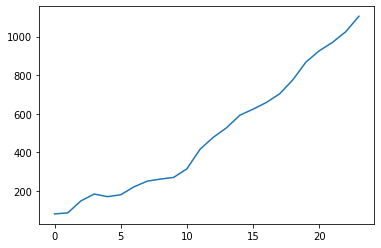

187


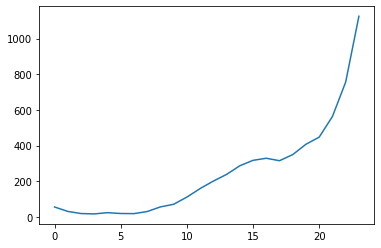

188


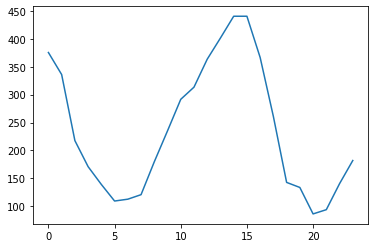

189


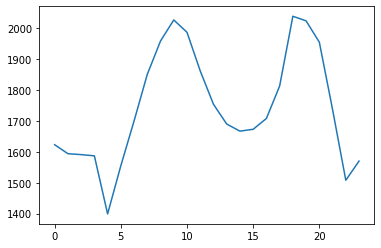

190


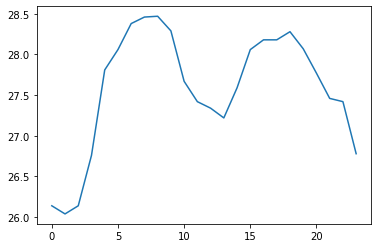

191


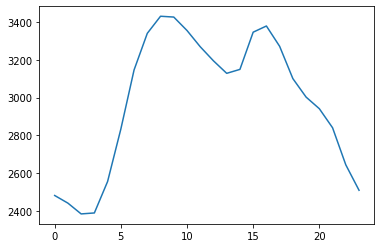

192


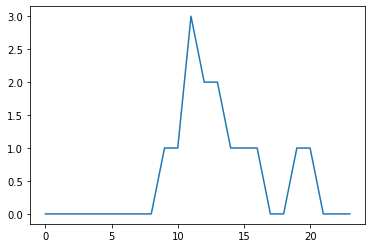

193


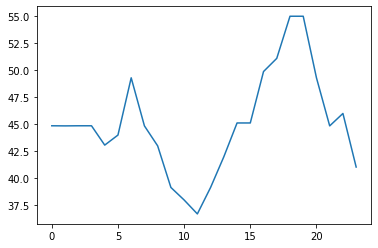

194


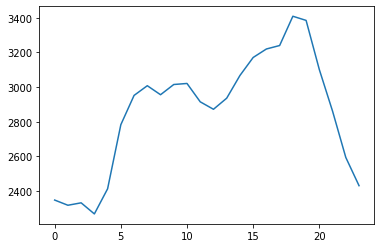

195


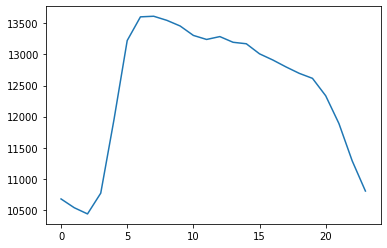

196


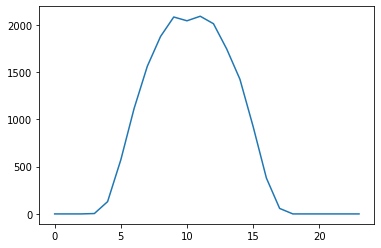

197


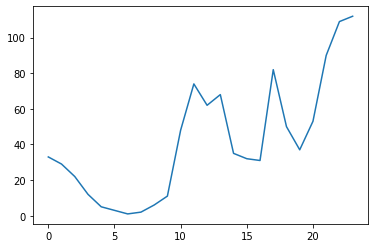

198


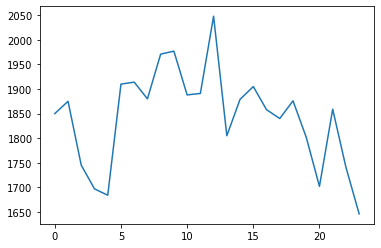

199


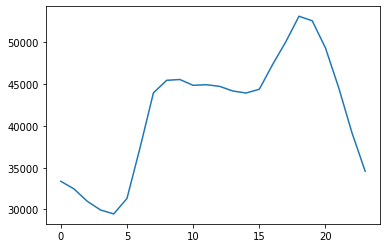

200


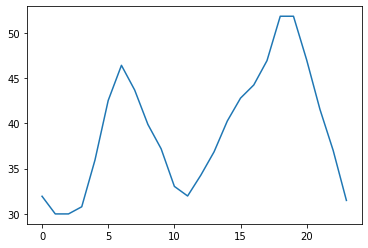

201


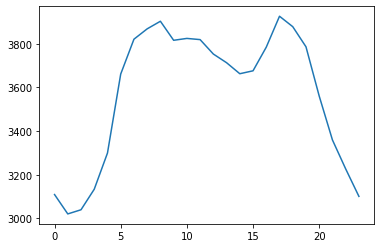

202


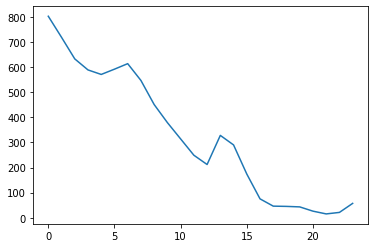

203


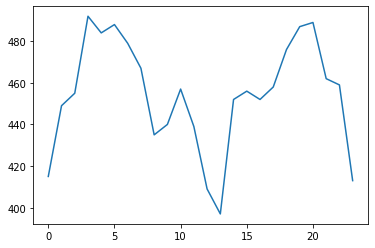

204


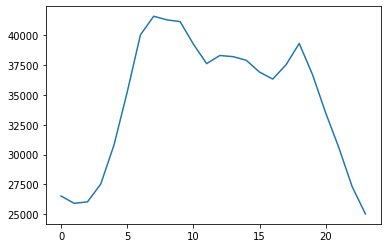

205


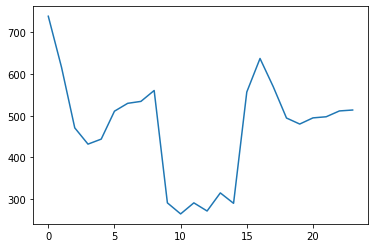

206


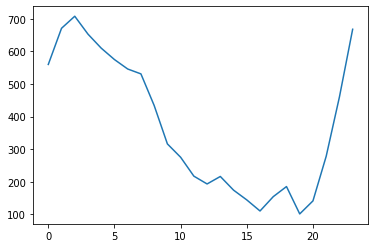

207


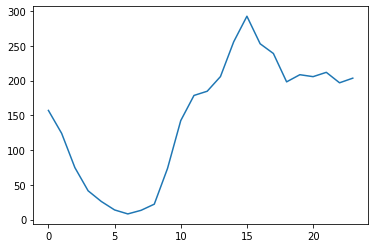

208


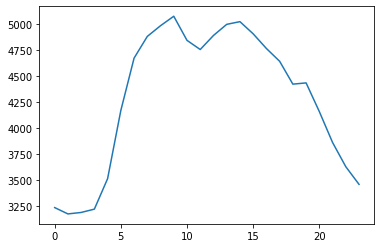

209


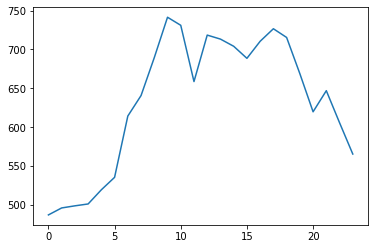

210


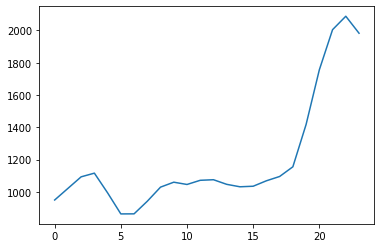

211


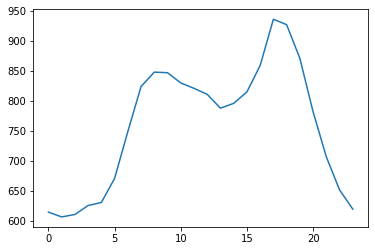

212


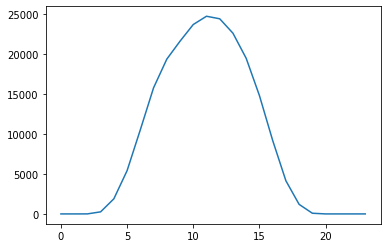

213


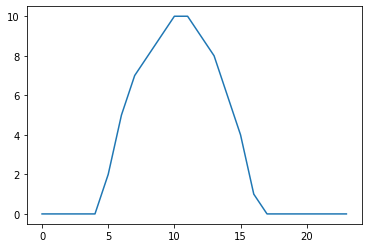

214


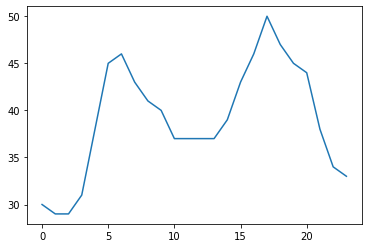

215


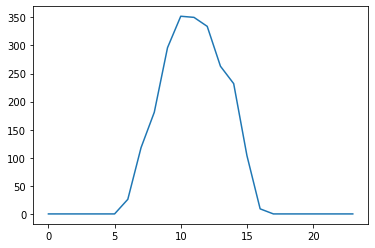

216


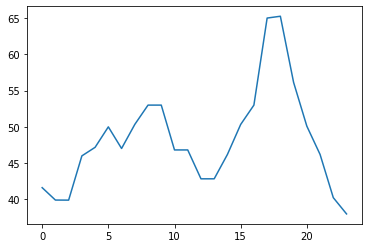

217


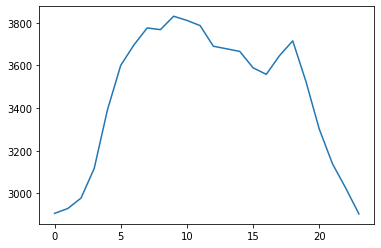

218


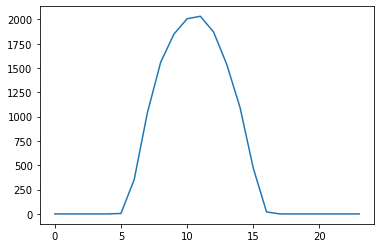

219


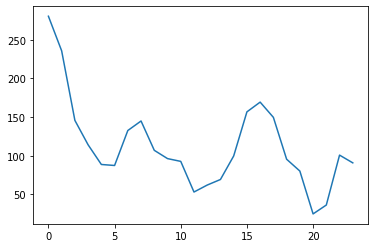

220


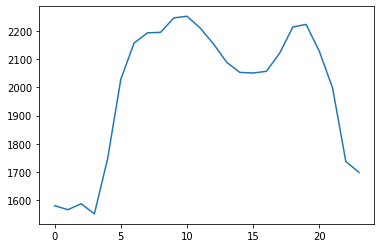

221


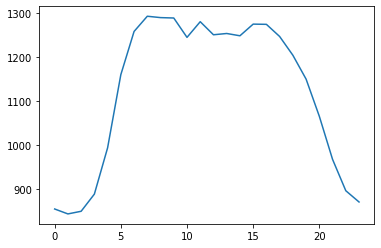

222


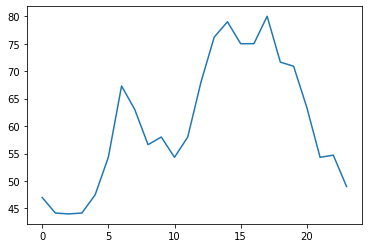

223


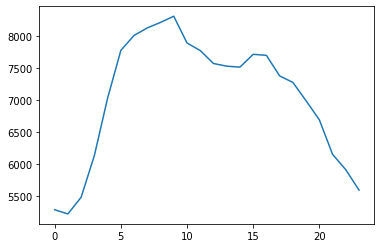

224


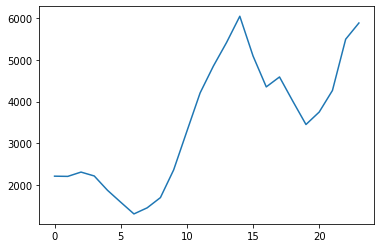

225


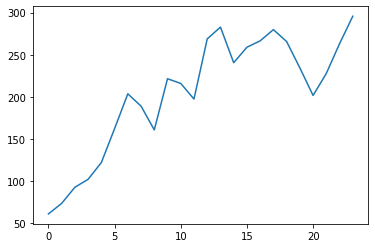

226


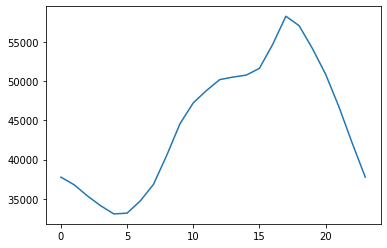

227


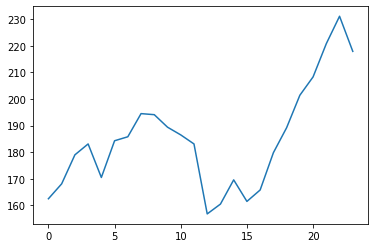

228


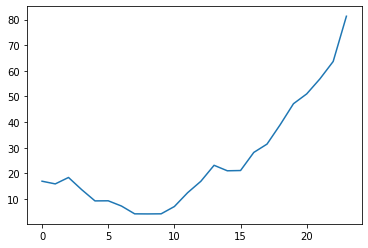

229


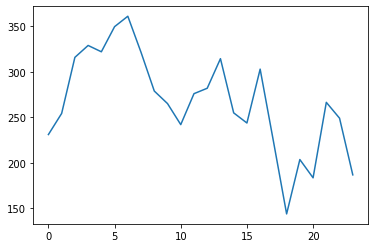

230


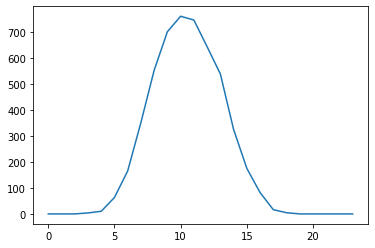

231


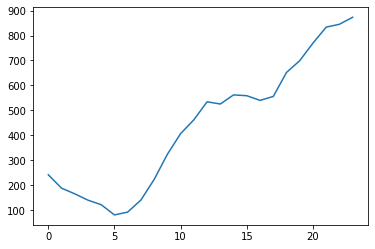

232


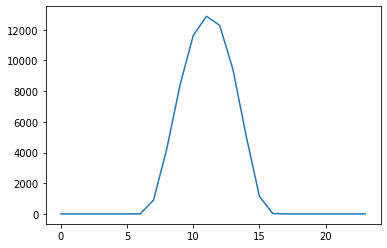

233


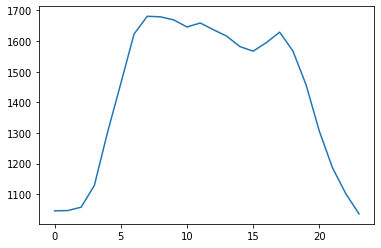

234


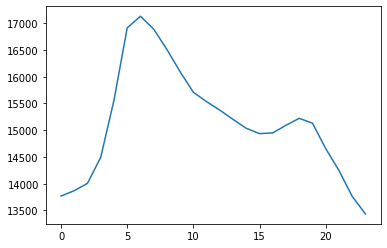

235


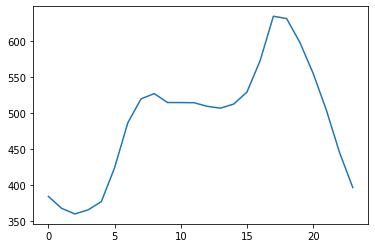

236


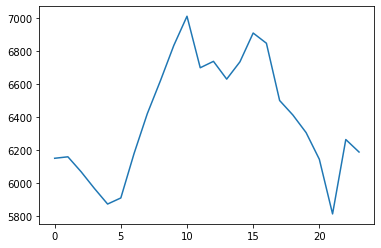

237


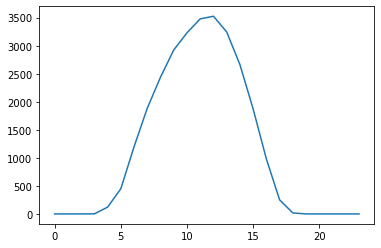

238


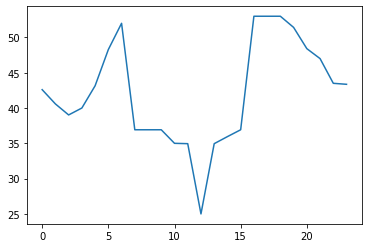

239


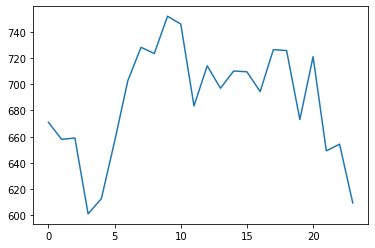

240


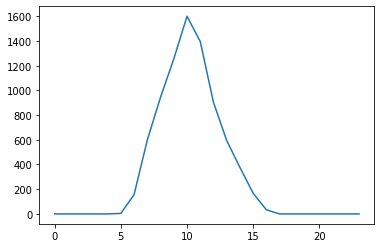

241


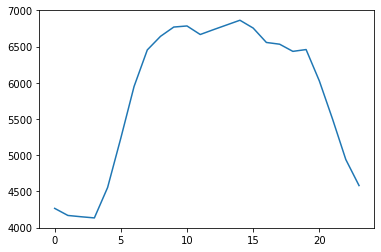

242


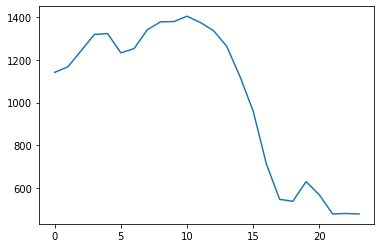

243


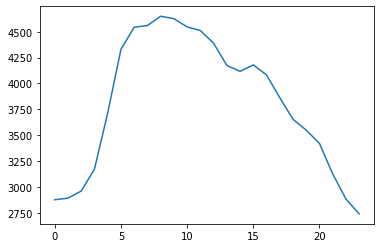

244


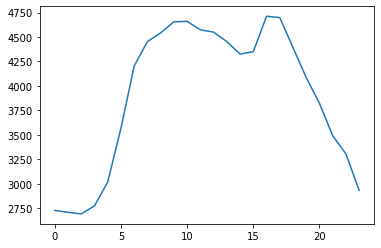

245


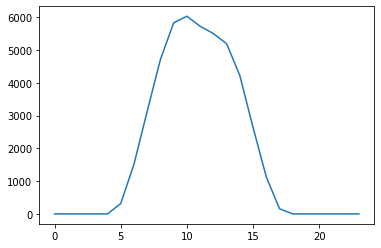

246


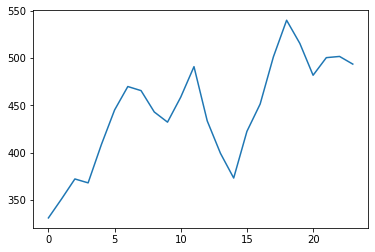

247


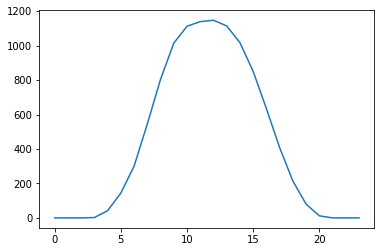

248


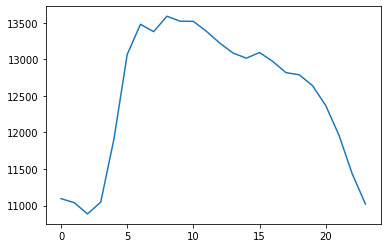

249


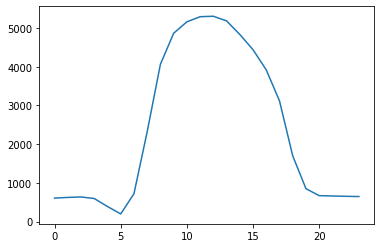

250


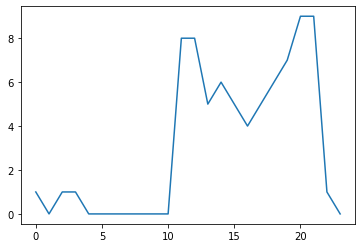

251


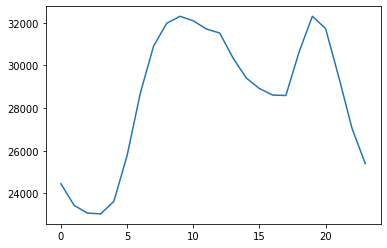

252


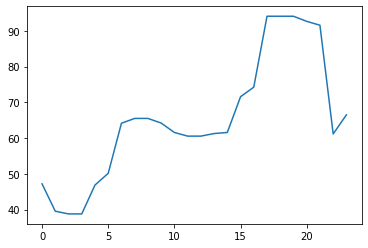

253


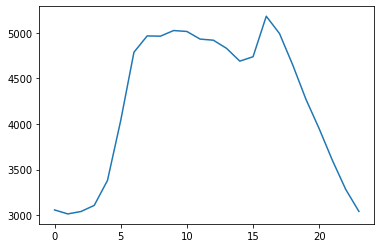

254


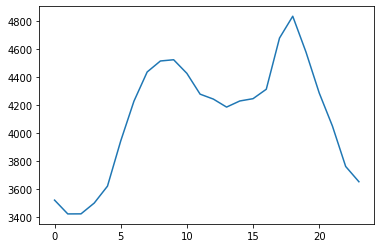

255


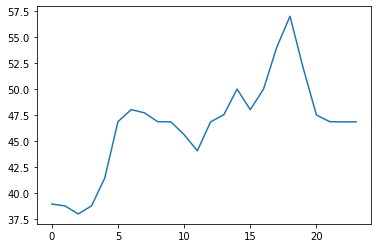

256


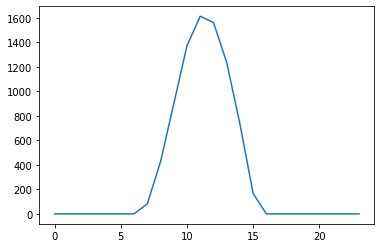

257


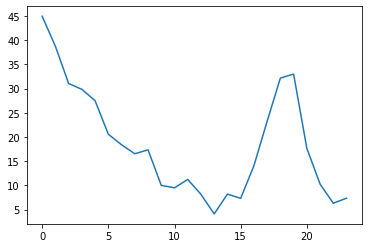

258


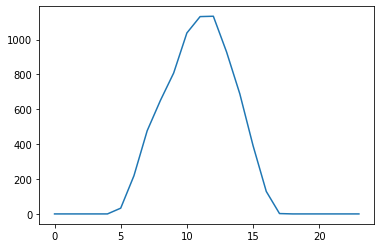

259


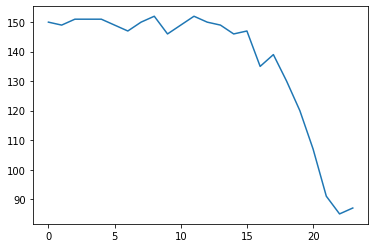

260


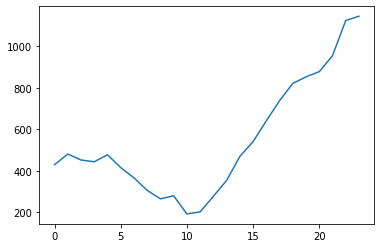

261


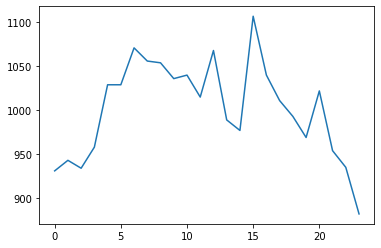

262


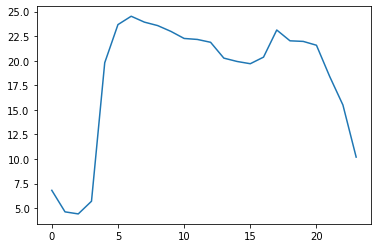

263


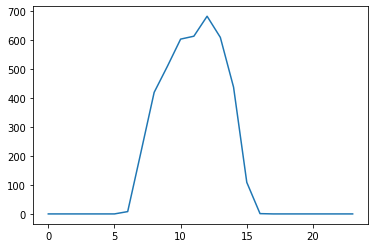

264


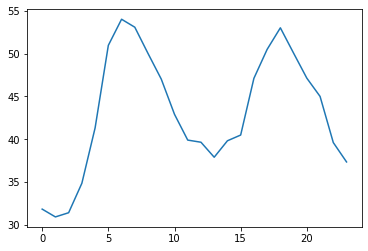

265


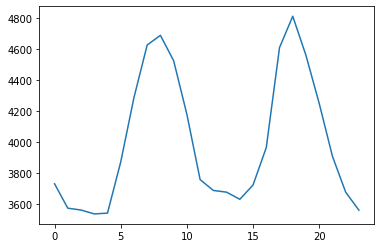

266


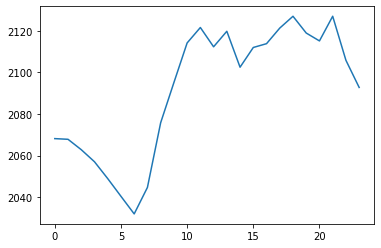

267


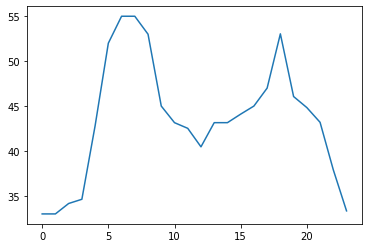

268


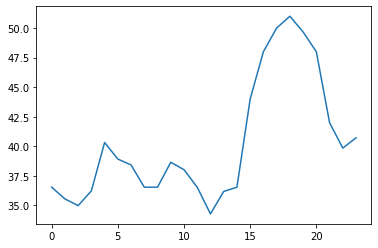

269


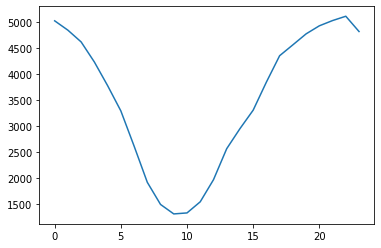

270


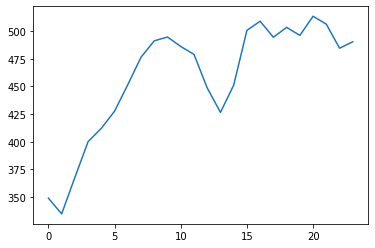

271


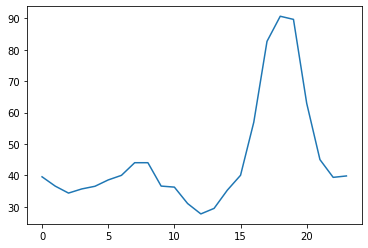

272


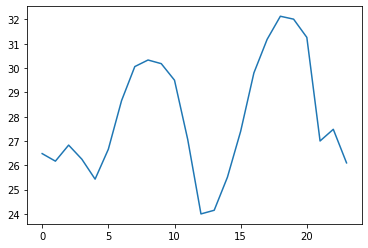

273


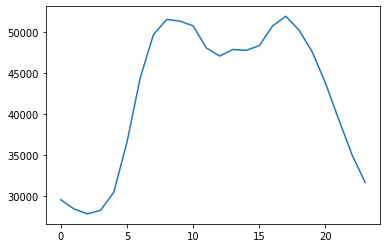

274


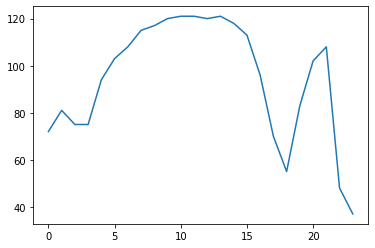

275


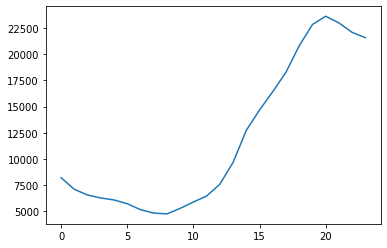

276


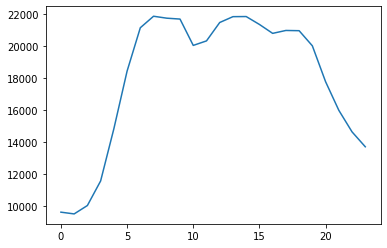

277


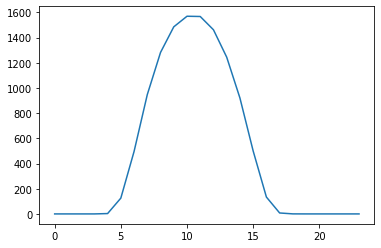

278


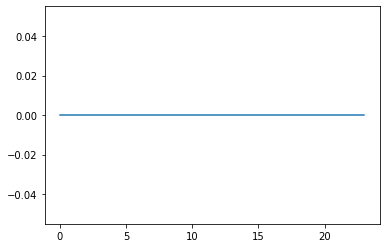

279


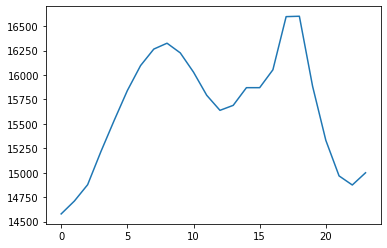

280


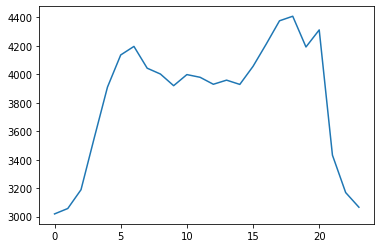

281


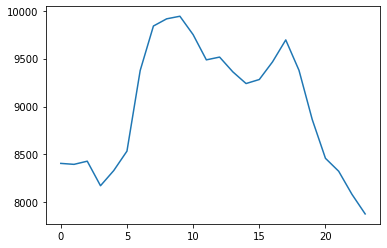

282


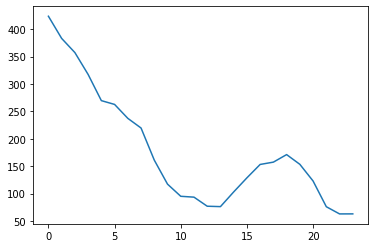

283


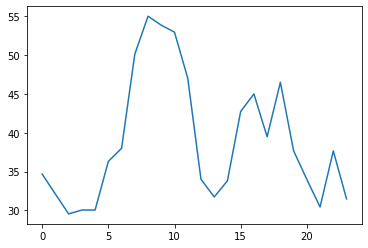

284


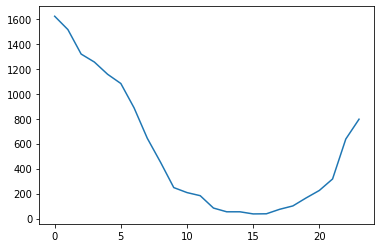

285


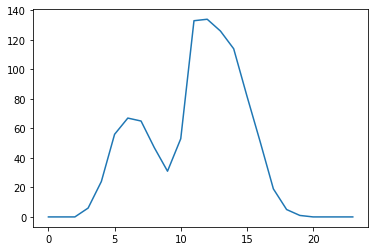

286


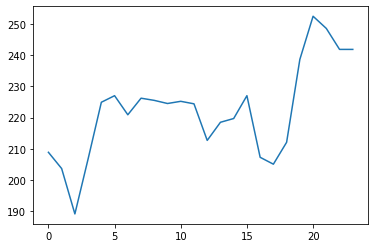

287


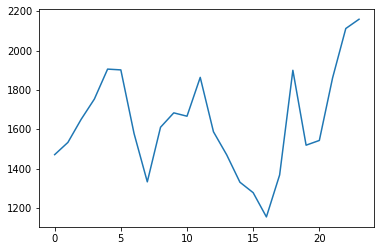

288


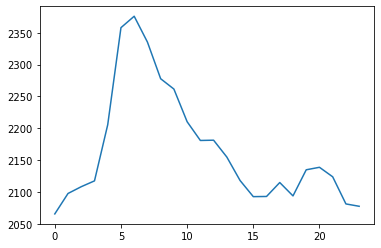

289


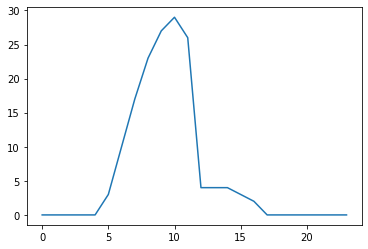

290


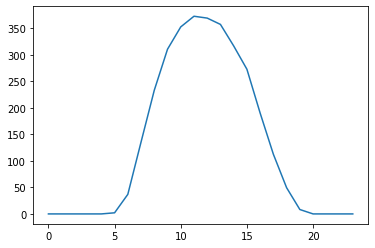

291


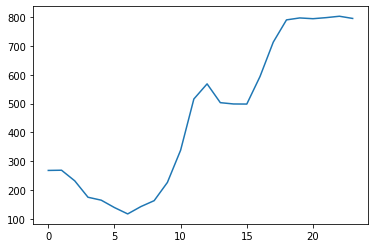

292


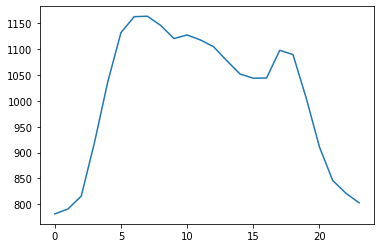

293


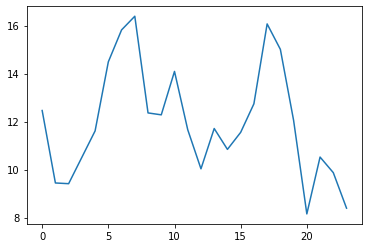

294


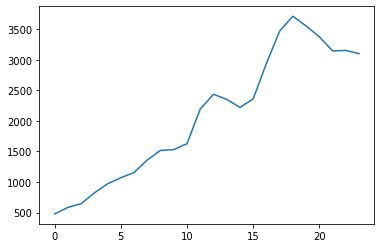

295


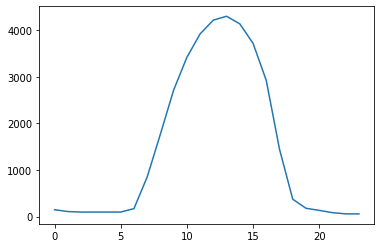

296


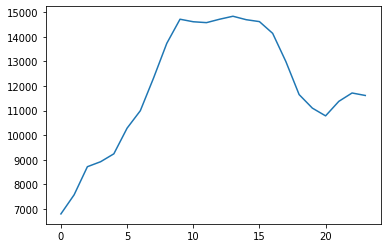

297


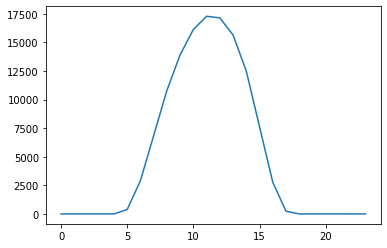

298


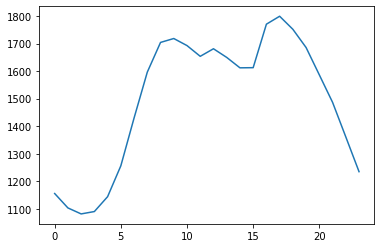

299


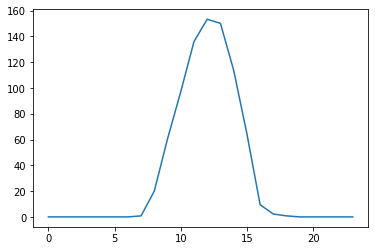

300


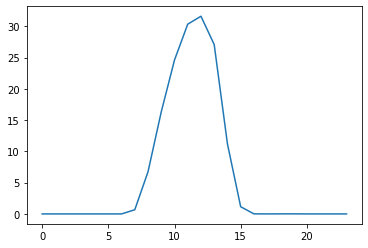

301


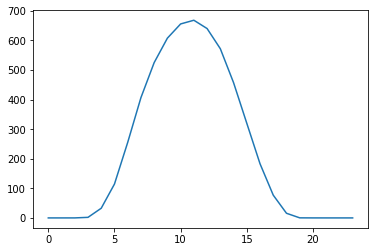

302


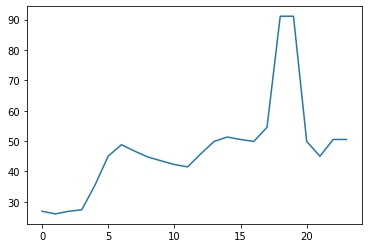

303


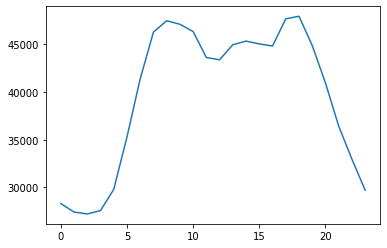

304


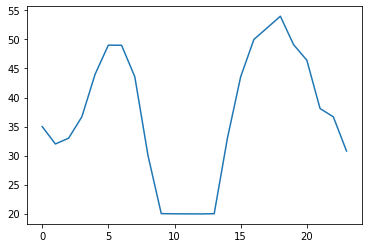

305


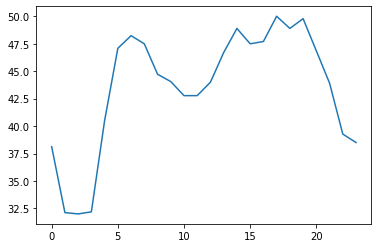

306


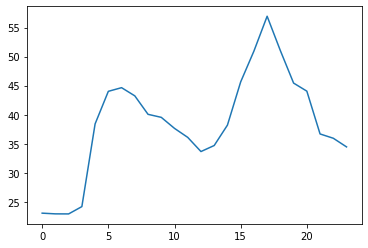

307


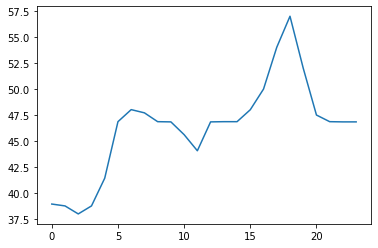

308


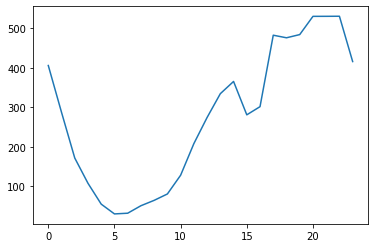

309


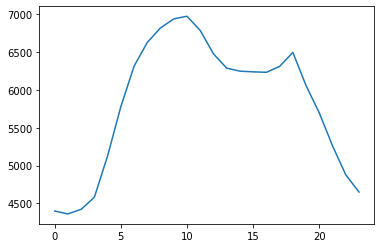

310


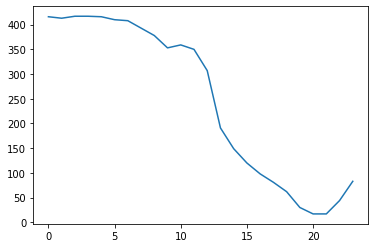

311


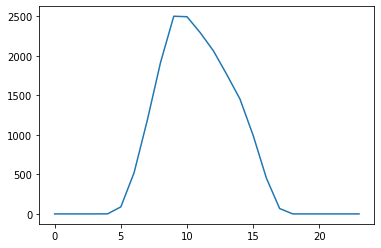

312


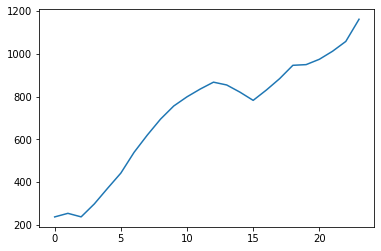

313


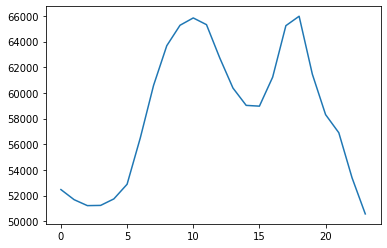

314


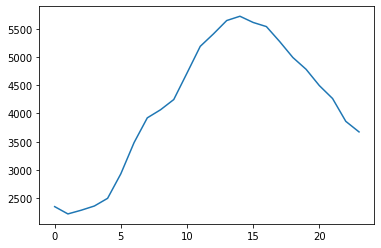

315


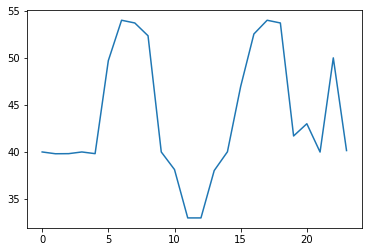

316


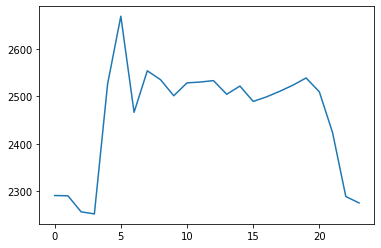

317


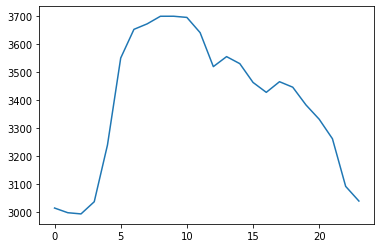

318


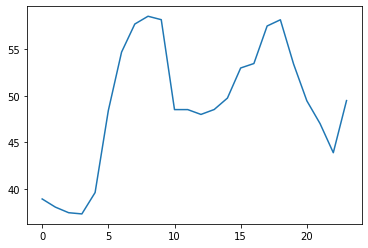

319


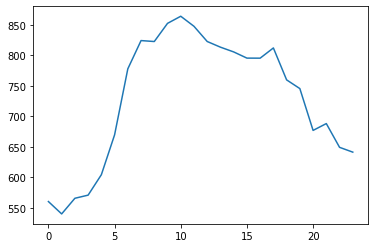

320


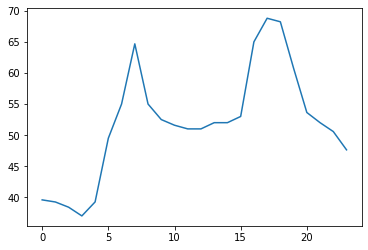

321


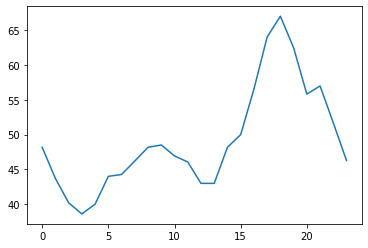

322


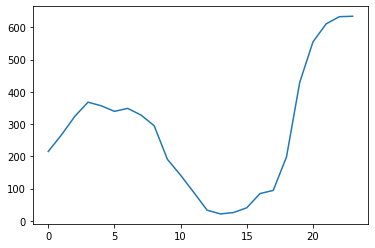

323


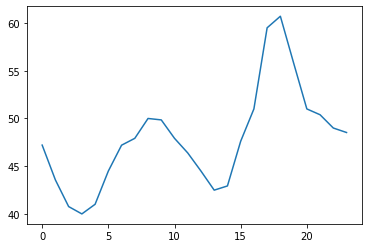

324


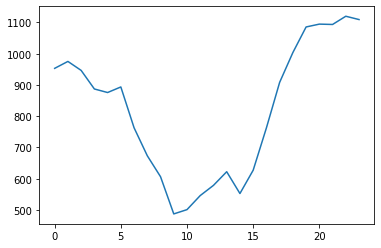

325


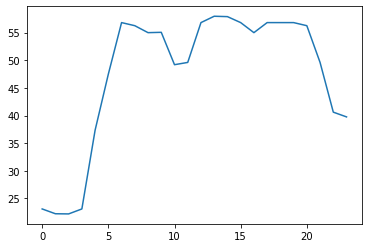

326


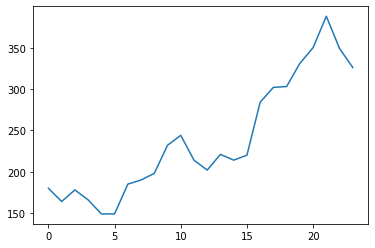

327


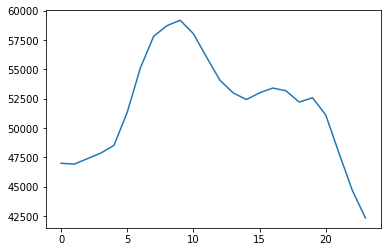

328


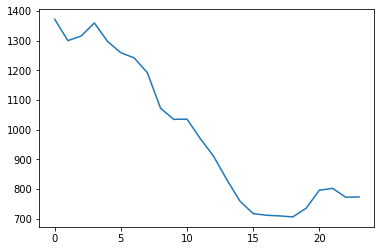

329


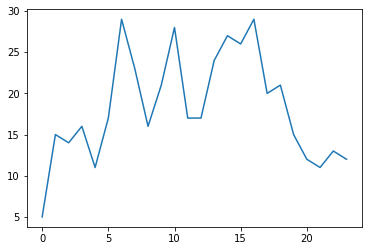

330


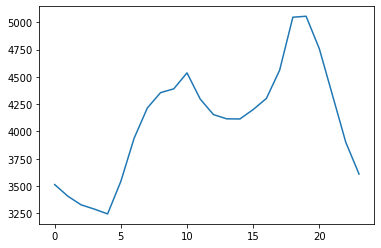

331


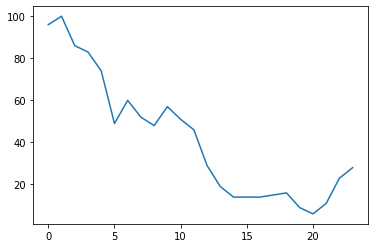

332


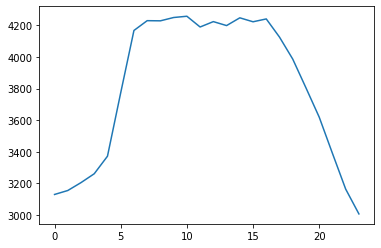

333


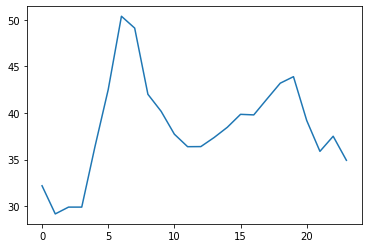

334


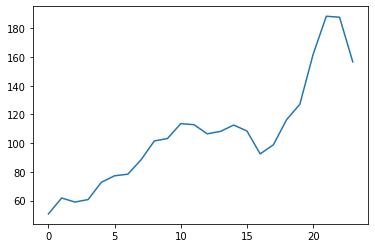

335


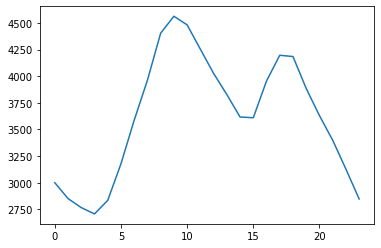

336


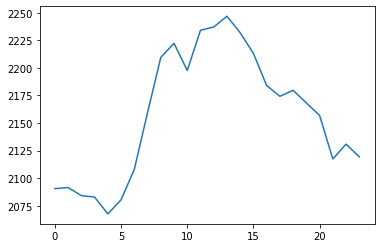

337


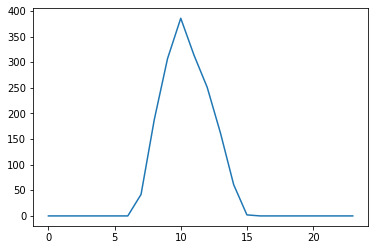

338


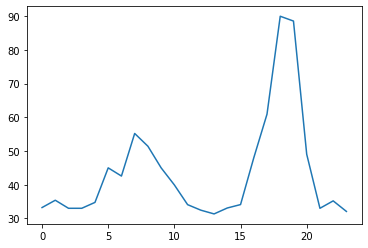

339


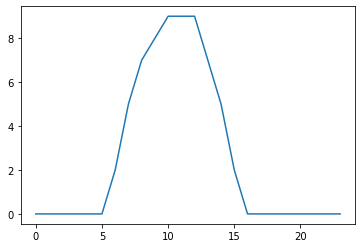

340


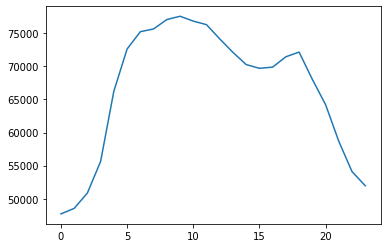

341


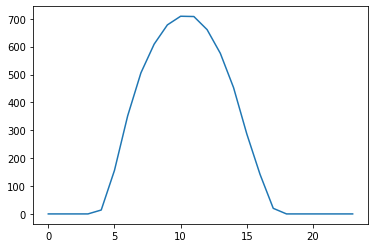

342


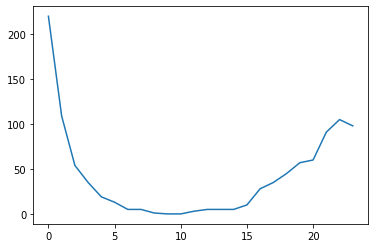

343


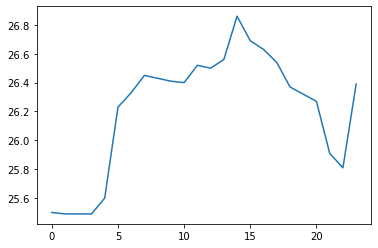

344


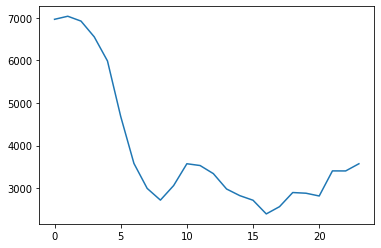

345


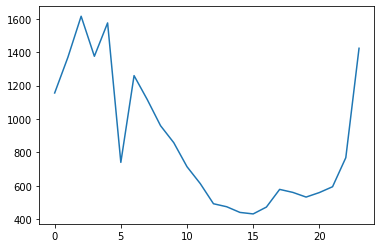

346


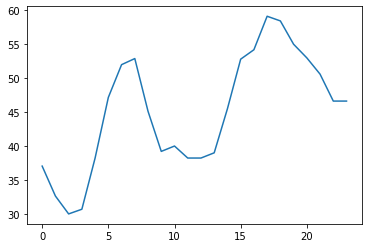

347


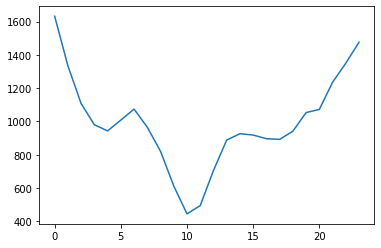

348


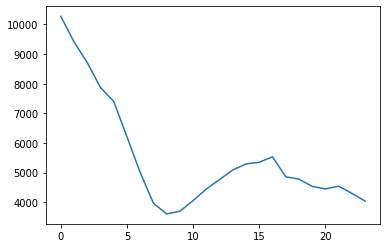

349


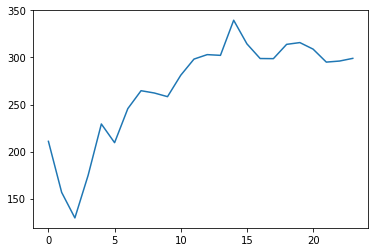

350


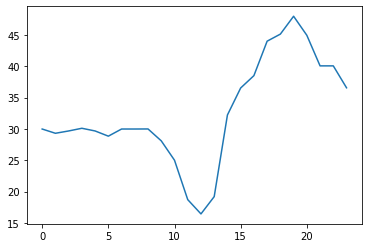

351


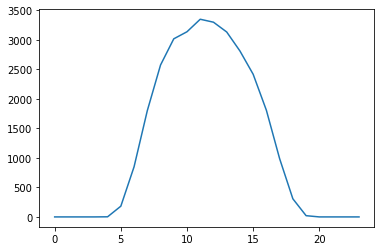

352


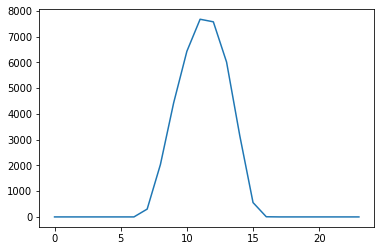

353


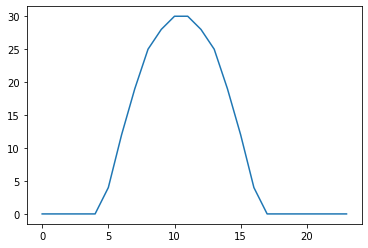

354


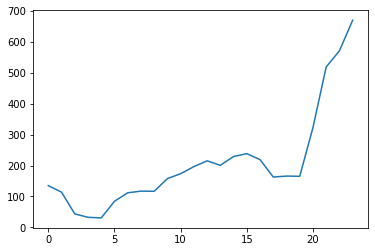

355


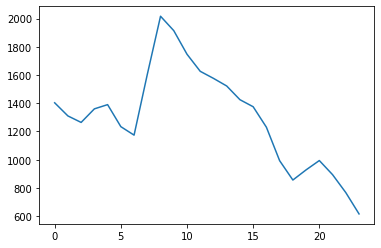

356


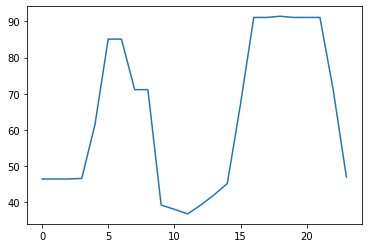

357


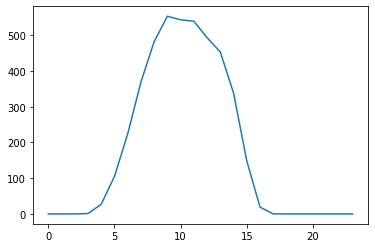

358


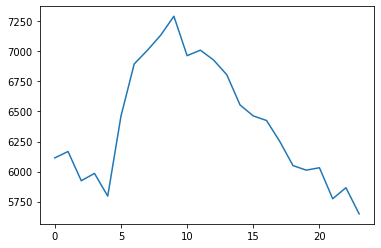

359


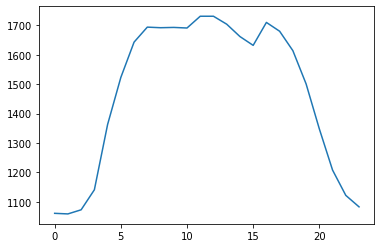

360


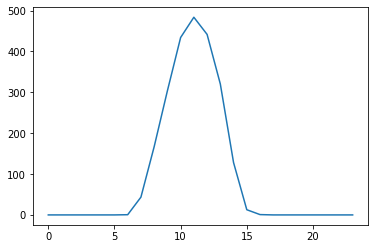

361


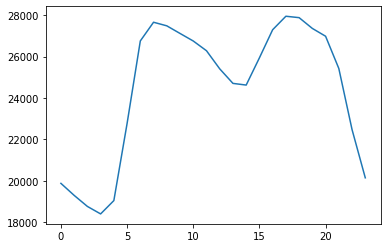

362


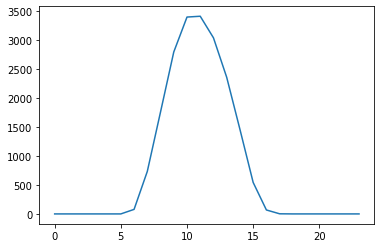

363


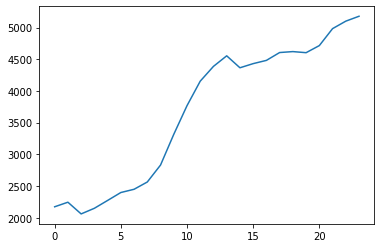

364


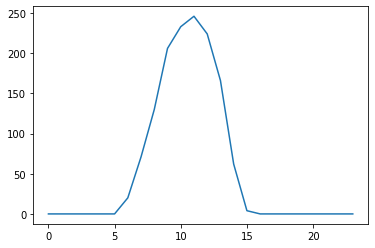

365


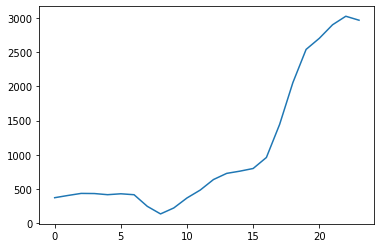

366


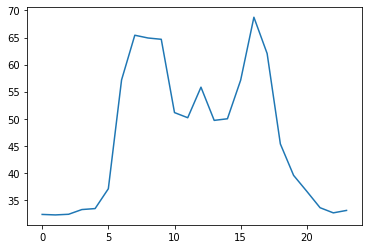

367


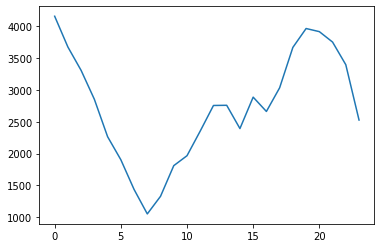

368


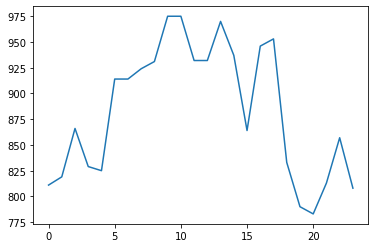

369


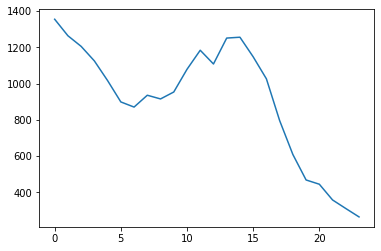

370


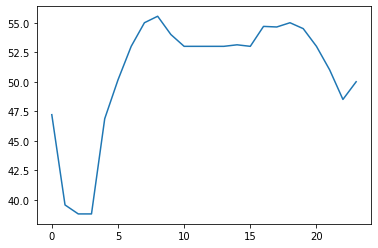

371


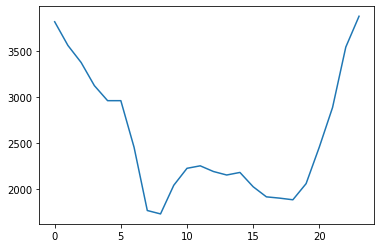

372


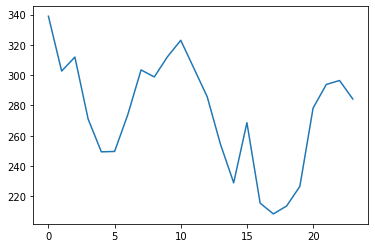

373


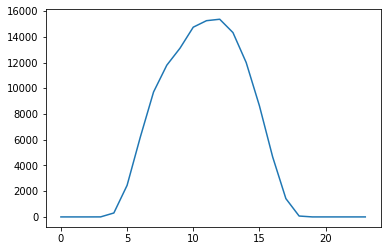

374


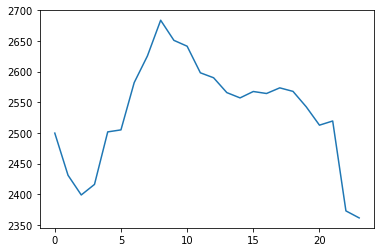

375


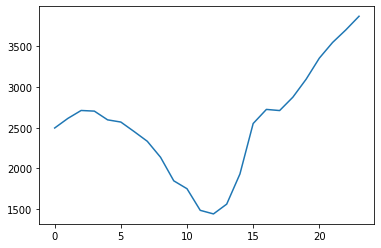

376


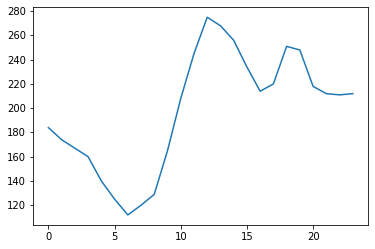

377


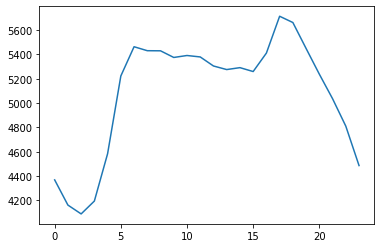

378


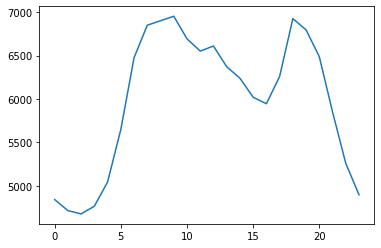

379


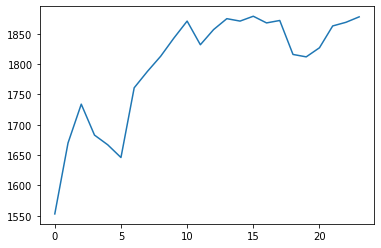

380


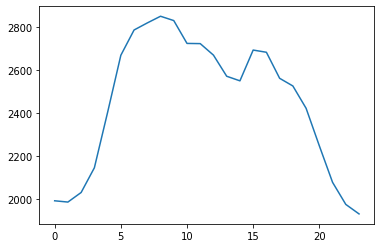

381


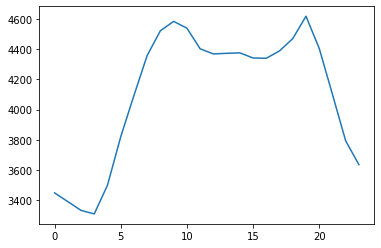

382


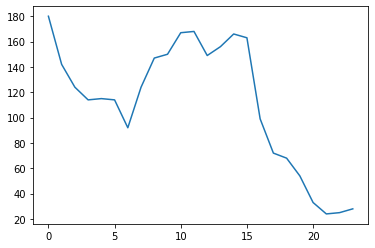

383


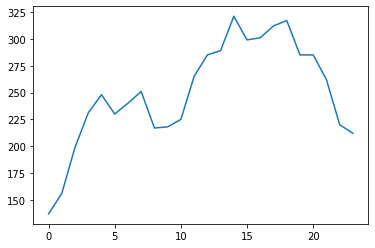

384


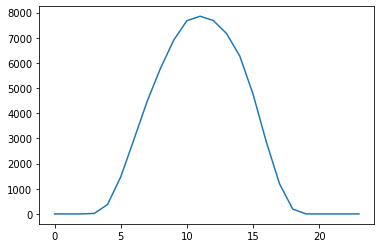

385


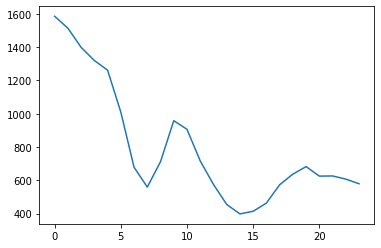

386


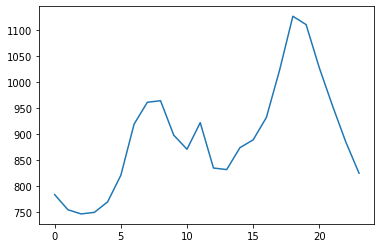

387


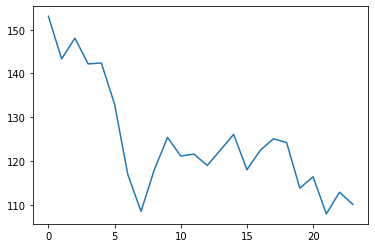

388


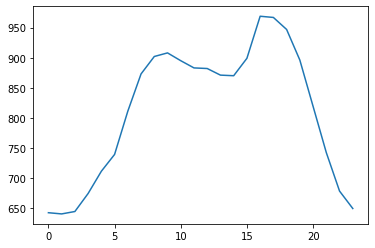

389


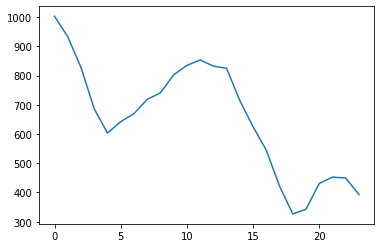

390


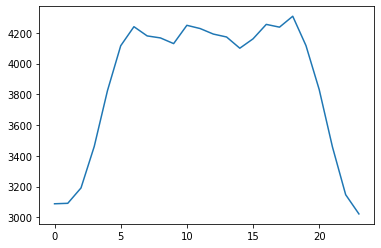

391


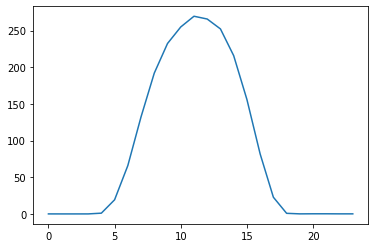

392


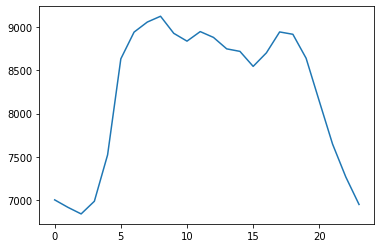

393


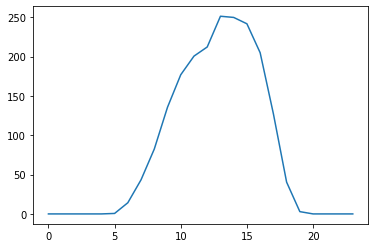

394


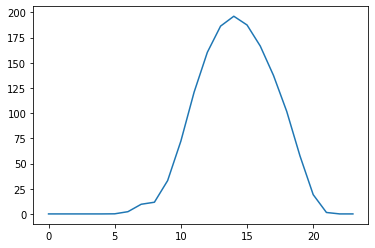

395


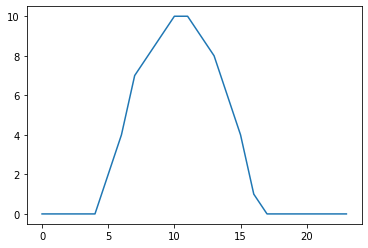

396


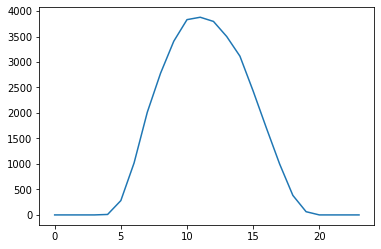

397


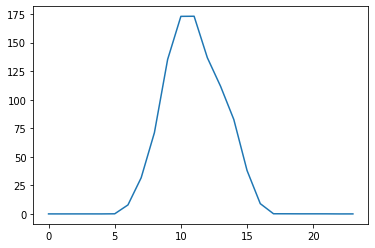

398


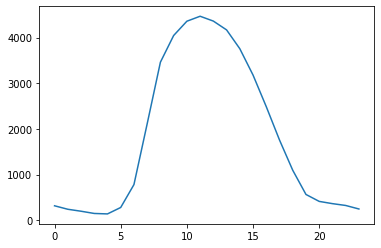

399


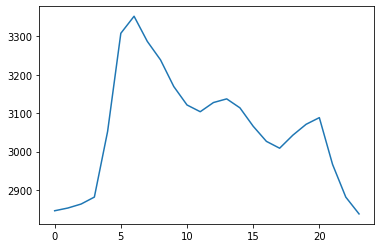

400


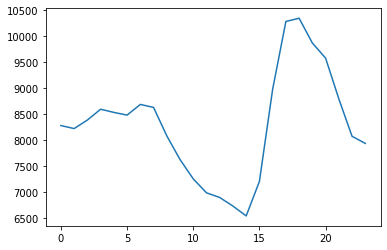

401


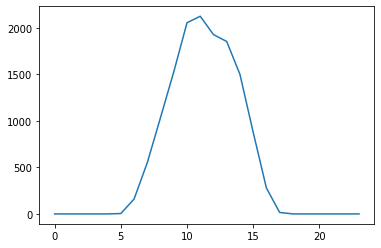

402


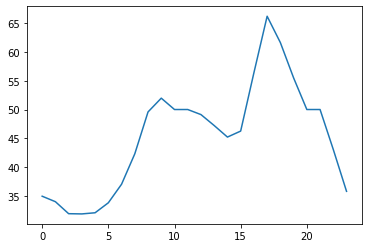

403


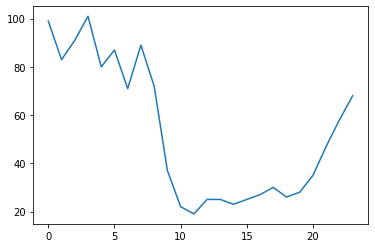

404


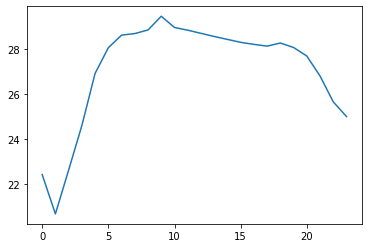

405


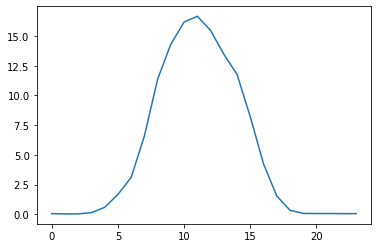

406


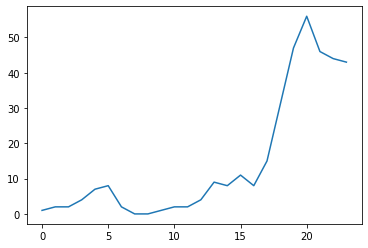

407


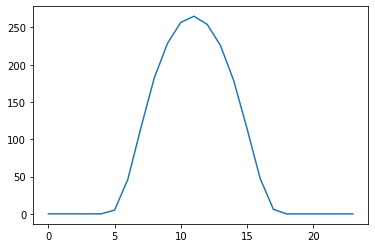

408


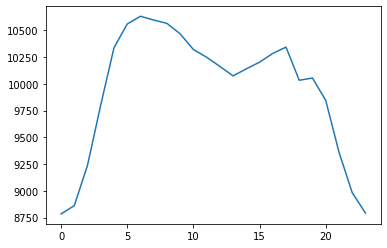

409


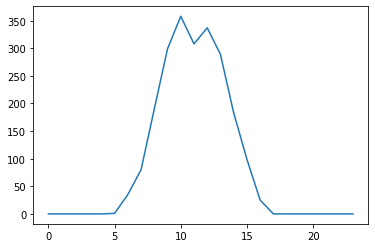

410


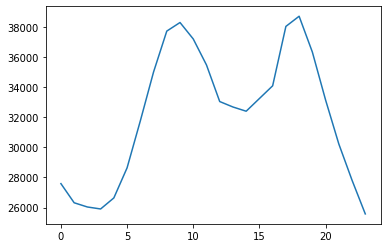

411


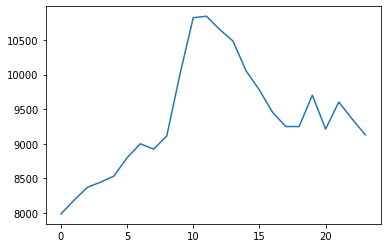

412


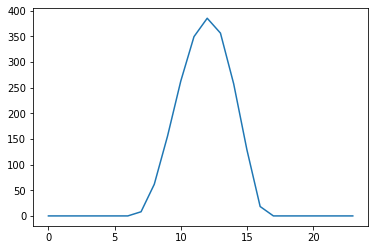

413


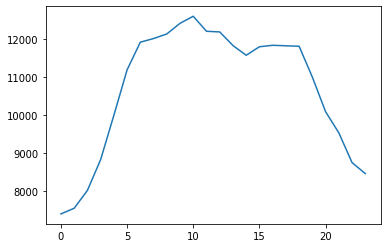

414


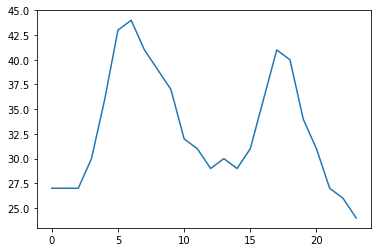

415


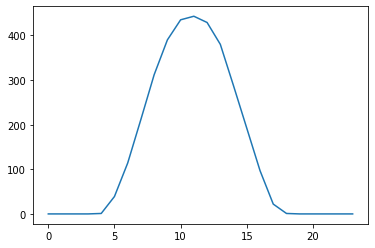

416


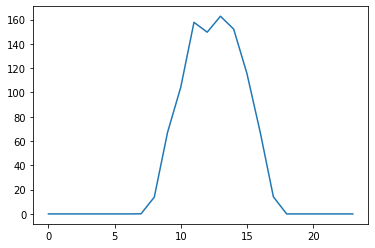

417


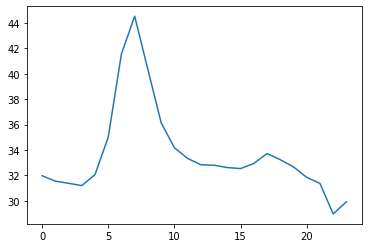

418


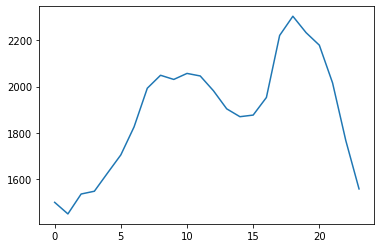

419


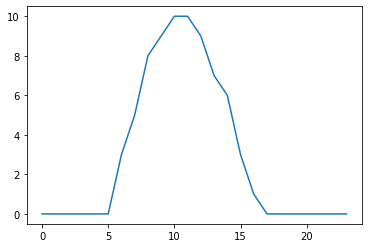

420


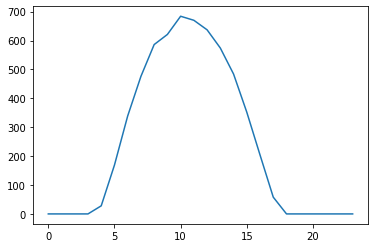

421


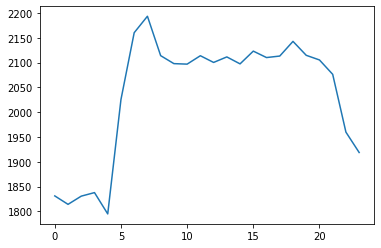

422


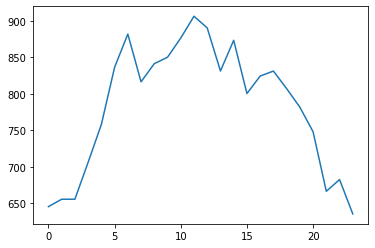

423


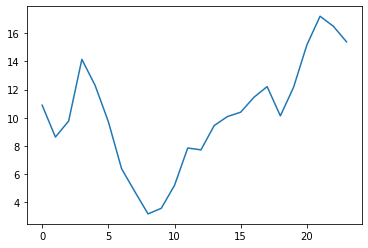

424


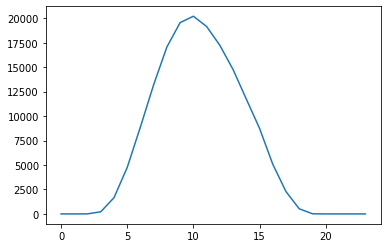

425


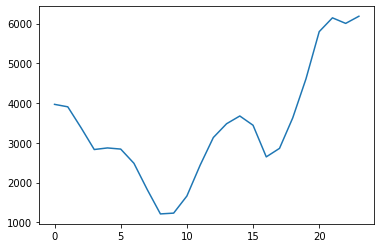

426


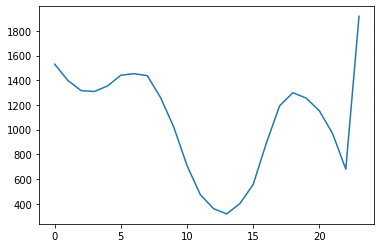

427


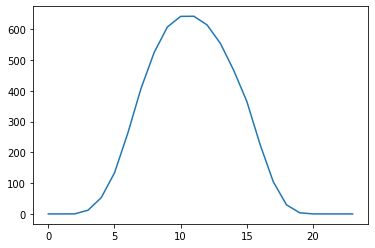

428


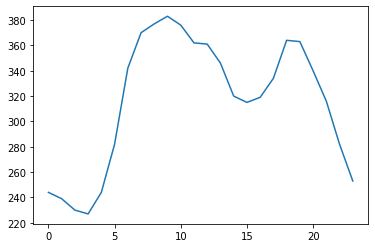

429


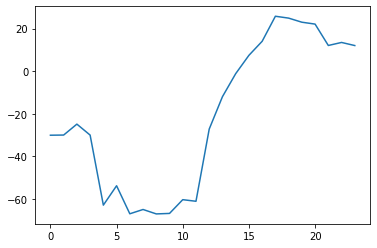

430


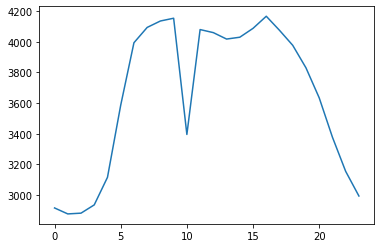

431


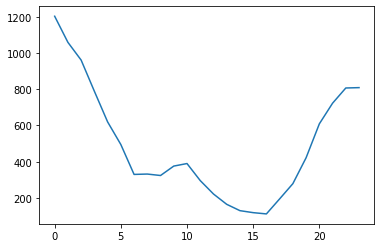

432


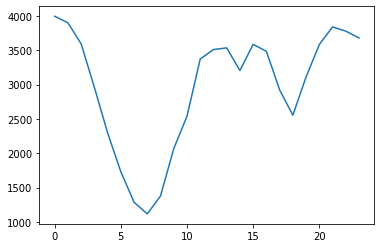

433


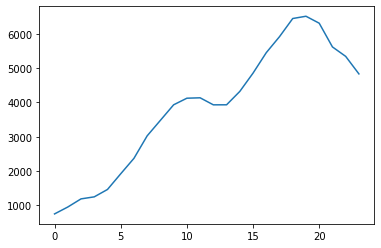

434


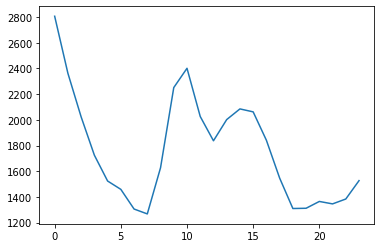

435


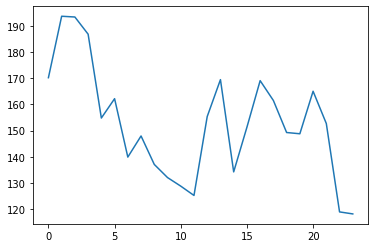

436


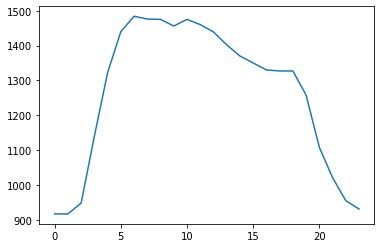

437


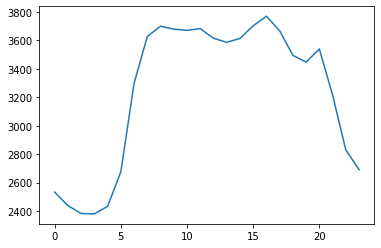

438


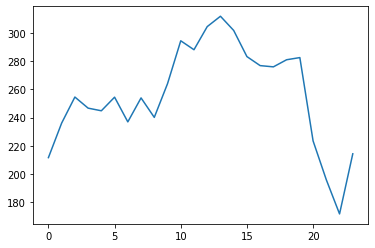

439


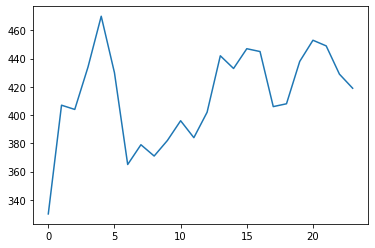

440


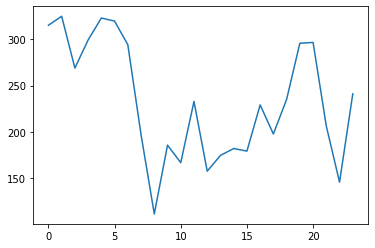

441


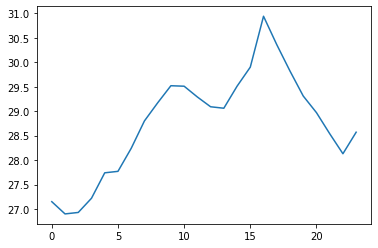

442


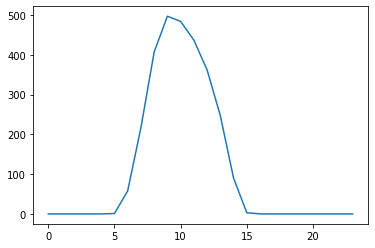

443


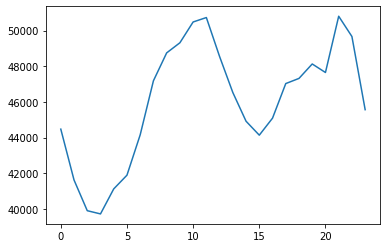

444


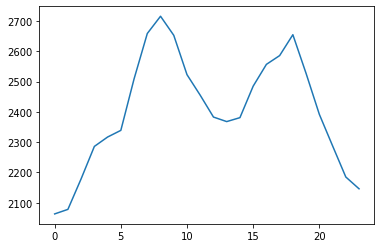

445


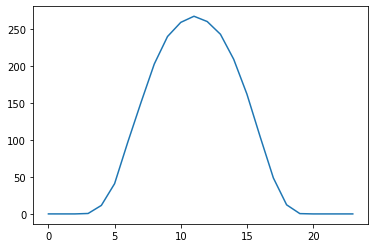

446


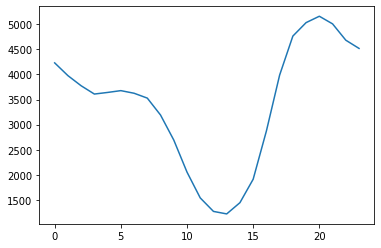

447


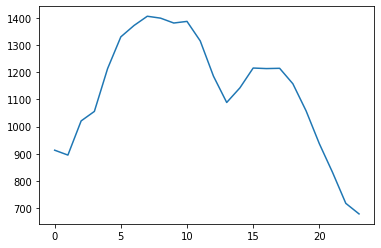

448


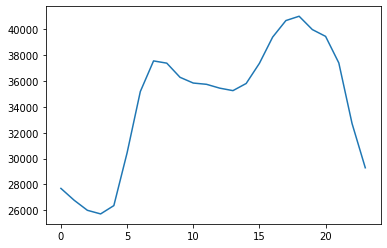

449


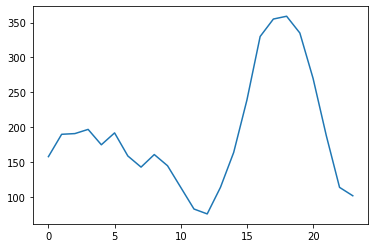

450


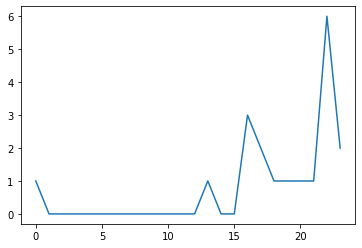

451


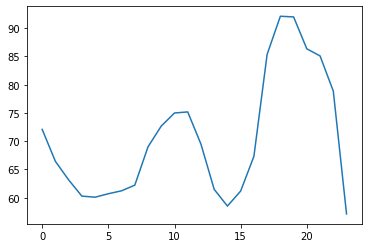

452


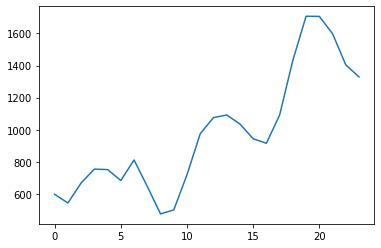

453


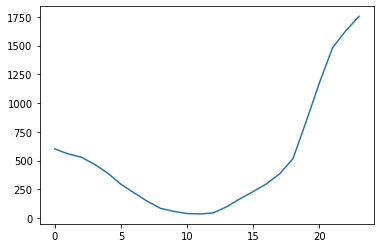

454


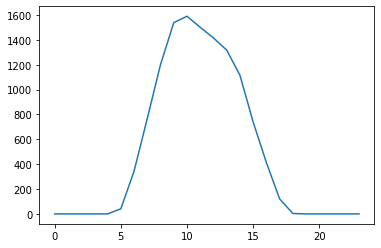

455


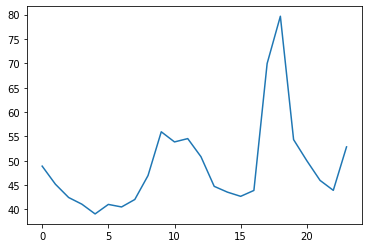

456


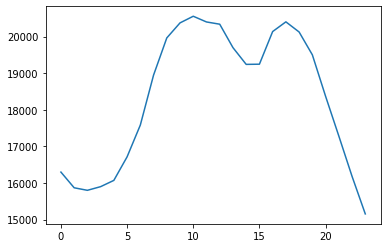

457


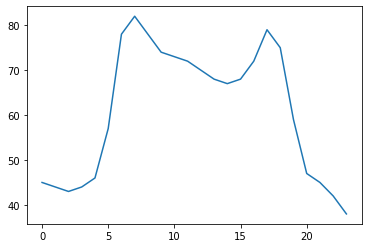

458


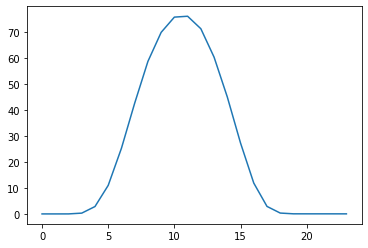

459


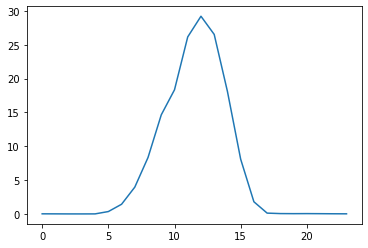

460


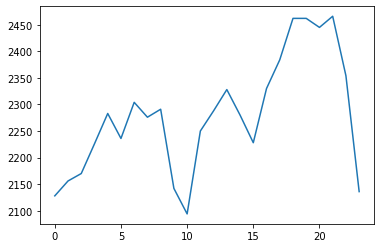

461


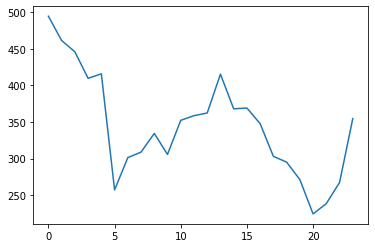

462


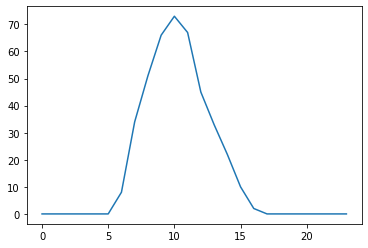

463


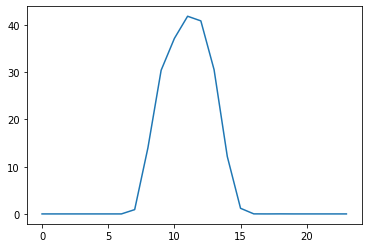

464


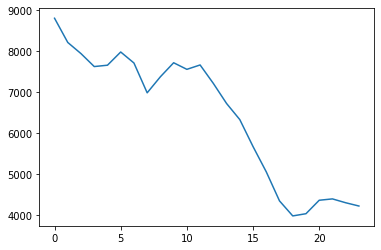

465


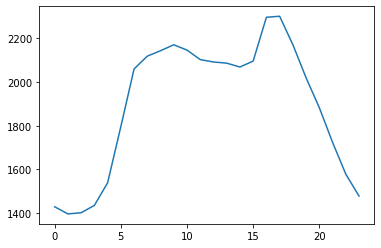

466


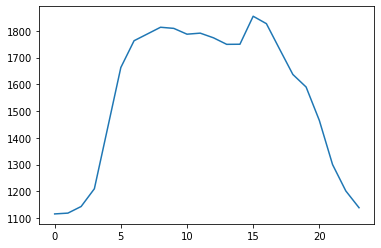

467


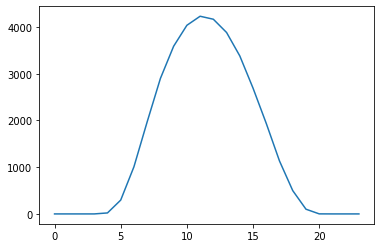

468


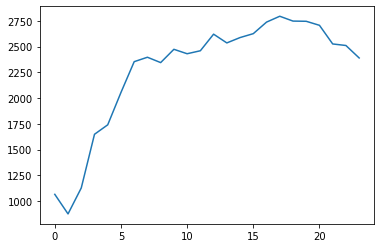

469


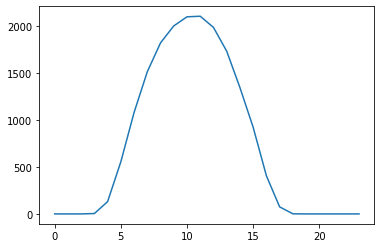

470


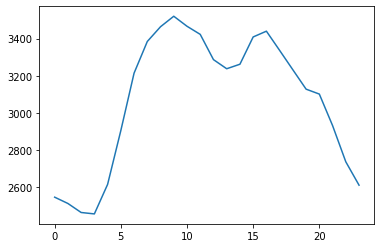

471


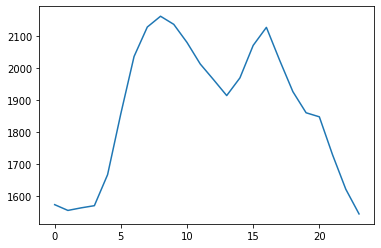

472


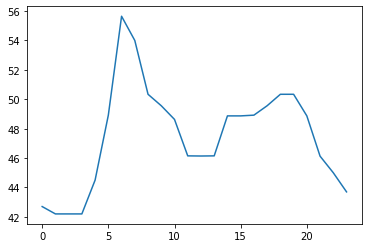

473


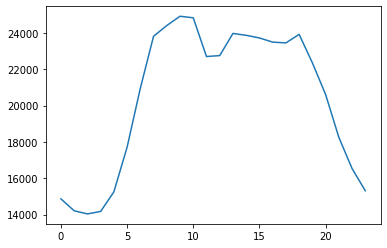

474


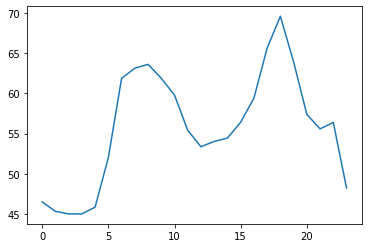

475


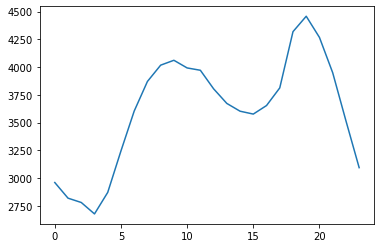

476


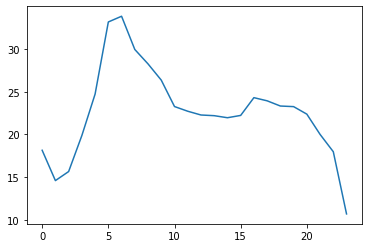

477


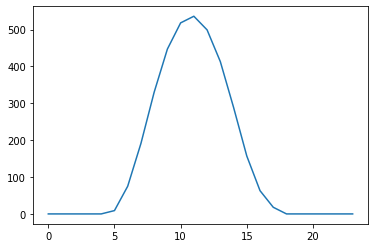

478


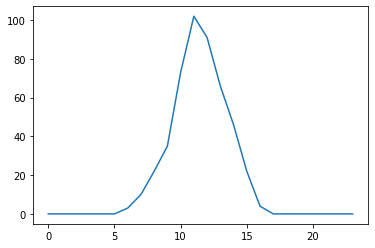

479


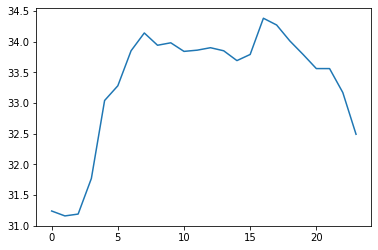

480


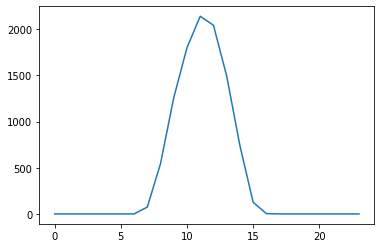

481


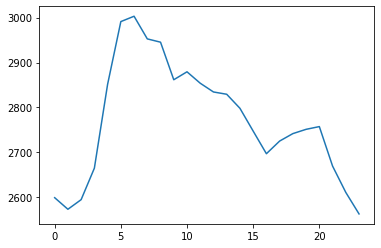

482


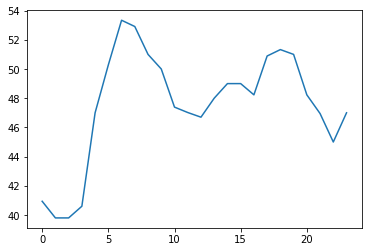

483


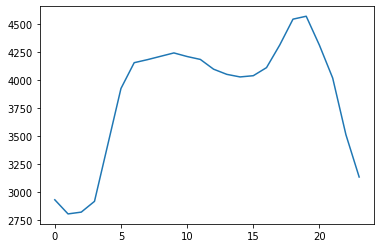

484


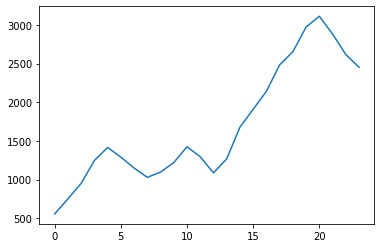

485


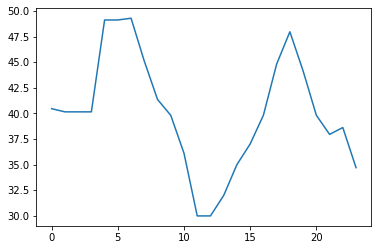

486


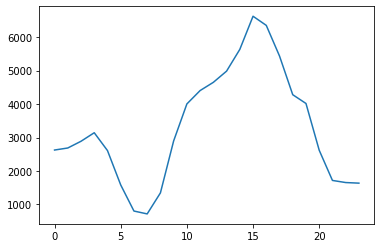

487


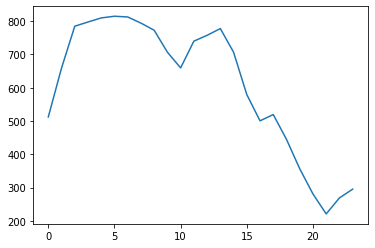

488


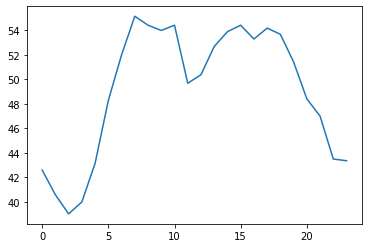

489


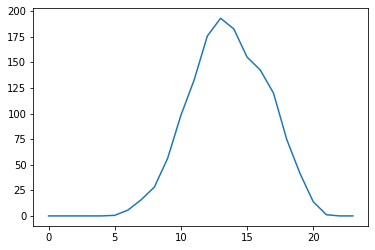

490


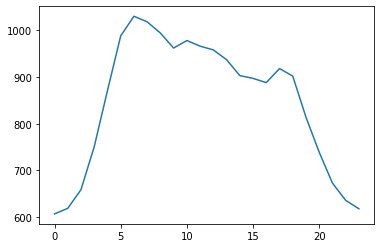

491


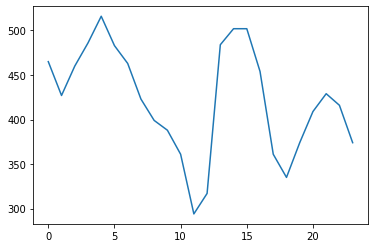

492


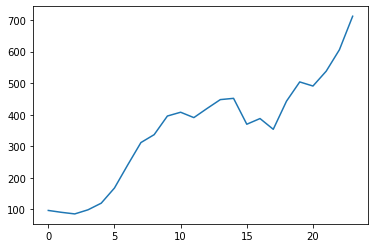

493


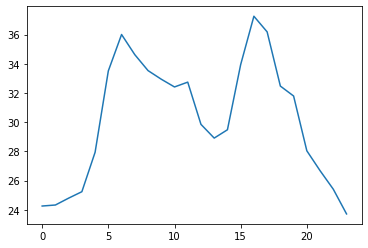

494


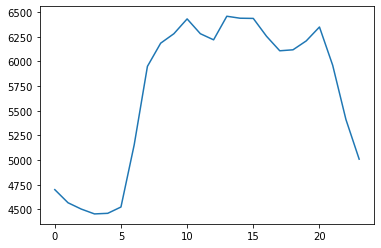

495


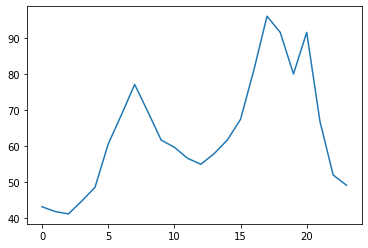

496


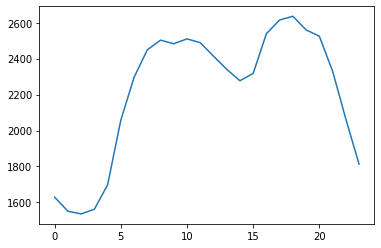

497


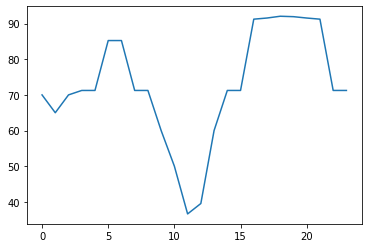

498


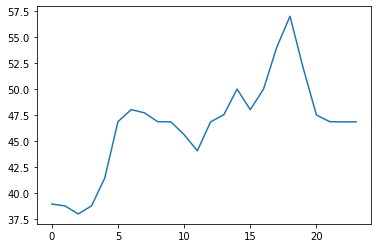

499


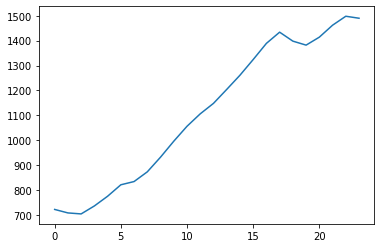

500


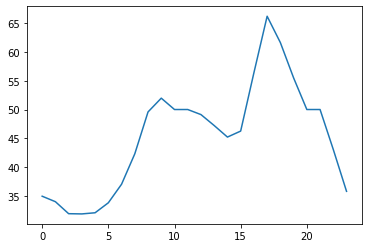

501


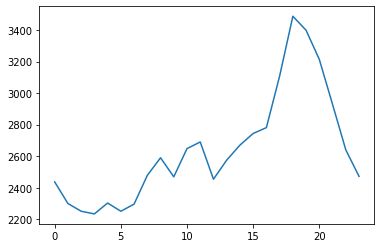

502


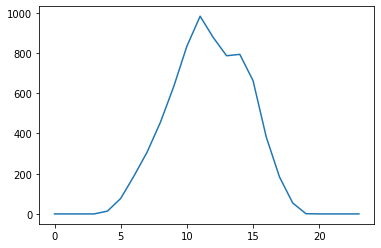

503


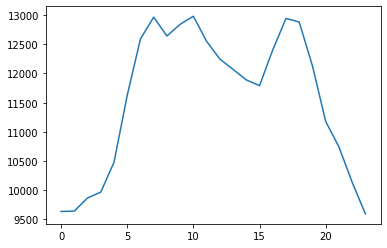

504


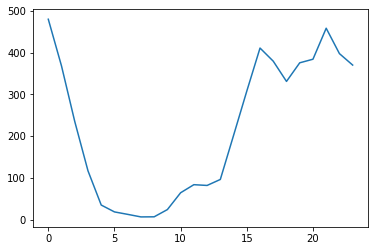

505


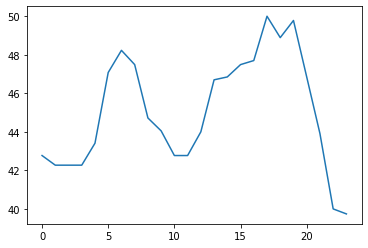

506


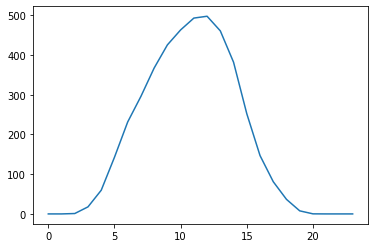

507


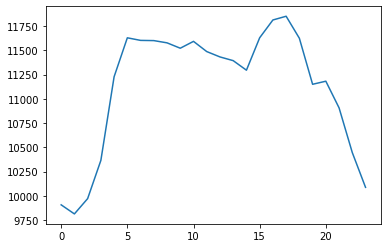

508


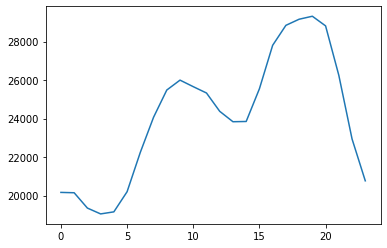

509


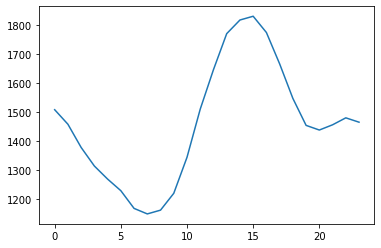

510


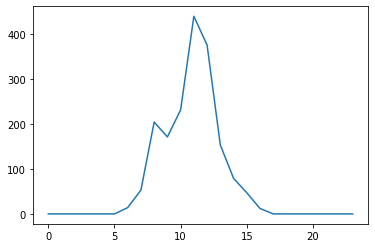

511


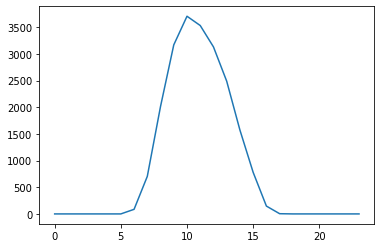

512


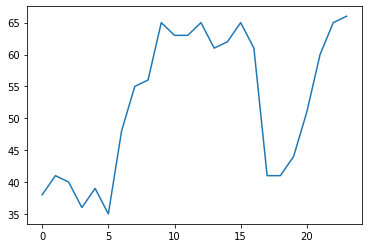

513


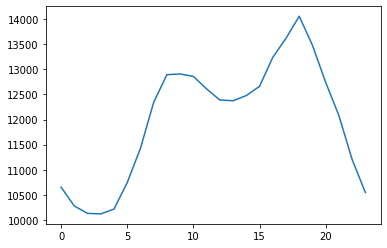

514


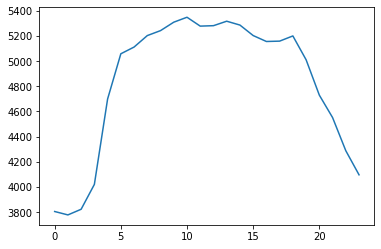

515


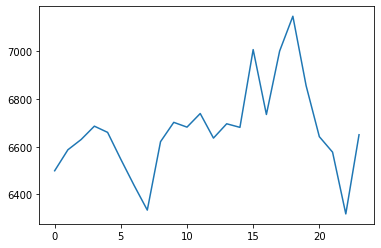

516


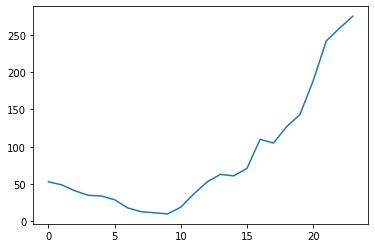

517


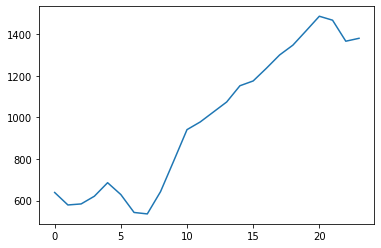

518


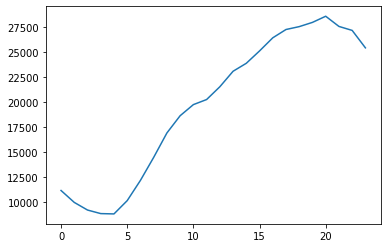

519


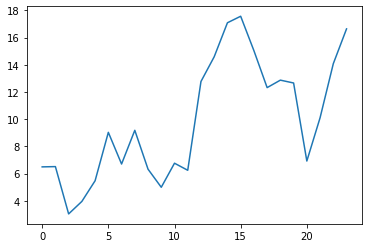

520


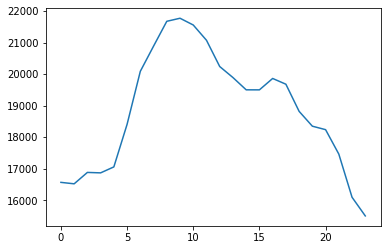

521


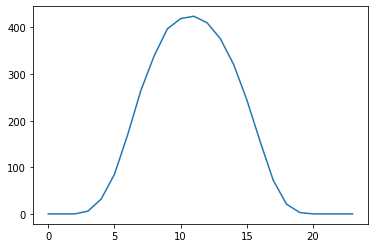

522


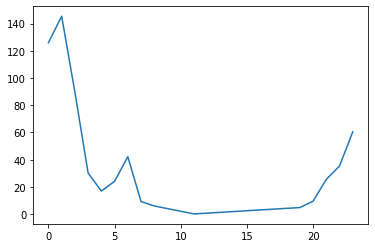

523


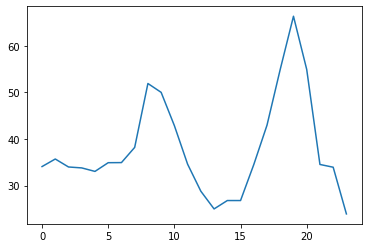

524


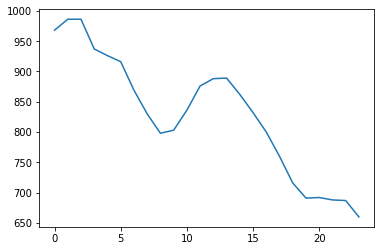

525


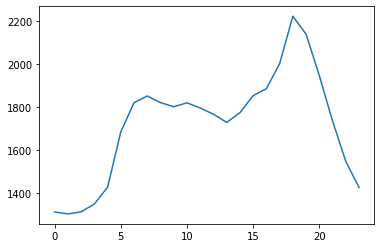

526


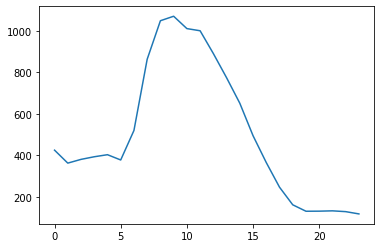

527


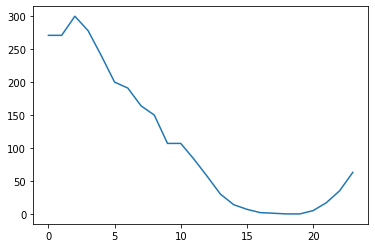

528


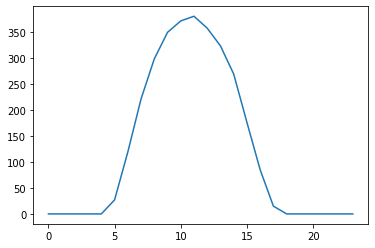

529


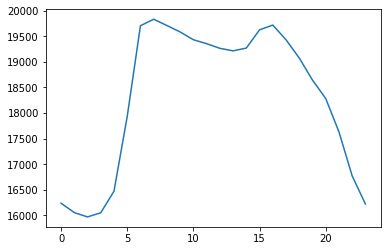

530


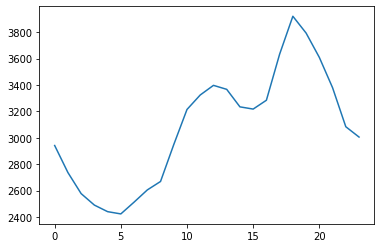

531


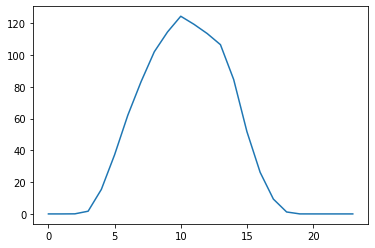

532


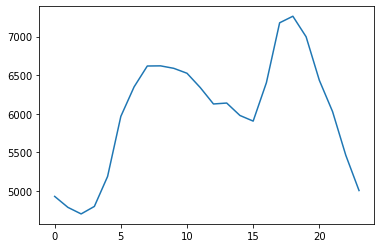

533


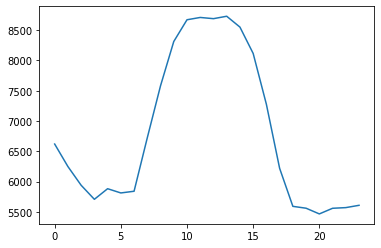

534


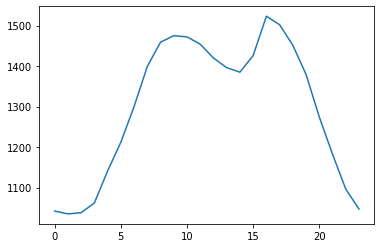

535


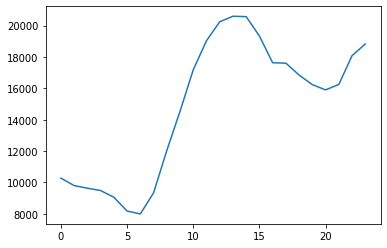

536


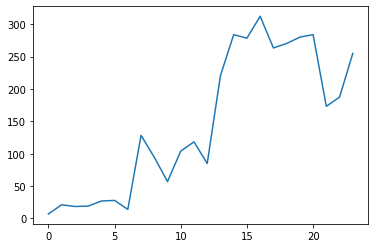

537


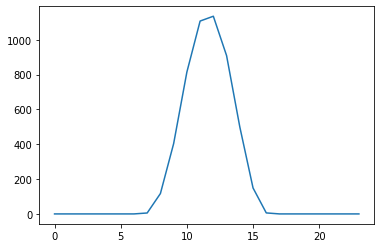

538


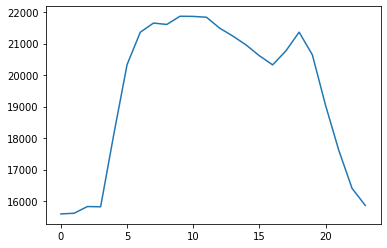

539


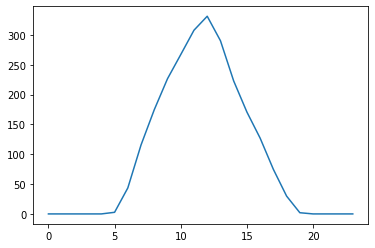

540


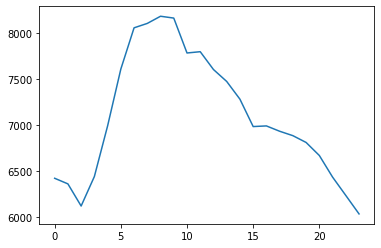

541


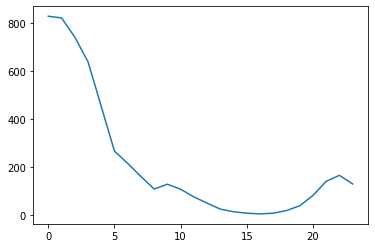

542


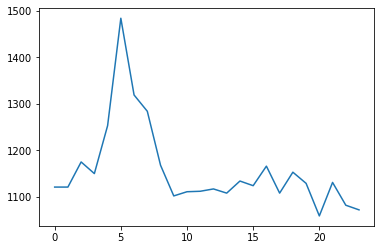

543


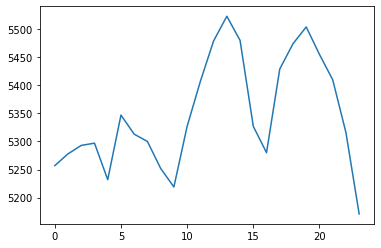

544


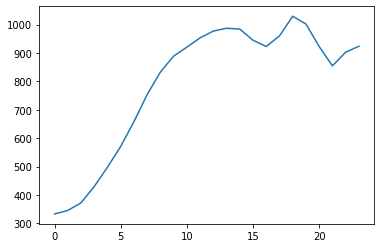

545


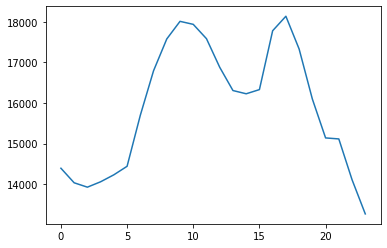

546


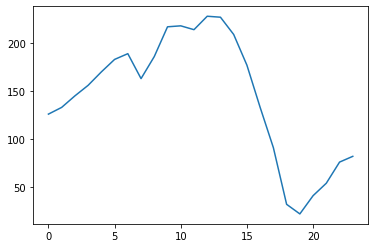

547


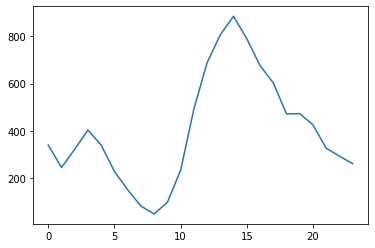

548


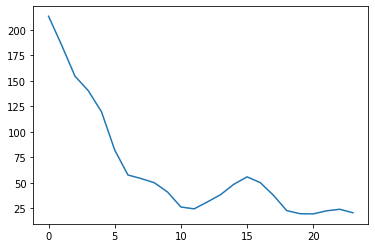

549


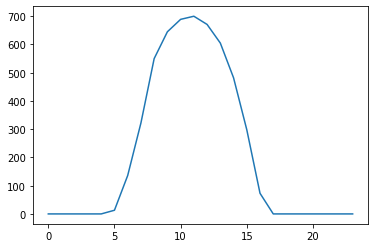

550


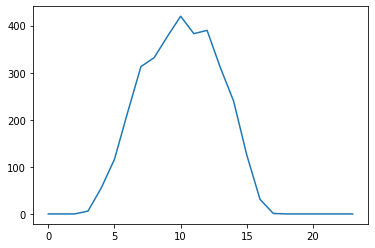

551


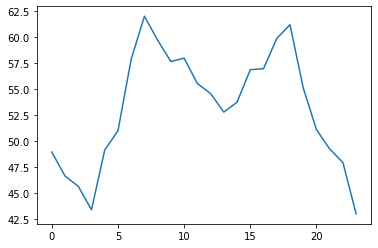

552


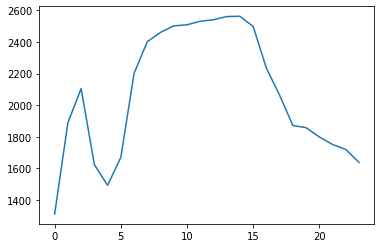

553


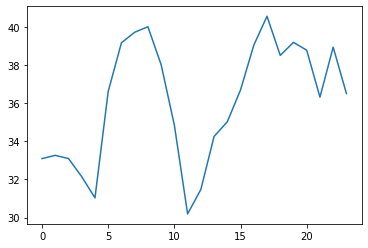

554


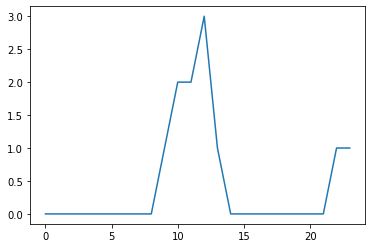

555


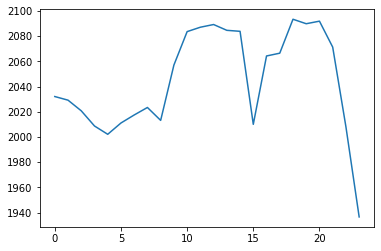

556


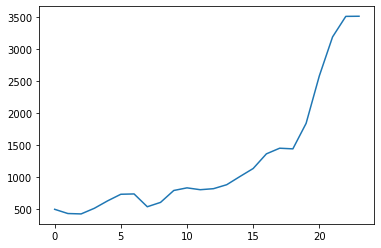

557


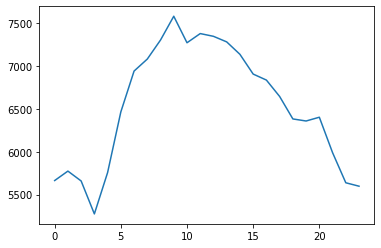

558


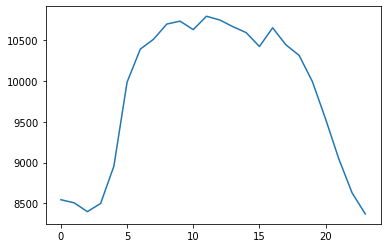

559


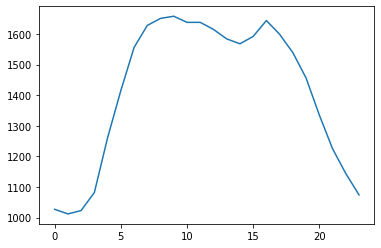

560


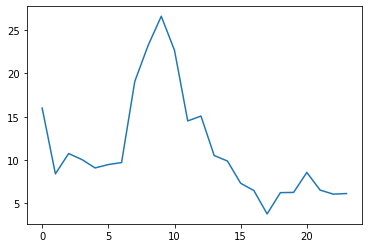

561


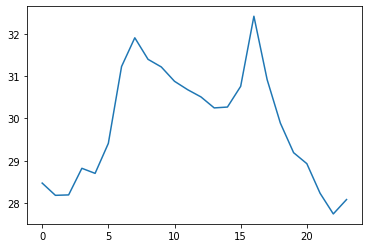

562


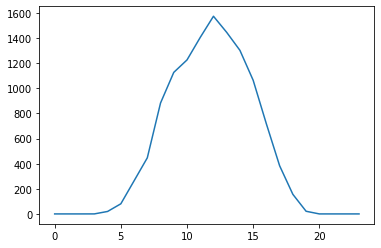

563


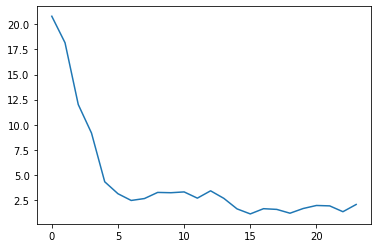

564


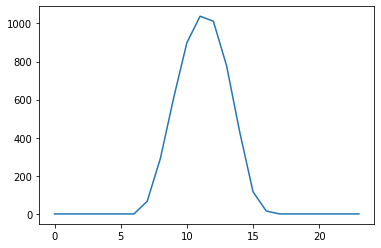

565


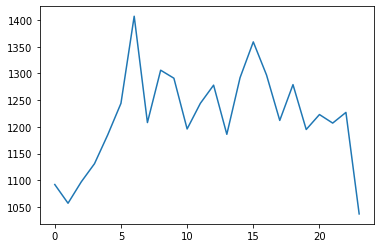

566


KeyboardInterrupt: 

In [110]:
for i in range(x.shape[0]):
    print(i)
    plt.plot(x[i,:])
    plt.show()

In [56]:
import numpy as np 
x = np.load('./experiments/power_system_24/Y.npy')[:,-24:]
x = x.reshape(183, int(x.shape[0]/183)*24)
x.shape

(183, 3816)

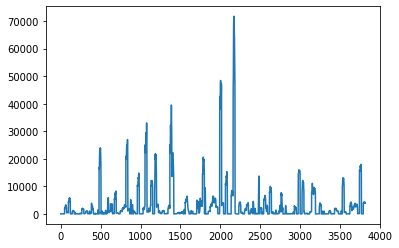

In [57]:
import matplotlib.pyplot as plt
plt.plot(x[0,:])

In [35]:
x.shape

(183, 3816)

In [4]:
import numpy as np

a = np.array([[1, 2, 3], [4, 5, 6]])

b = np.array([[9, 8, 7], [6, 5, 4]])

np.vstack((a, b))

array([[1, 2, 3],
       [4, 5, 6],
       [9, 8, 7],
       [6, 5, 4]])

In [16]:
!python3 preprocess_power_system.py --dataset='elect'\
                                    --data-folder='data' \
                                    --model-name='power_system_36' \
                                    --file-name='europe_power_system.csv' # europe_power_system.csv 
                                    #--test

The history saving thread hit an unexpected error (OperationalError('disk I/O error')).History will not be written to the database.
100%|█████████████████████████████████████████| 183/183 [00:05<00:00, 35.66it/s]
(135216, 192, 6)
(135216, 2)
(135216, 192)
Traceback (most recent call last):
  File "/appl/opt/python/mlpython-3.7.4/lib/python3.7/site-packages/numpy/lib/npyio.py", line 542, in save
    pickle_kwargs=pickle_kwargs)
  File "/appl/opt/python/mlpython-3.7.4/lib/python3.7/site-packages/numpy/lib/format.py", line 670, in write_array
    array.tofile(fp)
OSError: [Errno 122] Disk quota exceeded

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "preprocess_power_system.py", line 173, in <module>
    prep_data(train_data, covariates, data_start)
  File "preprocess_power_system.py", line 94, in prep_data
    np.save(prefix+'data_'+save_name, x_input)
  File "<__array_function__ internals>", line 6, in save
  File "/appl/o

In [12]:
!python3 train.py --sampling \
                 --dataset='elect' \
                 --data-folder='base_model_3' \
                 --model-name='base_model_3'

[11:47:09] DeepAR.Train: Loading the datasets...
[11:47:16] DeepAR.Data: train_len: 1671768
[11:47:16] DeepAR.Data: building datasets from experiments/base_model_3...
[11:47:18] DeepAR.Data: test_len: 564960
[11:47:18] DeepAR.Data: building datasets from experiments/base_model_3...
[11:47:19] DeepAR.Data: weights: tensor([1.1162e-08, 1.1236e-08, 1.1239e-08,  ..., 7.2623e-07, 7.2822e-07,
        7.3030e-07], dtype=torch.float64)
[11:47:19] DeepAR.Data: num samples: 1671768
[11:47:19] DeepAR.Train: Loading complete.
[11:47:19] DeepAR.Train: Model: 
Net(
  (embedding): Embedding(321, 20)
  (lstm): LSTM(25, 40, num_layers=3, dropout=0.1)
  (relu): ReLU()
  (distribution_mu): Linear(in_features=120, out_features=1, bias=True)
  (distribution_presigma): Linear(in_features=120, out_features=1, bias=True)
  (distribution_sigma): Softplus(beta=1, threshold=20)
)
[11:47:19] DeepAR.Train: Starting training for 100 epoch(s)
[11:47:19] DeepAR.Train: begin training and evaluation
[11:47:19] DeepAR.T

In [4]:
# !pip install -r 'requirements.txt' -q --user

In [3]:
!git clone https://github.com/ncullen93/torchsample.git

Cloning into 'torchsample'...
remote: Enumerating objects: 1549, done.
remote: Total 1549 (delta 0), reused 0 (delta 0), pack-reused 1549
Receiving objects: 100% (1549/1549), 821.45 KiB | 1.69 MiB/s, done.
Resolving deltas: 100% (1070/1070), done.


In [9]:
!pip install nibabel

     |████████████████████████████████| 3.3MB 2.4MB/s eta 0:00:01ta 0:00:02     |████████████████████▎           | 2.1MB 2.4MB/s eta 0:00:01


In [ ]:
pip install -r 'requirements.txt' --user

  Using cached https://files.pythonhosted.org/packages/d3/91/1b2871d6c8ca079254deae5872af32e02e9a85f07dd0834e8b3489ce138f/torch-0.4.1.post2-cp37-cp37m-manylinux1_x86_64.whl
  Using cached https://files.pythonhosted.org/packages/ca/0d/f00b2885711e08bd71242ebe7b96561e6f6d01fdb4b9dcf4d37e2e13c5e1/torchvision-0.2.1-py2.py3-none-any.whl
  Using cached https://files.pythonhosted.org/packages/79/43/19c9fee28110cd47f73e6bc596394337fe9f3e5825b4de402bbf30b3beb5/tqdm-4.26.0-py2.py3-none-any.whl


In [10]:
from torchsample.torchsample.callbacks import History

# callbacks = [EarlyStopping(monitor='val_loss', patience=5)]
# model.set_callbacks(callbacks)

In [7]:
import torch

In [10]:
!pip3 install numpy==1.16.0
# pip install pandas==0.25.0 -q #--user
# pip install scipy==1.1.0 -q #--user
# pip install torch==0.4.1 -q #--user
# pip install torchvision==0.2.1 -q #--user
# pip install tqdm==4.26.0 -q #--user
# pip install matplotlib==3.1.1 -q #--user
# !pip3 install hyperopt -q

Traceback (most recent call last):
  File "/appl/opt/python/3.7.4-gnu620/bin/pip3", line 10, in <module>
    sys.exit(main())
TypeError: 'module' object is not callable


In [7]:
#export PYTHONPATH="${PYTHONPATH}:/my/other/path"

In [10]:
ls

_config.yml           hyperopt_optimize.py        README.md
data/                 LICENSE                     requirements.txt
dataloader.py         model/                      search_hyperparams_custom.py
dataset_europe.ipynb  param_search.log            search_hyperparams.py
DeepAR.ipynb          preprocess_elect_custom.py  train_old.py
elect.pkl             preprocess_elect.py         train.py
evaluate.py           __pycache__/                utils.py
experiments/          read_input_data.ipynb


In [5]:
!python3 preprocess_elect.py

100%|█████████████████████████████████████████| 321/321 [00:05<00:00, 55.49it/s]


In [ ]:
!python3 preprocess_elect.py
!python3 train.py --sampling --dataset='elect' --data-folder='data' --model-name='base_model_24' # --save-best

[17:24:31] DeepAR.Train: Loading the datasets...
[17:24:32] DeepAR.Data: train_len: 208971
[17:24:32] DeepAR.Data: building datasets from data/elect...
[17:24:32] DeepAR.Data: test_len: 70620
[17:24:32] DeepAR.Data: building datasets from data/elect...
[17:24:34] DeepAR.Data: weights: tensor([8.9260e-08, 9.3319e-08, 9.4931e-08,  ..., 5.7808e-06, 5.7303e-06,
        5.7574e-06], dtype=torch.float64)
[17:24:34] DeepAR.Data: num samples: 208971
[17:24:34] DeepAR.Train: Loading complete.
[17:24:34] DeepAR.Train: Model: 
Net(
  (embedding): Embedding(321, 20)
  (lstm): LSTM(25, 40, num_layers=3, dropout=0.1)
  (relu): ReLU()
  (distribution_mu): Linear(in_features=120, out_features=1, bias=True)
  (distribution_presigma): Linear(in_features=120, out_features=1, bias=True)
  (distribution_sigma): Softplus(beta=1, threshold=20)
)
[17:24:34] DeepAR.Train: Starting training for 1 epoch(s)
[17:24:34] DeepAR.Train: begin training and evaluation
[17:24:34] DeepAR.Train: Epoch 1/1
 65%|████████████

100%|█████████████████████████████████████████| 276/276 [22:33<00:00,  4.90s/it]
[17:47:22] DeepAR.Eval: - Full test metrics: ND: 0.817; RMSE: 3.547; test_loss: 8.035; rou90: 0.304; rou50: 0.810; rou10: 0.328
  0%|                                                  | 0/3266 [22:48<?, ?it/s]sampl.shape (200, 220, 24)
label.shape (220, 192)
sampl_mu.shape (220, 24)
sampl_sig.shape (220, 24)
[17:47:22] DeepAR.Train: train_loss: 1.6065470377604167                         
[17:47:22] DeepAR.Train: train_loss: 1.6065470377604167                         


 14%|█████▉                                    | 39/276 [03:12<19:21,  4.90s/it]

In [21]:
!python3 train.py --sampling \
                  --dataset='elect' \
                  --data-folder='data' \
                  --model-name='base_model_24'

[16:23:52] DeepAR.Train: Loading the datasets...
[16:23:53] DeepAR.Data: train_len: 208971
[16:23:53] DeepAR.Data: building datasets from data/elect...
[16:23:54] DeepAR.Data: test_len: 70620
[16:23:54] DeepAR.Data: building datasets from data/elect...
[16:23:54] DeepAR.Data: weights: tensor([8.9260e-08, 9.3319e-08, 9.4931e-08,  ..., 5.7808e-06, 5.7303e-06,
        5.7574e-06], dtype=torch.float64)
[16:23:54] DeepAR.Data: num samples: 208971
[16:23:54] DeepAR.Train: Loading complete.
[16:23:54] DeepAR.Train: Model: 
Net(
  (embedding): Embedding(321, 20)
  (lstm): LSTM(25, 40, num_layers=3, dropout=0.1)
  (relu): ReLU()
  (distribution_mu): Linear(in_features=120, out_features=1, bias=True)
  (distribution_presigma): Linear(in_features=120, out_features=1, bias=True)
  (distribution_sigma): Softplus(beta=1, threshold=20)
)
[16:23:54] DeepAR.Train: Starting training for 1 epoch(s)
[16:23:54] DeepAR.Train: begin training and evaluation
[16:23:54] DeepAR.Train: Epoch 1/1
 65%|████████████

 69%|████████████████████████████▏            | 190/276 [13:33<06:11,  4.32s/it]plot_batch!!!!!!!!!!!!!!!!!!!!!!!

100%|█████████████████████████████████████████| 276/276 [19:46<00:00,  4.30s/it]
[16:43:43] DeepAR.Eval: - Full test metrics: ND: 1.021; RMSE: 5.285; test_loss: 8.147; rou90: 0.331; rou50: 1.011; rou10: 0.413
  0%|                                                   | 0/103 [19:49<?, ?it/s]sampl.shape (200, 220, 24)
label.shape (220, 192)
sampl_mu.shape (220, 24)
sampl_sig.shape (220, 24)
[16:43:43] DeepAR.Train: train_loss: 2.036313851674398                          
[16:43:43] DeepAR.Train: train_loss: 2.036313851674398                          


100%|█████████████████████████████████████████| 276/276 [19:52<00:00,  4.32s/it]
[17:05:13] DeepAR.Eval: - Full test metrics: ND: 0.168; RMSE: 0.862; test_loss: 6.704; rou90: 0.078; rou50: 0.168; rou10: 0.075
sampl.shape (200, 220, 24)
label.shape (220, 192)
sampl_mu.shape (220, 24)
sampl_sig.shape (220, 24)
[17:05:13] DeepAR.Utils: Checkpoint saved to experiments/base_model/epoch_0.pth.tar
[17:05:13] DeepAR.Utils: Best checkpoint copied to best.pth.tar
[17:05:13] DeepAR.Train: - Found new best ND
[17:05:13] DeepAR.Train: Current Best ND is: 0.16830
test_metrics[test_loss]:  6.703800201416016
Validation loss decreased (inf --> 6.703800).  Saving model ...
Traceback (most recent call last):
  File "train.py", line 243, in <module>
    args.restore_file)
  File "train.py", line 169, in train_and_evaluate
    list_of_params = args.search_params.split(',')
AttributeError: 'Namespace' object has no attribute 'search_params'


In [63]:
!python3 evaluate.py --sampling \
                     --dataset='elect' \
                     --data-folder='data' \
                     --model-name='base_model' \
                     --restore-file='epoch_0' \
                     --save-file

[19:08:24] DeepAR.Eval: Using Cuda...
[19:08:30] DeepAR.Eval: Loading the datasets...
[19:08:30] DeepAR.Data: test_len: 70620
[19:08:30] DeepAR.Data: building datasets from data/elect...
[19:08:30] DeepAR.Eval: - done.
model:  Net(
  (embedding): Embedding(321, 20)
  (lstm): LSTM(25, 40, num_layers=3, dropout=0.1)
  (relu): ReLU()
  (distribution_mu): Linear(in_features=120, out_features=1, bias=True)
  (distribution_presigma): Linear(in_features=120, out_features=1, bias=True)
  (distribution_sigma): Softplus(beta=1, threshold=20)
)
[19:08:30] DeepAR.Eval: Starting evaluation
 63%|█████████████████████████▊               | 174/276 [12:07<07:03,  4.15s/it](256, 24)


100%|█████████████████████████████████████████| 276/276 [19:12<00:00,  4.18s/it]
[19:27:43] DeepAR.Eval: - Full test metrics: ND: 0.168; RMSE: 0.861; test_loss: 6.704; rou90: 0.078; rou50: 0.168; rou10: 0.075
(220, 24)
(220, 24)
(220, 24)
(220, 24)
sampl.shape (200, 220, 24)
label.shape (220, 192)
sampl_mu.shape (220, 24)
sampl_sig.shape (220, 24)


In [7]:
import os
for i in [3, 6, 12, 24, 36]:
    os.mkdir('./experiments/base_model_' +str(i))

In [10]:
import numpy as np
numpy = np.load('./experiments/base_model_3/test_label_elect.npy')
numpy.shape

(564960, 171)

In [60]:
numpy[:,:24].reshape(321, 5280)

array([[  69.,   69.,   67., ...,   70.,   41.,   65.],
       [ 116.,  106.,   96., ...,  110.,  107.,   99.],
       [   8.,    8.,    8., ...,    8.,    8.,    8.],
       ...,
       [3011., 2972., 2575., ..., 2356., 2920., 3038.],
       [ 752.,  812.,  455., ...,  753.,  688.,  676.],
       [3099., 2985., 2881., ..., 2932., 2937., 2743.]], dtype=float32)

In [48]:
0.19981751824817517 * 26304

5256.0

In [9]:
!python preprocess_elect.py

100%|███████████████████████████████████████| 370/370 [00:00<00:00, 1361.80it/s]


In [27]:
import numpy
numpy.shape(l)

(256,)

In [23]:
!python evaluate.py --sampling #sampling true

[14:05:25] DeepAR.Eval: Not using cuda...
[14:05:25] DeepAR.Eval: Loading the datasets...
[14:05:25] DeepAR.Data: test_len: 1288
[14:05:25] DeepAR.Data: building datasets from data/elect...
[14:05:25] DeepAR.Eval: - done.
model:  Net(
  (embedding): Embedding(184, 20)
  (lstm): LSTM(25, 40, num_layers=3, dropout=0.1)
  (relu): ReLU()
  (distribution_mu): Linear(in_features=120, out_features=1, bias=True)
  (distribution_presigma): Linear(in_features=120, out_features=1, bias=True)
  (distribution_sigma): Softplus(beta=1, threshold=20)
)
[14:05:25] DeepAR.Eval: Starting evaluation
[14:05:48] DeepAR.Eval: Metrics: {'ND': array([ 0.17193477,  0.5947816 ,  1.9032167 ,  2.7100308 ,  0.05254665,
        0.62340665,  0.1771238 ,  0.27150303,  0.3969753 ,  2.590566  ,
        0.18554595,  0.4014934 ,  0.25877798,  0.24830812,  0.4087954 ,
        0.09933072,  0.83045805,  0.27982932,  0.30993274,  0.6928815 ,
        2.7646036 ,  0.2278443 ,  0.34918618,  0.4249031 ,  0.5886363 ,
        0.717

100%|█████████████████████████████████████████████| 6/6 [00:58<00:00,  8.81s/it]
[14:06:23] DeepAR.Eval: - Full test metrics: ND: 0.269; RMSE: 0.642; test_loss: 7.695; rou90: 0.140; rou50: 0.268


In [6]:
!python train.py --sampling #sampling true

[22:25:35] DeepAR.Train: Loading the datasets...
[22:25:35] DeepAR.Data: train_len: 15251
[22:25:35] DeepAR.Data: building datasets from data/elect...
[22:25:35] DeepAR.Data: test_len: 1288
[22:25:35] DeepAR.Data: building datasets from data/elect...
[22:25:35] DeepAR.Data: weights: tensor([6.9091e-05, 6.9965e-05, 7.0821e-05,  ..., 4.7540e-07, 5.2334e-07,
        4.7365e-07], dtype=torch.float64)
[22:25:35] DeepAR.Data: num samples: 15251
[22:25:35] DeepAR.Train: Loading complete.
[22:25:35] DeepAR.Train: Model: 
Net(
  (embedding): Embedding(184, 20)
  (lstm): LSTM(25, 512, num_layers=3, dropout=0.1)
  (relu): ReLU()
  (distribution_mu): Linear(in_features=1536, out_features=1, bias=True)
  (distribution_presigma): Linear(in_features=1536, out_features=1, bias=True)
  (distribution_sigma): Softplus(beta=1, threshold=20)
)
[22:25:35] DeepAR.Train: Starting training for 1 epoch(s)
[22:25:35] DeepAR.Train: begin training and evaluation
[22:25:35] DeepAR.Train: Batch size 32
[22:25:35] De

In [61]:
!python search_hyperparams_custom.py --sampling #--plot-figure #--save_best

[19:08:26] DeepAR.Searcher: Param template: <utils.Params object at 0x7fb7f1b38860>
[19:08:26] DeepAR.Searcher: Running on GPU: [0]
[19:08:26] DeepAR.Searcher: Attempt to resume a past training if it exists:
[19:08:26] DeepAR.Searcher: Found saved Trials! Loading...
[19:08:26] DeepAR.Searcher: Rerunning from 2 trials to add another one.
[19:08:26] DeepAR.Searcher: Params saved to: experiments/param_search/iteration_1/params.json
[19:08:26] DeepAR.Searcher: Not using cuda...
[19:08:26] DeepAR.Searcher: Dropout, Lr, Hidden units: 0.30000000000000004, 0.005, 25
[19:08:26] DeepAR.Searcher: Loading the datasets...
[19:08:27] DeepAR.Data: train_len: 15251
[19:08:27] DeepAR.Data: building datasets from data/elect...
[19:08:27] DeepAR.Data: test_len: 1288
[19:08:27] DeepAR.Data: building datasets from data/elect...
[19:08:27] DeepAR.Data: weights: tensor([6.9091e-05, 6.9965e-05, 7.0821e-05,  ..., 4.7540e-07, 5.2334e-07,
        4.7365e-07], dtype=torch.float64)
[19:08:27] DeepAR.Data: num samp

In [20]:
import train

In [6]:
!pip install hyperopt -q

You should consider upgrading via the 'pip install --upgrade pip' command.


In [21]:
import pickle

In [29]:
!python search_hyperparams_custom.py --sampling

  File "search_hyperparams_custom.py", line 205
    args)
       ^
SyntaxError: invalid syntax


## HPO results

In [6]:
import pickle
import hyperopt
import numpy as np

results_pickle_file = './experiments/power_system_hop_36_3/hyper_parameter_search.pkl'

trials = pickle.load(open(results_pickle_file, "rb"))

trials_results = sorted([i for i in trials.results if i['loss']!=np.nan], key = lambda x: x['loss'])
best_params = trials_results[0]['space']
#log.info("Optimization step complete.")
print("Optimization parameters", best_params)
# base model {'batch_size': 128.0, 'learning_rate': 0.005, 'lstm_dropout': 0.30000000000000004, 'lstm_hidden_dim': 256.0}
# power system {'batch_size': 512.0, 'learning_rate': 0.005, 'lstm_dropout': 0.2, 'lstm_hidden_dim': 256.0}


Optimization parameters {'batch_size': 512.0, 'learning_rate': 0.005, 'lstm_dropout': 0.2, 'lstm_hidden_dim': 256.0}


In [4]:
trials.results

[{'loss': 0.25159593643731426,
  'best_metrics': {'ND': 0.2518930356535414,
   'RMSE': 2.1301430183121837,
   'test_loss': 6.630814059950304,
   'rou90': 0.21294171623220118,
   'rou50': 0.25159593643731426,
   'rou10': 0.11544472271611},
  'last_metrics': {'ND': 0.25572169662463323,
   'RMSE': 2.175680960296149,
   'test_loss': 6.874658134312185,
   'rou90': 0.2151207370584806,
   'rou50': 0.2557285443702788,
   'rou10': 0.1296390297316611},
  'eval_time': '1:23:48.176295',
  'space': {'batch_size': 256.0,
   'learning_rate': 0.005,
   'lstm_dropout': 0.4,
   'lstm_hidden_dim': 25.0},
  'iteration': 1,
  'status': 'ok'},
 {'loss': 0.25213054351387454,
  'best_metrics': {'ND': 0.25280658524406757,
   'RMSE': 2.1278682293837776,
   'test_loss': 6.9340011435965545,
   'rou90': 0.23460148686311985,
   'rou50': 0.25213054351387454,
   'rou10': 0.09712046250864806},
  'last_metrics': {'ND': 0.2695409842348286,
   'RMSE': 2.1049360359576323,
   'test_loss': 6.783907391568388,
   'rou90': 0.2

In [5]:
for i in range(len(trials_results)):
    print(trials_results[i]['space'], trials_results[i]['loss'], trials_results[i]['iteration'])#, trials_results[i]['ND'],  
    
#{'GRUUnits': 256.0, 'batchsize': 64.0, 'dropout': 0.1, 'lr': 0.0005}

{'batch_size': 128.0, 'learning_rate': 0.005, 'lstm_dropout': 0.30000000000000004, 'lstm_hidden_dim': 256.0} 0.1476636616030197 87
{'batch_size': 64.0, 'learning_rate': 0.01, 'lstm_dropout': 0.2, 'lstm_hidden_dim': 256.0} 0.158558334369615 92
{'batch_size': 512.0, 'learning_rate': 0.005, 'lstm_dropout': 0.4, 'lstm_hidden_dim': 200.0} 0.16207170508907337 31
{'batch_size': 1024.0, 'learning_rate': 0.005, 'lstm_dropout': 0.5, 'lstm_hidden_dim': 256.0} 0.16255485915432163 71
{'batch_size': 512.0, 'learning_rate': 0.005, 'lstm_dropout': 0.4, 'lstm_hidden_dim': 256.0} 0.1658119588117704 80
{'batch_size': 1024.0, 'learning_rate': 0.005, 'lstm_dropout': 0.5, 'lstm_hidden_dim': 256.0} 0.16703145711351422 66
{'batch_size': 512.0, 'learning_rate': 0.005, 'lstm_dropout': 0.5, 'lstm_hidden_dim': 256.0} 0.16958764479664087 23
{'batch_size': 1024.0, 'learning_rate': 0.005, 'lstm_dropout': 0.5, 'lstm_hidden_dim': 256.0} 0.17114915779502843 22
{'batch_size': 256.0, 'learning_rate': 0.005, 'lstm_dropout

In [28]:
import json
import pickle
file = open('./elect.pkl','rb')
trials = pickle.load(file)
trials

In [29]:
trials_results = sorted(trials.results, key = lambda x: x['loss'])
trials_results[:2]

[{'loss': 0.12887500229742577,
  'space': {'learning_rate': 0.01,
   'lstm_dropout': 0.4,
   'lstm_hidden_dim': 30.0},
  'iteration': 1,
  'status': 'ok'},
 {'loss': 0.6479239977918689,
  'space': {'learning_rate': 1e-05,
   'lstm_dropout': 0.4,
   'lstm_hidden_dim': 25.0},
  'iteration': 2,
  'status': 'ok'}]

In [16]:
params.items()

dict_items([('lstm_dropout', 0.10000000149011612), ('lstm_hidden_dim', 5), ('learning_rate', 0.01)])

In [11]:
# f = open('./param_search.txt', 'w')
# f.write('-----------\n')

list_of_params = '-'.join('_'.join((k, f'{v:.2f}')) for k, v in params.items().keys())
print('model_param_list', list_of_params)
# list_of_params = params.keys()#split(',')
print_params = ''
for param in list_of_params:
    param_value = getattr(params, param)
    print_params += f'{param}: {param_value:.2f}'
print_params = print_params[:-1]
# f.write(print_params + '\n')
# f.write('Best ND: ' + str(best_test_ND) + '\n')
# logger.info(print_params)
# logger.info(f'Best ND: {best_test_ND}')
# f.close()
# utils.plot_all_epoch(ND_summary, print_params + '_ND', location=params.plot_dir)
# utils.plot_all_epoch(loss_summary, print_params + '_loss', location=params.plot_dir)

model_param_list lstm_dropout_0.10-lstm_hidden_dim_5.00-learning_rate_0.01


AttributeError: 'dict' object has no attribute 'l'

In [98]:
import numpy as np
np.arange(0.001, 0.01, 0.001, dtype=np.float).tolist()

[0.001, 0.002, 0.003, 0.004, 0.005, 0.006, 0.007, 0.008, 0.009000000000000001]

In [105]:
[10**(-x) for x in np.arange(2, 5, 1, dtype=np.int).tolist()]

[0.01, 0.001, 0.0001]

In [ ]:
## TO DO 
## new dataset (countries)
## hyperopt


In [142]:
import pandas as pd

df = (pd.read_csv('./data/elect/europe.csv',sep=",", index_col=0, parse_dates=True, decimal='.')).drop(['cet_cest_timestamp'], axis=1).tz_localize(None)
df.head()

,AL_load_actual_entsoe_power_statistics,AT_load_actual_entsoe_power_statistics,AT_load_actual_entsoe_transparency,AT_load_forecast_entsoe_transparency,AT_price_day_ahead,AT_solar_generation_actual,AT_wind_onshore_generation_actual,BA_load_actual_entsoe_power_statistics,BE_load_actual_entsoe_power_statistics,BE_load_actual_entsoe_transparency,...,SK_load_forecast_entsoe_transparency,SK_solar_generation_actual,TR_load_actual_entsoe_power_statistics,UA_load_actual_entsoe_transparency,UA_load_forecast_entsoe_transparency,UA_east_load_actual_entsoe_transparency,UA_east_load_forecast_entsoe_transparency,UA_west_load_actual_entsoe_power_statistics,UA_west_load_actual_entsoe_transparency,UA_west_load_forecast_entsoe_transparency
utc_timestamp,,,,,,,,,,,,,,,,,,,,,
2004-12-31 23:00:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2005-01-01 00:00:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2005-01-01 01:00:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2005-01-01 02:00:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2005-01-01 03:00:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [143]:
df[[column for column in df.columns if ('price' in column) or ('forecast' in column)]].plot(figsize=(20,9))

KeyboardInterrupt: 

Error in callback <function flush_figures at 0x7f3503b0a2f0> (for post_execute):


KeyboardInterrupt: 

In [153]:
len([column for column in df.columns if ('price' in column) or ('forecast' in column)])

107

In [168]:
from itertools import product

# Perform hypersearch over parameters listed below
search_params = {
    'lstm_dropout': np.arange(0, 0.501, 0.1, dtype=np.float32).tolist(),
    'lstm_hidden_dim': np.arange(5, 60, 10, dtype=np.int).tolist(),
    'learning_rate': [10**(-x) for x in np.arange(2, 5, 1, dtype=np.int).tolist()]
}

keys = sorted(search_params.keys())
search_range = list(product(*[[*range(len(search_params[i]))] for i in keys]))

In [170]:
search_params

{'lstm_dropout': [0.0,
  0.10000000149011612,
  0.20000000298023224,
  0.30000001192092896,
  0.4000000059604645,
  0.5],
 'lstm_hidden_dim': [5, 15, 25, 35, 45, 55],
 'learning_rate': [0.01, 0.001, 0.0001]}

In [8]:
params = {'lstm_dropout': 0.10000000149011612,
 'lstm_hidden_dim': 5,
 'learning_rate': 0.01}

In [174]:
model_param_list = '-'.join('_'.join((k, f'{v:.2f}')) for k, v in params.items())
model_param_list

'lstm_dropout_0.10-lstm_hidden_dim_5.00-learning_rate_0.01'

In [160]:
search_range

[(0, 0, 0),
 (0, 0, 1),
 (0, 0, 2),
 (0, 0, 3),
 (0, 0, 4),
 (0, 0, 5),
 (0, 1, 0),
 (0, 1, 1),
 (0, 1, 2),
 (0, 1, 3),
 (0, 1, 4),
 (0, 1, 5),
 (0, 2, 0),
 (0, 2, 1),
 (0, 2, 2),
 (0, 2, 3),
 (0, 2, 4),
 (0, 2, 5),
 (0, 3, 0),
 (0, 3, 1),
 (0, 3, 2),
 (0, 3, 3),
 (0, 3, 4),
 (0, 3, 5),
 (0, 4, 0),
 (0, 4, 1),
 (0, 4, 2),
 (0, 4, 3),
 (0, 4, 4),
 (0, 4, 5),
 (0, 5, 0),
 (0, 5, 1),
 (0, 5, 2),
 (0, 5, 3),
 (0, 5, 4),
 (0, 5, 5),
 (1, 0, 0),
 (1, 0, 1),
 (1, 0, 2),
 (1, 0, 3),
 (1, 0, 4),
 (1, 0, 5),
 (1, 1, 0),
 (1, 1, 1),
 (1, 1, 2),
 (1, 1, 3),
 (1, 1, 4),
 (1, 1, 5),
 (1, 2, 0),
 (1, 2, 1),
 (1, 2, 2),
 (1, 2, 3),
 (1, 2, 4),
 (1, 2, 5),
 (1, 3, 0),
 (1, 3, 1),
 (1, 3, 2),
 (1, 3, 3),
 (1, 3, 4),
 (1, 3, 5),
 (1, 4, 0),
 (1, 4, 1),
 (1, 4, 2),
 (1, 4, 3),
 (1, 4, 4),
 (1, 4, 5),
 (1, 5, 0),
 (1, 5, 1),
 (1, 5, 2),
 (1, 5, 3),
 (1, 5, 4),
 (1, 5, 5),
 (2, 0, 0),
 (2, 0, 1),
 (2, 0, 2),
 (2, 0, 3),
 (2, 0, 4),
 (2, 0, 5),
 (2, 1, 0),
 (2, 1, 1),
 (2, 1, 2),
 (2, 1, 3),
 (2, 1, 4),
 (2,

In [11]:
import pandas
pandas.read_csv('./data/elect/household_data_60min_singleindex.csv')

,utc_timestamp,cet_cest_timestamp,DE_KN_industrial1_grid_import,DE_KN_industrial1_pv_1,DE_KN_industrial1_pv_2,DE_KN_industrial2_grid_import,DE_KN_industrial2_pv_1,DE_KN_industrial2_storage_charge,DE_KN_industrial2_storage_decharge,DE_KN_industrial3_area_offices,...,DE_KN_residential5_refrigerator,DE_KN_residential5_washing_machine,DE_KN_residential6_circulation_pump,DE_KN_residential6_dishwasher,DE_KN_residential6_freezer,DE_KN_residential6_grid_export,DE_KN_residential6_grid_import,DE_KN_residential6_pv,DE_KN_residential6_washing_machine,interpolated_values
0,2015-04-15T11:00:00Z,2015-04-15T13:00:00+0200,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,2015-04-15T12:00:00Z,2015-04-15T14:00:00+0200,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,2015-04-15T13:00:00Z,2015-04-15T15:00:00+0200,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,2015-04-15T14:00:00Z,2015-04-15T16:00:00+0200,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,2015-04-15T15:00:00Z,2015-04-15T17:00:00+0200,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
15980,2017-02-09T07:00:00Z,2017-02-09T08:00:00+0100,248270.172,5910.600,7685.380,13376.549,20859.650,1077.829,646.945,13417.280,...,465.510,248.703,477.407,NaN,NaN,1537.19,-4496.62,10104.800,NaN,DE_KN_residential3_dishwasher
15981,2017-02-09T08:00:00Z,2017-02-09T09:00:00+0100,248293.969,5910.755,7685.422,13381.170,20860.180,1077.848,646.945,13419.261,...,465.551,248.703,477.468,NaN,NaN,1537.19,-4496.16,10104.975,NaN,DE_KN_residential5_dishwasher
15982,2017-02-09T09:00:00Z,2017-02-09T10:00:00+0100,248317.266,5911.228,7685.777,13383.004,20861.840,1077.868,646.945,13421.436,...,465.602,248.703,477.545,NaN,NaN,1537.21,-4496.05,10105.705,NaN,DE_KN_residential5_dishwasher
15983,2017-02-09T10:00:00Z,2017-02-09T11:00:00+0100,248334.016,5911.535,7686.045,13384.365,20863.631,1077.885,646.945,13424.025,...,465.609,248.703,477.623,NaN,NaN,1537.24,-4496.01,10106.610,NaN,DE_KN_residential3_dishwasher | DE_KN_resident...
